# Usage of Travel Service Prediction Model

# Load Libraries

In [7]:
# Cargar librerias
from __future__ import absolute_import, division, print_function, unicode_literals
import os
from datetime import datetime
import datetime as dt  # Used to manage dates
import warnings                   # To ignore the warnings warnings.filterwarnings("ignore")
import requests
import pickle

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pylab import rcParams 
import seaborn as sns

from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_squared_log_error
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import RFE
from sklearn.model_selection import RandomizedSearchCV

from sklearn.feature_selection import SelectFromModel
from sklearn.svm import LinearSVC
from sklearn.ensemble import VotingClassifier
from sklearn.feature_selection import RFECV

from sklearn.model_selection import KFold
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import SGDClassifier
from xgboost import XGBClassifier

from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import log_loss
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import plot_confusion_matrix

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import minmax_scale
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import PowerTransformer

import scipy.stats as stats 
import scikitplot as skplt

import plotly.offline as py
from plotly import graph_objs as go
from plotly import figure_factory as ff
import plotly.express as px
from plotly.subplots import make_subplots

warnings.filterwarnings("ignore")
warnings.simplefilter("ignore", DeprecationWarning)
warnings.simplefilter("ignore", FutureWarning, )

%matplotlib inline
pd.plotting.register_matplotlib_converters()
pd.options.display.float_format = '{:.4f}'.format
rcParams.update({'figure.autolayout': True, 'figure.figsize':(12,8),'axes.titlesize':14})

pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)
pd.set_option('max_info_rows', 100)

# to make this notebook's output identical at every run
np.random.seed(42)

# Function Definitions

In [4]:
def save_data(df, file_name):
    # Write data to CSV File
    df.to_csv(path_or_buf=file_name, sep=',',index=False, encoding='utf-8')
    return

def read_data(file_name):
    df = pd.read_csv(file_name, sep=',', index_col=False, header='infer', float_precision=2 )
    return df

def draw_col_shape(df_feature,cols):
    # draw a bar graph with he number of members of a columns specify in field Cols
    
    # Dictionary for X Axis Labels
    dict_cols = { 'income':'Income', 'member_status':'Member Status','state_grouped': 'State', 'credit_ranges':'Credit Range',
                 'cancel_reason':'Cancel Reason','renew_method':'Renewal Method','sc_vehicle_manufacturer_name':'Vehicle Manufacturer',
                 'sc_vehicle_model_name':'Vehicle Model','race': 'Ethnic Group','home_owner': 'Home Owner','education':'Education Level', 
                 'dwelling_type': 'Dwelling Type', 'gender':'Gender','occupation_code':'Occupation', 'occupation_group':'Occupation Group',
                 'occupant_type': 'Occupant Type','mosaic_household':'Mosaic household','mosaic_global_household':'Global Mosaic',
                 'kcl_b_ind_mosaicsgrouping':'Mosaic Grouping', 'plus_indicator_description':'Membership Type',
                 'tenure':'Tenure Range', 'generation':'Generation', 'total_calls':'Total Breakdown Calls', 'aaa_mortgage':'Used Mortgage Service',
                  'aaa_credit_card':'Use Credit Card Service','aaa_deposit':'Use Deposit Service','aaa_travel':'Travel Services',
                 'aaa_home_equity':'Use Home Equity Service', 'aaa_financial_service':'Use Financial Service', 
                 'aaa_auto_insurance':'Use Insurance Service', 'vehicle':'Vehicle','total_member_cost':'Total Member Avg. Costs',
                 'no_members':'Total Members with Household', 'aaa_id_theft':'ID Theft Service', 'use_road_side':'Use Roadside'
                }


    # number of members per state

    for col in cols:
        counts = df_feature[col].value_counts()
        sns.set(style="whitegrid")
        plt.axhline(0, color="k", clip_on=False)
        plt.ylabel("# of Classes",fontsize=14, fontweight='bold')
        plt.xlabel("Classes", fontsize=14, fontweight='bold')
        plt.title('Total  Number of Classes',loc='center', fontdict={'fontsize':14, 'fontweight':'bold'})
        sns.barplot(counts.index, counts.values)
        plt.xticks(
            rotation=45, 
            horizontalalignment='right',
            fontweight='light',
            fontsize='large')
        i = 0
        for v in list(counts.index):
            plt.text(i-.25, counts.values[v], str(counts.values[v]), color='blue', fontweight='bold')
            i +=1
        plt.show()
        counts = pd.DataFrame(df_feature[col].value_counts().nlargest(15), index=None)
        counts.reset_index(inplace=True)
        counts.rename(columns={"index": dict_cols[col], col: "# of Classes"}, inplace=True)
        fig = ff.create_table(counts, height_constant=30, index=False)
        py.iplot(fig)
        return

def cross_entropy(predictions, targets, epsilon=1e-10):
    # To calculate the cross Entropy Loss to validate model performance
    # Cross Entropy Loss
        # Cross-entropy loss, or log loss, measures the performance of a classification model 
        # whose output is a probability value between 0 and 1. #
        # Cross-entropy loss increases as the predicted probability diverges from the actual label. 
        # So predicting a probability of .012 when the actual observation label is 1 would be bad and 
        # result in a high loss value. # A perfect model would have a log loss of 0.
        
    predictions = np.clip(predictions, epsilon, 1. - epsilon)
    N = predictions.shape[0]
    ce_loss = -np.sum(np.sum(targets * np.log(predictions + 1e-5)))/N
    return ce_loss

def road_side_usage(calls):
    if calls > 0: return 1
    elif calls == 0: return 0
    else: return np.nan


# Load data from consolidate file by household key and transacton file 

In [5]:
# Load data from the View create using Capstone AAA - EDA .ipynb
df_household = read_data('household_view.csv')
df_transaction = read_data('capstone_aaa_featured.csv')
df_original_house_hold = df_household.copy()
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
var_to_predict = ['aaa_travel']
var_to_predict_title = 'Travel Services'
var_to_predict_save = 'travel'
test_size = 0.5
# Create roadside usage
df_household['use_road_side'] = df_household['total_calls'].apply(lambda x:road_side_usage(x))
df_household.consumer_score = np.where(df_household.consumer_score!= np.nan, 1/df_household.consumer_score, 
                                    df_household.consumer_score)
df_household.consumer_score = np.where(df_household.consumer_score== np.nan, df_household.consumer_score.mean(), 
                                    df_household.consumer_score)
df_household.consumer_score = np.where(~(df_household.consumer_score > 0), df_household.consumer_score.mean(), 
                                           df_household.consumer_score)
# create feature Cancel = 1 - member cancelled, if 0 active member
df_household['aaa_cancel'] = 1
df_household['aaa_cancel']=np.where(df_household['member_status']== 'ACTIVE', 0, 
                                    df_household['aaa_cancel'])
df_household['aaa_cancel']=np.where(df_household['member_status']== 'PENDING', 0, 
                                    df_household['aaa_cancel'])
df_household['aaa_cancel']=np.where(df_household['member_status']== 'CANCELLED', 1, 
                                    df_household['aaa_cancel'])

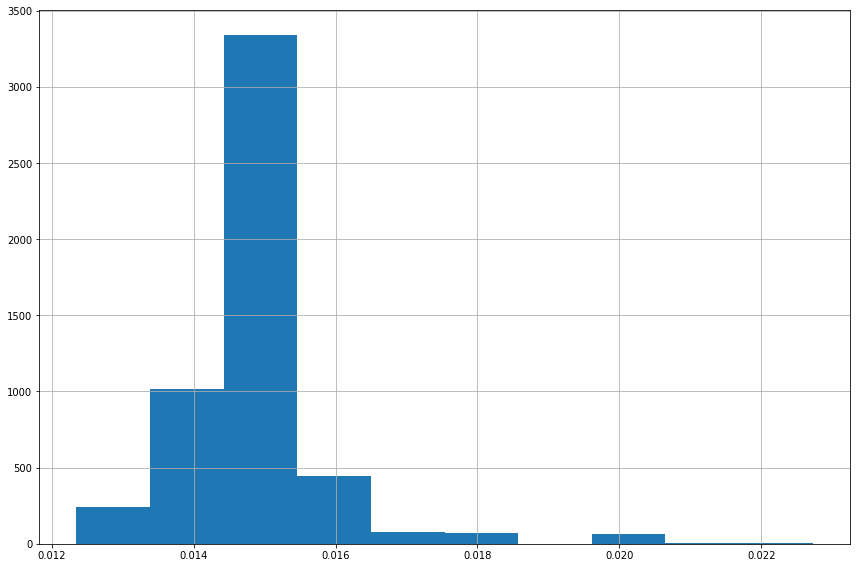

In [11]:
df_household.consumer_score.hist()
plt.show()

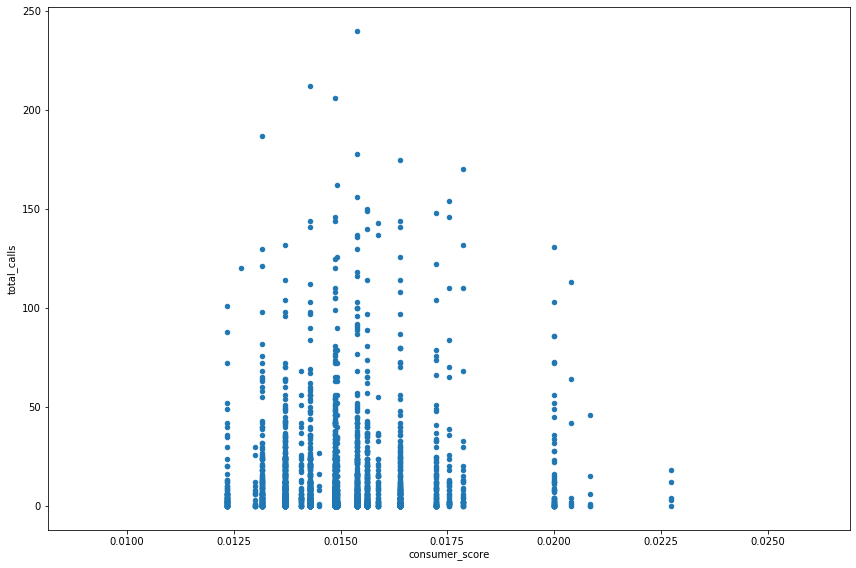

In [9]:
df_household.plot(x='consumer_score', y='total_calls',kind='scatter')
plt.show()

In [ ]:
df_household.head()

In [12]:
df_household['aaa_travel'].value_counts()

0    4529
1     732
Name: aaa_travel, dtype: int64

# Cars that are most likely to break down 
https://247wallst.com/special-report/2019/12/12/these-new-cars-are-most-likely-to-break-down/2/

# Top Car 35 Car brand according to consumer reports
https://www.autonews.com/retail/subaru-reaches-top-consumer-reports-rankings-tesla-falters


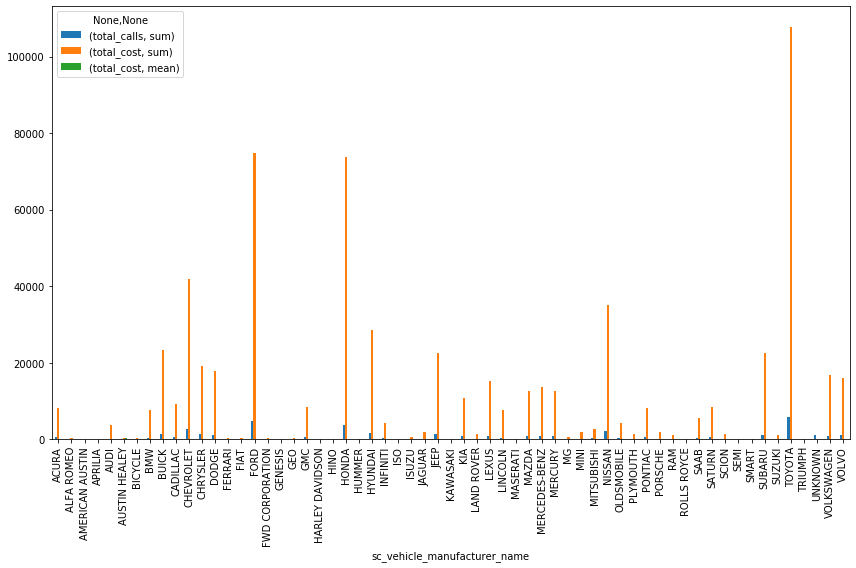

In [13]:
df_group_veh_manuf = df_transaction.groupby(by='sc_vehicle_manufacturer_name').agg(({'total_calls':sum, 
                                                                                     'total_cost' :['sum','mean']
                                                                                    })).plot(kind='bar')


In [ ]:
df_transaction.info(verbose=True)

In [15]:
df_household.groupby(by=var_to_predict).mean()

,membership_id,household_key,zip,aaa_no_tenure,aaa_member_tenure_years,aaa_mean_age,length_of_residence,aaa_mortgage,aaa_credit_card,aaa_deposit,aaa_home_equity,aaa_financial_service,aaa_auto_insurance,aaa_id_theft,aaa_motorcycle_indicator,aaa_mean_child,aaa_mean_total_cost,aaa_no_race,aaa_no_home_owner,aaa_no_education,aaa_no_income,aaa_no_dwelling_type,aaa_no_credit_ranges,aaa_no_gender,aaa_no_language,aaa_no_reason_joined,aaa_cancel_reason,aaa_no_mosaic_household,aaa_no_mosaic_global_household,aaa_no_kcl_b_ind_mosaicsgrouping,aaa_no_occupation_code,aaa_no_occupation_group,aaa_no_occupant_type,aaa_no_plus_indicator_description,aaa_no_generation,total_calls_year_1,total_calls_year_2,total_calls_year_3,total_member_cost_1,total_member_cost_2,total_member_cost_3,basic_cost,plus_cost,premier_cost,mean_basic_cost,mean_plus_cost,mean_premier_cost,total_calls,total_member_cost,mean_total_member_cost,total_tow_miles,mean_tow_miles,total_cost,mean_total_cost,total_members_in_household,total_calls_veh,total_cost_veh,total_member_cost_veh,mean_total_calls_veh,mean_total_cost_veh,mean_total_member_cost_veh,consumer_score,use_road_side,aaa_cancel
aaa_travel,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,129402.0802,15020809.8055,3087.7854,1.2687,46.6816,75.4939,5.7508,0.0627,0.0943,0.0051,0.0013,0.0627,0.2621,0.0378,0.5450,1.6972,21.8036,2.7987,0.1178,1.9749,5.1207,0.4224,2.5403,1.5812,0.1903,2.8209,3.8562,10.9480,3.1724,5.0307,7.1831,5.6549,1.2924,0.9519,0.9491,1.5741,2.8596,2.9221,84.9818,154.8343,150.0030,106.9953,8.5831,0.0212,20.1436,1.4140,0.0069,7.3557,389.8191,53.9875,5.9265,0.9771,118.9327,21.8036,2.2676,1976.5615,23632.2998,103724.7204,1.4180,22.5471,75.2937,0.0149,0.5628,0.4738
1,102955.3702,13572057.3798,3093.0328,1.4030,46.8689,69.8136,7.4806,0.1148,0.2090,0.0068,0.0000,0.1148,0.3525,0.0874,0.5859,1.8084,26.9589,2.7179,0.0772,1.9614,4.9509,0.3213,2.4230,1.6518,0.1400,2.3000,4.6592,9.5533,2.8065,4.6293,7.4805,6.1556,1.4000,1.0629,1.4315,2.0738,3.6352,3.7842,113.5988,203.1294,199.9330,150.0622,12.6325,0.0000,24.9767,1.7066,0.0000,9.4932,516.6612,62.6908,8.3811,1.1961,164.6699,26.9589,2.8292,2099.1981,28287.9437,110483.5950,1.7373,28.1725,92.1520,0.0149,0.7077,0.2432


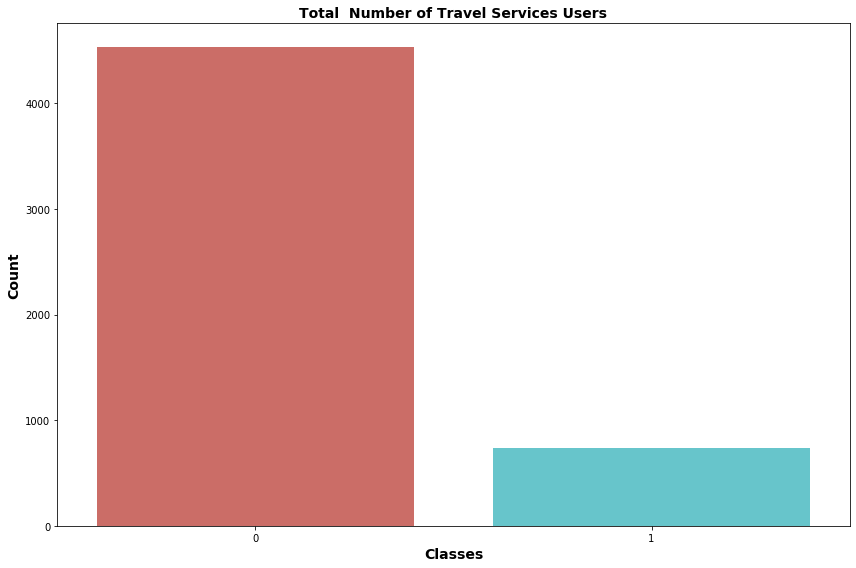

In [16]:
plt.figure(figsize=(12,8))
sns.countplot(x=var_to_predict[0],data=df_household, palette='hls')
plt.title('Total  Number of '+var_to_predict_title + ' Users',loc='center', fontdict={'fontsize':14, 'fontweight':'bold'})
plt.ylabel("Count",fontsize=14, fontweight='bold')
plt.xlabel("Classes", fontsize=14, fontweight='bold')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_count_plot')
plt.show()

In [17]:
# Number of members in household key
df_household.total_members_in_household.value_counts()

2     1907
1     1523
3      932
4      529
5      234
6       73
7       42
8        9
9        7
10       4
15       1
Name: total_members_in_household, dtype: int64

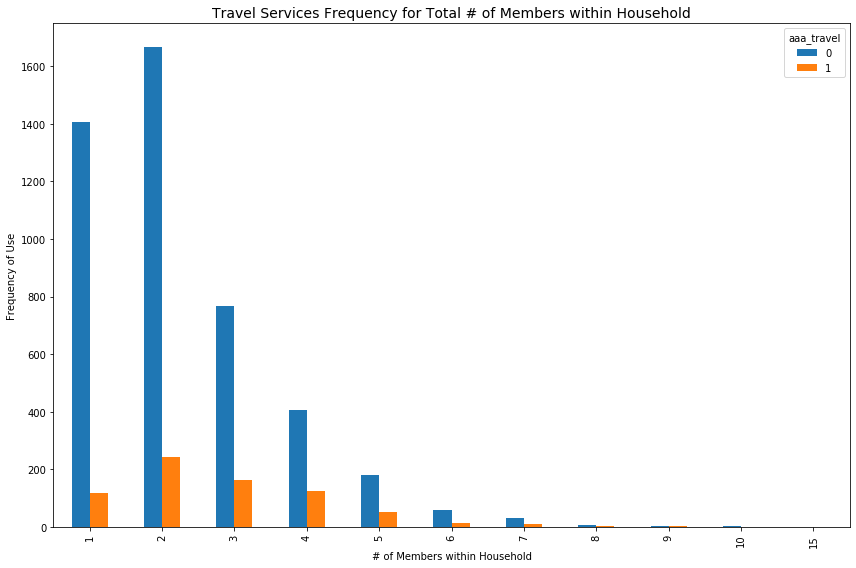

In [18]:
# graph income
pd.crosstab(df_household.total_members_in_household,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title + ' Frequency for Total # of Members within Household')
plt.xlabel('# of Members within Household')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'members_hh_use_'+var_to_predict_save)
plt.show()

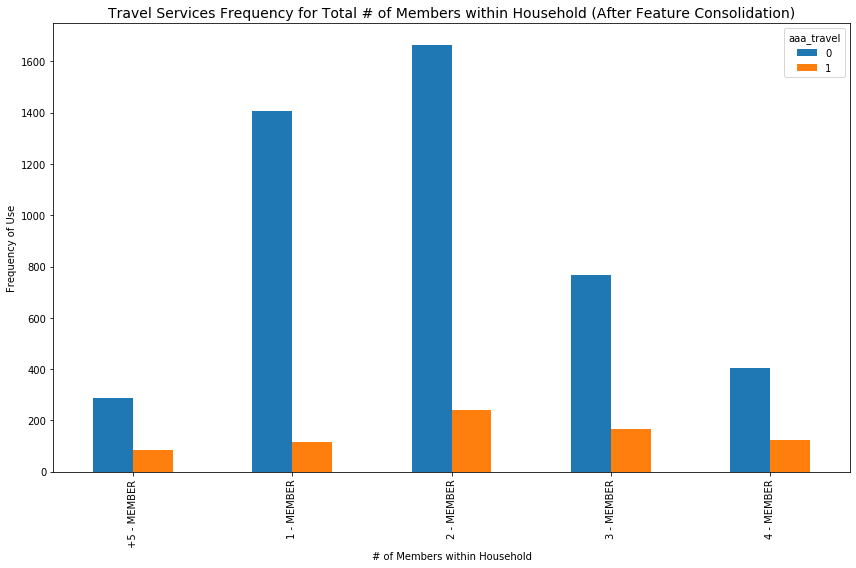

In [19]:
# Number of members

df_household['no_members'] = ' '
df_household['no_members']=np.where(df_household['total_members_in_household']== 1, '1 - MEMBER', 
                                    df_household['no_members'])
df_household['no_members']=np.where(df_household['total_members_in_household']== 2, '2 - MEMBER', 
                                    df_household['no_members'])
df_household['no_members']=np.where(df_household['total_members_in_household']== 3, '3 - MEMBER', 
                                    df_household['no_members'])
df_household['no_members']=np.where(df_household['total_members_in_household']== 4, '4 - MEMBER', 
                                    df_household['no_members'])

df_household['no_members']=np.where(df_household['total_members_in_household']> 4, '5 - MEMBER', 
                                    df_household['no_members'])
group5 = np.arange(5,20,1)
for i in group5:
    df_household['no_members']=np.where(df_household['total_members_in_household']== i, '+5 - MEMBER', 
                                    df_household['no_members'])
    
pd.crosstab(df_household.no_members,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Total # of Members within Household (After Feature Consolidation)')
plt.xlabel('# of Members within Household')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'members_hh_'+var_to_predict_save+'_feat')

In [20]:
# Income
df_household.income.value_counts()

UNKNOWN          2408
100-149,999       588
90-99,999         544
70-79,999         254
50-59,999         241
40-49,999         204
10-19,999         203
175 - 199,999     126
30-39,999         125
60-69,999         124
20-29,999         123
150 - 174,999      99
200 - 249,999      83
250K+              77
UNDER 10K          59
80-89,999           3
Name: income, dtype: int64

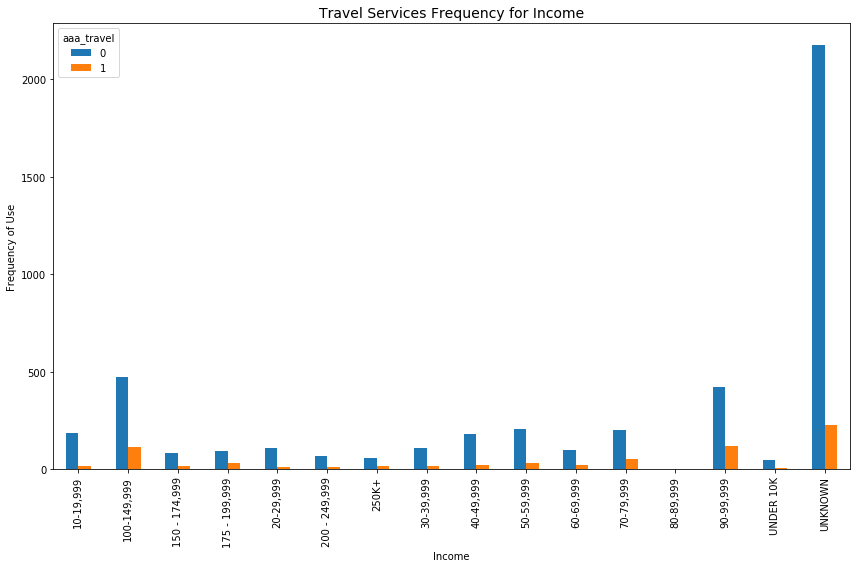

In [21]:
# graph income
pd.crosstab(df_household.income,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Income')
plt.xlabel('Income')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'income_use_'+var_to_predict_save)

# Outcomes
The frequency of id theft Service use depend heavvily on income. 
Will consolidate income in three categories: 
    * a) under 10k - 39999: Under 39.999
    * b) 40 - 99,999 : 40 - 99,999
    * c) 100k and above : 100+
    

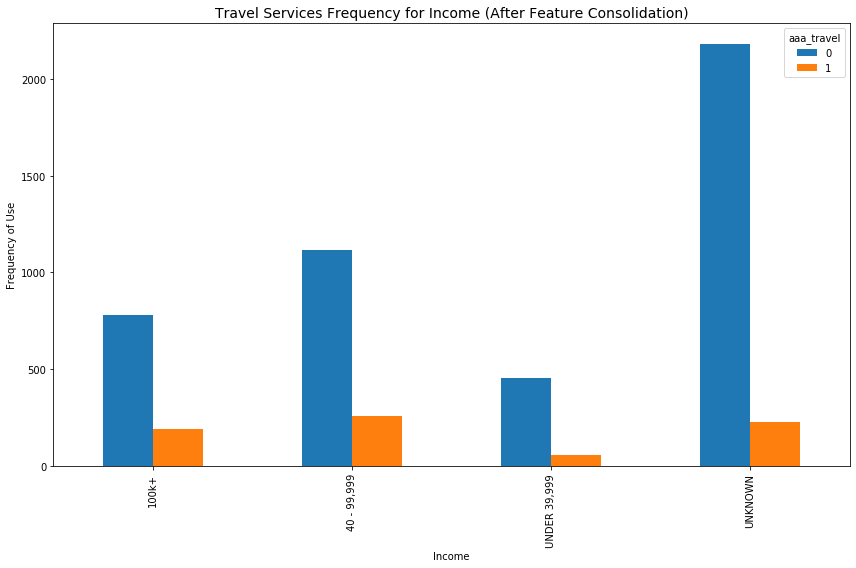

In [22]:
group1 = ['UNDER 10K', '10-19,999','20-29,999', '30-39,999']
group2 = ['40-49,999', '50-59,999', '60-69,999', '70-79,999', '80-89,999', '90-99,999']
group3 = ['100-149,999', '150 - 174,999', '175 - 199,999', '200 - 249,999', '250K+' ]
for i in group1:
    df_household['income']=np.where(df_household['income']== i, 'UNDER 39,999', df_household['income'])
for i in group2:
    df_household['income']=np.where(df_household['income']== i, '40 - 99,999', df_household['income'])
for i in group3:
    df_household['income']=np.where(df_household['income']== i, '100k+', df_household['income'])

pd.crosstab(df_household.income,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Income (After Feature Consolidation)')
plt.xlabel('Income')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'income_use_feat_'+var_to_predict_save)

In [23]:
# Tenures
df_household.tenure.value_counts()

+40 YEARS                3160
BETWEEN 21 & 30 YEARS     473
BETWEEN 31 & 40 YEARS     422
BETWEEN 6 & 10 YEARS      366
BETWEEN 11 & 15 YEARS     362
BETWEEN 16 & 20 YEARS     312
BETWEEN 1 & 5 YEARS       153
< 1 YEAR                   13
Name: tenure, dtype: int64

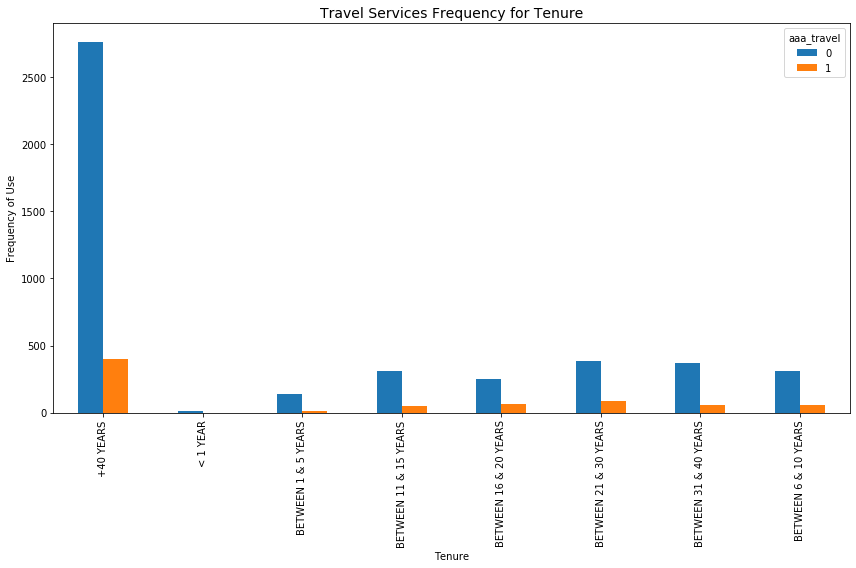

In [24]:
# graph tenure
pd.crosstab(df_household.tenure,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Tenure')
plt.xlabel('Tenure')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'tenure_use_'+var_to_predict_save)

# Outcomes
The frequency of id theft Service use depend heavily on tenures. Will consolidate tenure in three categories: 
    * a) above 40 years  
    * b) between 21 - 40 
    * c) Less 21 


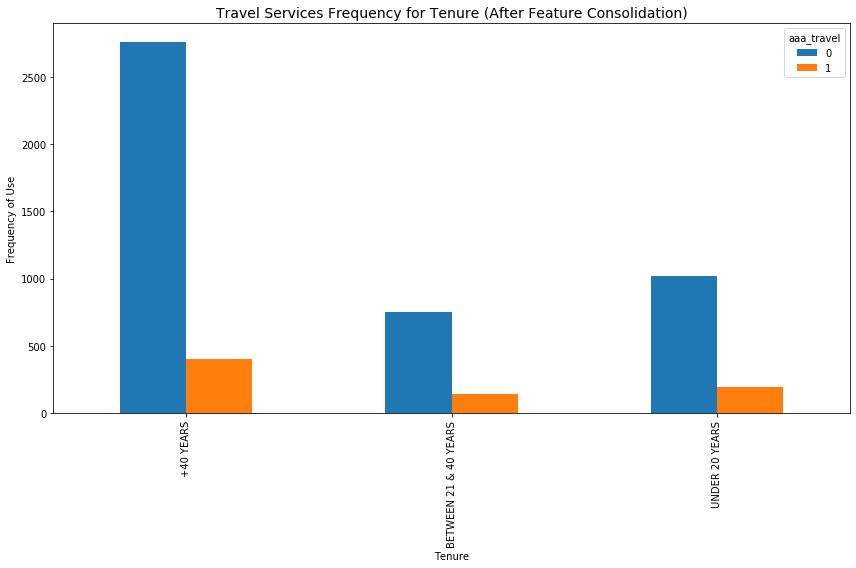

In [25]:
group1 = ['BETWEEN 6 & 10 YEARS', 'BETWEEN 11 & 15 YEARS', 
          'BETWEEN 16 & 20 YEARS', 'BETWEEN 1 & 5 YEARS', '< 1 YEAR']
group2 = ['BETWEEN 31 & 40 YEARS', 'BETWEEN 21 & 30 YEARS']
group3 = ['+40 YEARS']
for i in group1:
    df_household['tenure']=np.where(df_household['tenure']== i, 'UNDER 20 YEARS', df_household['tenure'])
for i in group2:
    df_household['tenure']=np.where(df_household['tenure']== i, 'BETWEEN 21 & 40 YEARS', df_household['tenure'])
for i in group3:
    df_household['tenure']=np.where(df_household['tenure']== i, '+40 YEARS', df_household['tenure'])

pd.crosstab(df_household.tenure,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Tenure (After Feature Consolidation)')
plt.xlabel('Tenure')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'tenure_use_feat_'+var_to_predict_save)

In [26]:
# Credit Ranges
df_household.credit_ranges.value_counts()

UNKNOWN       2503
750-799       1006
700-749        603
650-699        444
800+           417
600-649        201
550-599         47
500-549         37
499 & LESS       3
Name: credit_ranges, dtype: int64

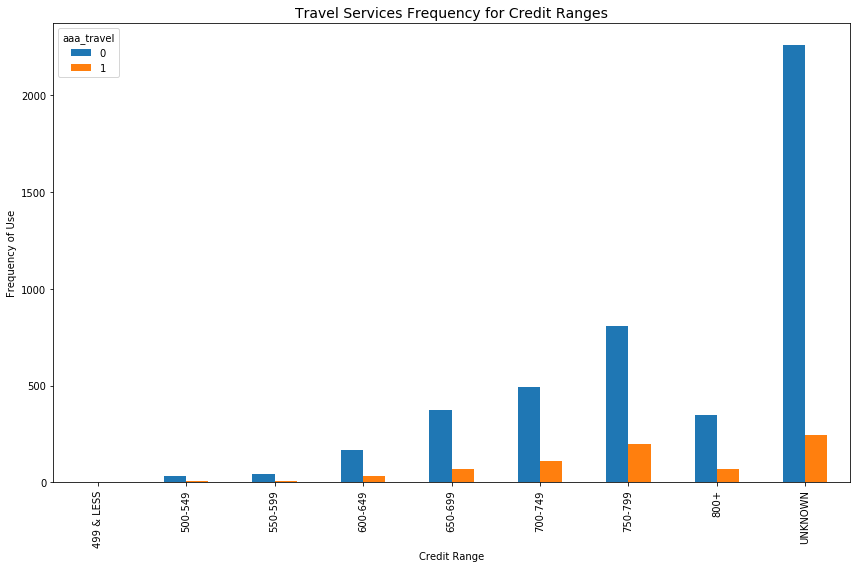

In [27]:
# graph credit ranges
pd.crosstab(df_household.credit_ranges,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Credit Ranges')
plt.xlabel('Credit Range')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'credit_ranges_use_'+var_to_predict_save)

# Outcomes
The frequency of id theft Service use depend heavily on credit_ranges. Will consolidate tenure in three categories: 
    * a) above 800 years 
    * b) between 700 - 799 
    * c) Below 700

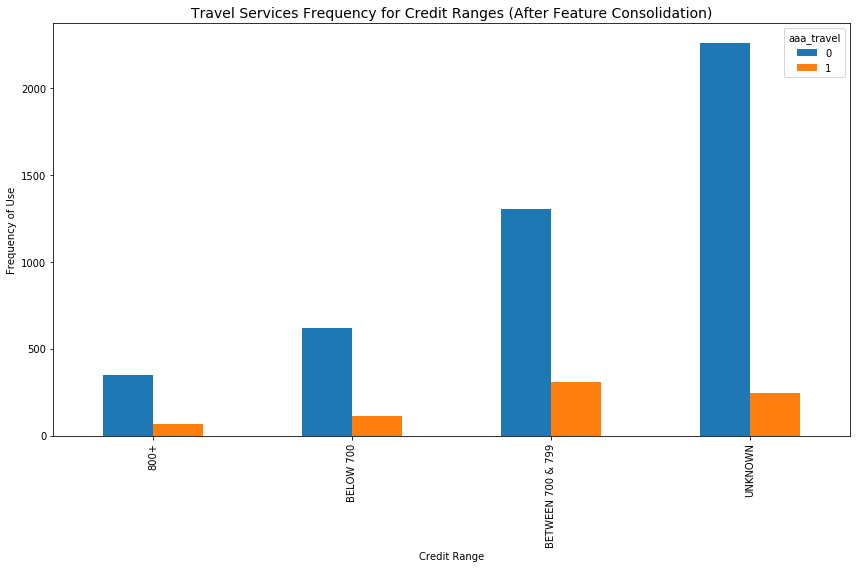

In [28]:
group1 = ['499 & LESS', '500-549','550-599','600-649', '650-699']
group2 = ['700-749', '750-799']
group3 = ['800+']
for i in group1:
    df_household['credit_ranges']=np.where(df_household['credit_ranges']== i, 'BELOW 700', df_household['credit_ranges'])
for i in group2:
    df_household['credit_ranges']=np.where(df_household['credit_ranges']== i, 'BETWEEN 700 & 799', df_household['credit_ranges'])
for i in group3:
    df_household['credit_ranges']=np.where(df_household['credit_ranges']== i, '800+', df_household['credit_ranges'])

pd.crosstab(df_household.credit_ranges,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Credit Ranges (After Feature Consolidation)')
plt.xlabel('Credit Range')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'credit_ranges_use_feat_'+var_to_predict_save)

In [29]:
# Education
df_household.education.value_counts()

UNKNOWN              3323
SOME COLLEGE          765
HIGH SCHOOL           738
COMPLETED COLLEGE     388
GRADUATED SCHOOL       47
Name: education, dtype: int64

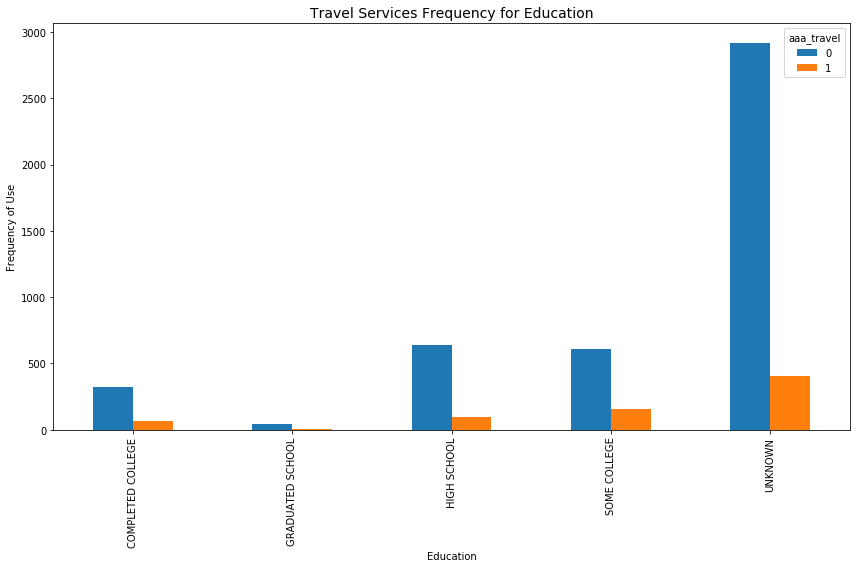

In [30]:
# graph education
pd.crosstab(df_household.education,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Education')
plt.xlabel('Education')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'education_use_'+var_to_predict_save)

# Outcomes
The frequency of id theft Service use depend heavily on education. Will consolidate graduate with completed collegue

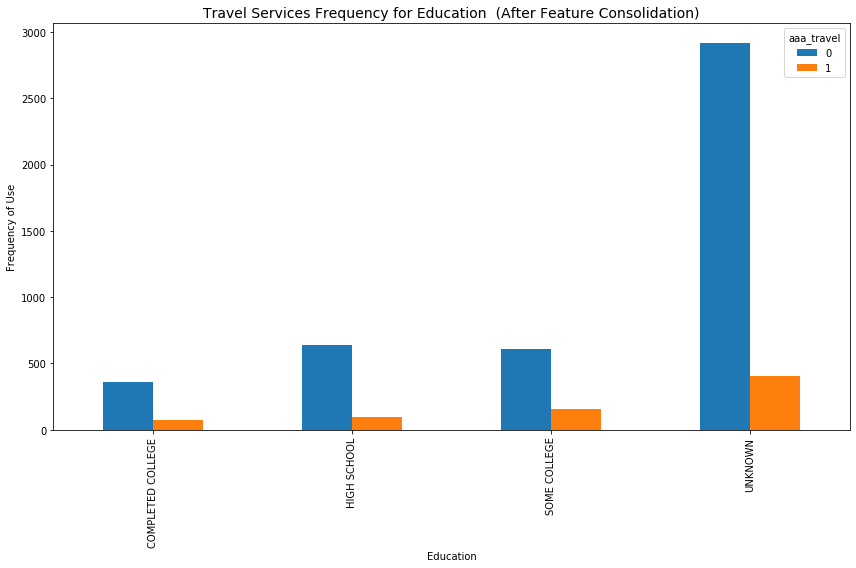

In [31]:
# graph education
df_household['education']=np.where(df_household['education'] =='GRADUATED SCHOOL', 
                                   'COMPLETED COLLEGE', df_household['education']
                                  )
pd.crosstab(df_household.education,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Education  (After Feature Consolidation)')
plt.xlabel('Education')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'education_use_feat_'+var_to_predict_save)

In [32]:
# Generation
df_household.generation.value_counts()

POST-WAR (< 1948)             3109
BABY BOOMERS (1948 - 1968)     979
UNKNOWN                        739
GENERATION X (1969 - 1980)     221
MILLENIALS (1981 - 1993)       200
GENERATION Z (1994 - 2010)      13
Name: generation, dtype: int64

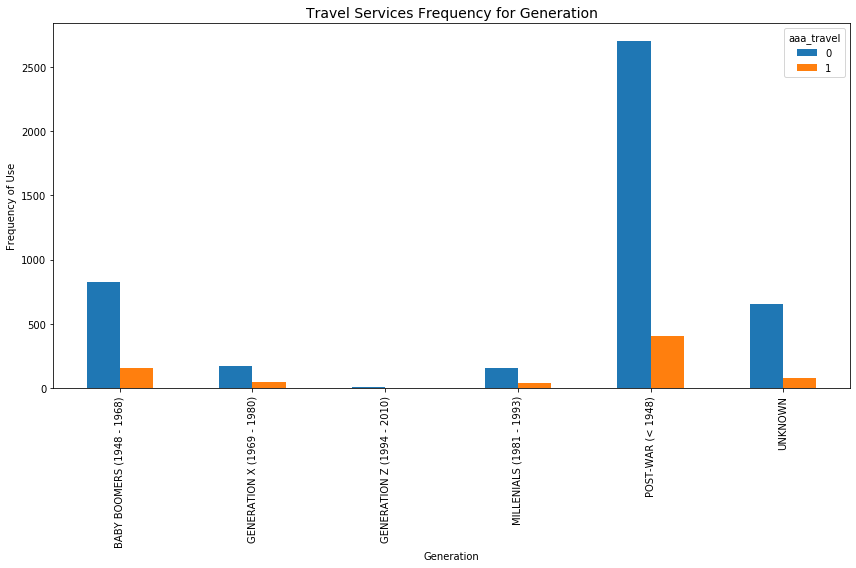

In [33]:
# graph Generation
pd.crosstab(df_household.generation,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Generation')
plt.xlabel('Generation')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'generation_use_'+var_to_predict_save)

In [34]:
# Race
df_household.race.value_counts()

UNKNOWN                                   2455
CAUCASION / WHITE - EUROPEAN              1287
CAUCASION / WHITE - ENGLISH                695
CAUCASION / WHITE - WHITE NON-AMERICAN     255
CAUCASION / WHITE - UNKNOWN                113
MIDDLE EASTERN - ARAB                      104
HISPANIC - HISPANIC ORIGIN                  97
CAUCASION / WHITE - EASTERN EUROPEAN        85
HISPANIC - PORTUGUESE ORIGIN                76
CAUCASION / WHITE - JEWISH                  22
ASIAN - CHINESE                             18
CAUCASION / WHITE - GREEK                   14
AFRICAN AMERICAN - AFRICAN ORIGIN            9
ASIAN - UNKNOWN                              9
ASIAN - INDIAN                               6
AMERICAN INDIAN                              6
MIDDLE EASTERN - EGYPTIAN                    4
ASIAN - JAPANESE                             4
CAUCASION / WHITE - DUTCH                    1
ASIAN - ORIENTAL                             1
Name: race, dtype: int64

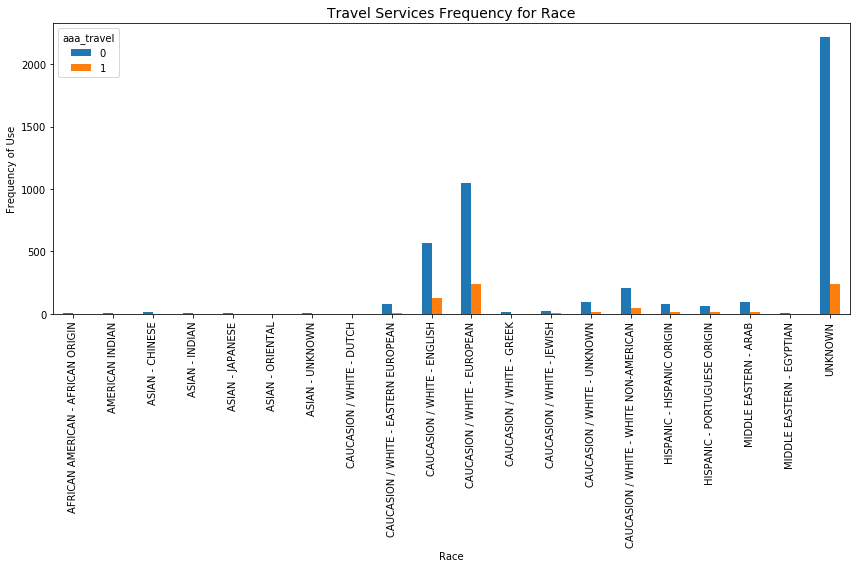

In [35]:
# graph race
pd.crosstab(df_household.race,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Race')
plt.xlabel('Race')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'race_use_'+var_to_predict_save)

# Observations
The frequency of id theft Service use depend heavily on race being caucasion- white group the predominant. 
I Will consolidate them in more similar groups
    * a) Caucasion - White
    * b) Hispanic
    * c) Asian
    * d) Arabs
    * e) America Africans / Indians

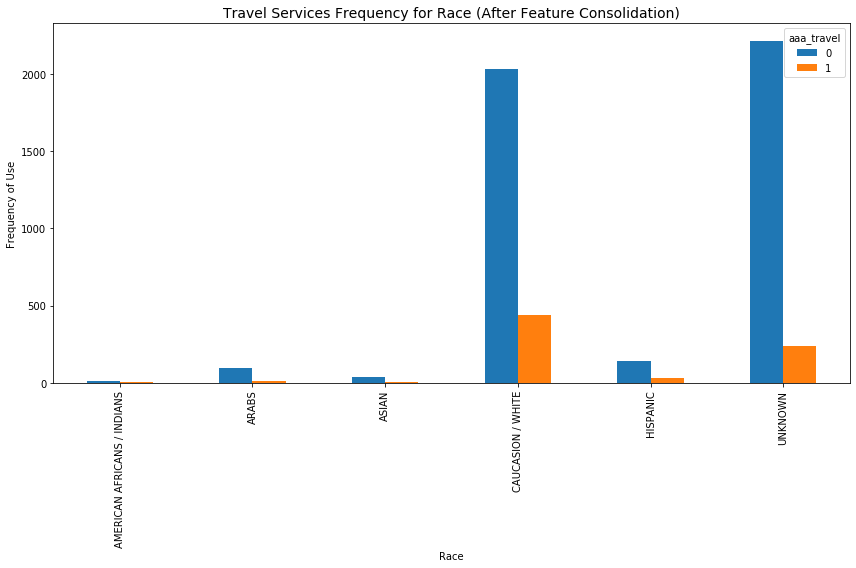

In [36]:
group1 = ['CAUCASION / WHITE - EUROPEAN', 'CAUCASION / WHITE - ENGLISH', 'CAUCASION / WHITE - WHITE NON-AMERICAN',
          'CAUCASION / WHITE - UNKNOWN', 'CAUCASION / WHITE - EASTERN EUROPEAN', 'CAUCASION / WHITE - JEWISH',
          'CAUCASION / WHITE - GREEK', 'CAUCASION / WHITE - DUTCH'
         ]
group2 = ['HISPANIC - HISPANIC ORIGIN', 'HISPANIC - PORTUGUESE ORIGIN']
group3 = ['ASIAN - CHINESE', 'ASIAN - UNKNOWN', 'ASIAN - JAPANESE', 'ASIAN - INDIAN', 'ASIAN - ORIENTAL']
group4 = ['MIDDLE EASTERN - ARAB', 'MIDDLE EASTERN - EGYPTIAN']
group5 = ['AFRICAN AMERICAN - AFRICAN ORIGIN', 'AMERICAN INDIAN']

for i in group1:
    df_household['race']=np.where(df_household['race']== i, 'CAUCASION / WHITE', df_household['race'])
for i in group2:
    df_household['race']=np.where(df_household['race']== i, 'HISPANIC', df_household['race'])
for i in group3:
    df_household['race']=np.where(df_household['race']== i, 'ASIAN', df_household['race'])
for i in group4:
    df_household['race']=np.where(df_household['race']== i, 'ARABS', df_household['race'])
for i in group5:
    df_household['race']=np.where(df_household['race']== i, 'AMERICAN AFRICANS / INDIANS', df_household['race'])

pd.crosstab(df_household.race,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Race (After Feature Consolidation)')
plt.xlabel('Race')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'race_use_feat_'+var_to_predict_save)

In [37]:
# Home Owner
df_household.home_owner.value_counts()

HOME OWNER             2641
UNKNOWN                2493
RENTER                  118
PROBABLE RENTER           6
PROBABLE HOME OWNER       3
Name: home_owner, dtype: int64

# Outcomes
The frequency of id theft Service use depend heavily on home_owner.  Will leave consolidate probable renter with RENTER and probable home owner with home owner 

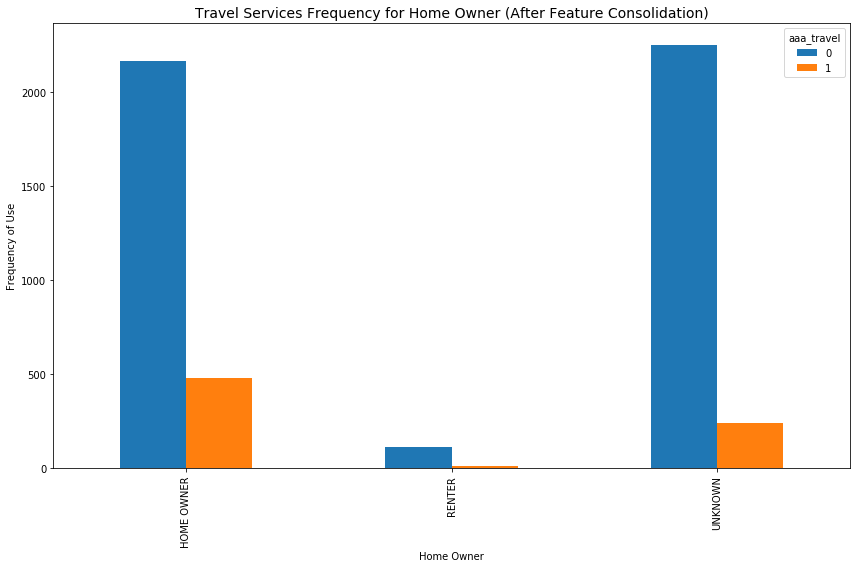

In [38]:
# Home Owner
df_household['home_owner']=np.where(df_household['home_owner']== 'PROBABLE RENTER', 'RENTER', df_household['home_owner'])
df_household['home_owner']=np.where(df_household['home_owner']== 'PROBABLE HOME OWNER', 'HOME OWNER', df_household['home_owner'])

pd.crosstab(df_household.home_owner,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Home Owner (After Feature Consolidation)')
plt.xlabel('Home Owner')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'home_owner_use_feat_'+var_to_predict_save)

In [39]:
# Cancel reason
df_household.cancel_reason.value_counts()

UNKNOWN                               2937
NON-PAYMENT                            870
DECEASED                               589
MEMBERS REQUEST                        331
NO LONGER DRIVING                      174
CANCELLED DO NOT RENEW                  77
TRANSFER MEMBER                         63
DUP MEMBERSHIP                          49
DATA PROBLEM                            49
TRANSFER MEMBER SUSPEND                 35
MOVED OUT OF TERR                       25
DO NOT RENEW                            25
CANCELLED MBRS REQUEST                   5
CANCEL PROCESS - RENEWAL NO PAY          5
ERS DECLINE CC                           4
HEALTH ISSUE                             4
NO LONGER IN HOUSEHOLD                   4
CANCEL PROCESS - FUTURE CANCEL DNR       2
NONCOMPLIANT AGE                         2
BAD ADD SET BY PO ACS                    2
*BAD CHECKS*                             2
ERS EXCESS USAGE                         1
ERS CNCL MSHIP PROGRAM                   1
PO RETURN  

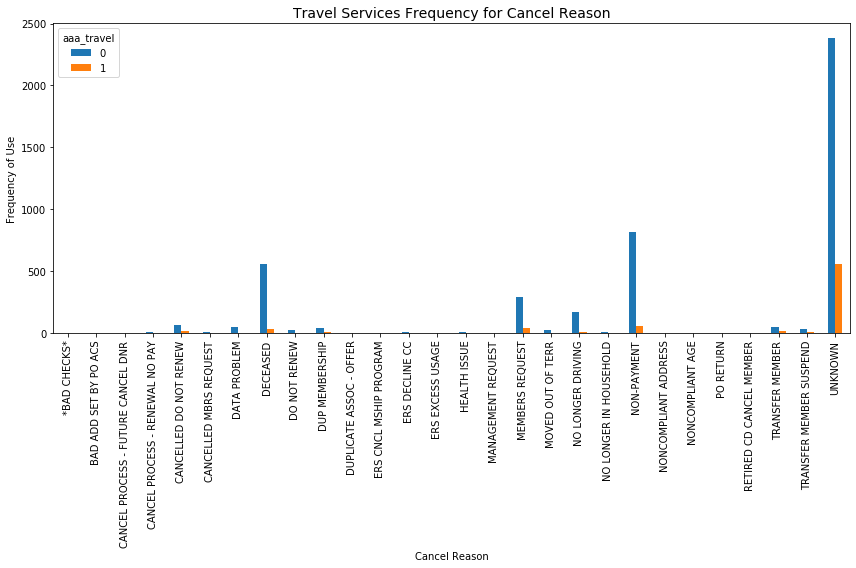

In [40]:
# graph Cancel Reason
pd.crosstab(df_household.cancel_reason,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Cancel Reason')
plt.xlabel('Cancel Reason')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'cancel_reason_use_'+var_to_predict_save)

# Observation
This Cancel Reason feature does not seems to be important to weather member choose or not id theft. Even though, for instance those member that their suscription was cancelled or CC rejected, there might be an oportunity to get a CC if credit is available to them.  Will consolidate the reason in three main groups:
* a) PAYMENT ISSUES
* b) MEMBER ISSUES
* c) DATA/AAA ISSUES

UKNOWN will be replaced by 'NOT CANCELLED'  It is the largest group and a potential to customer.

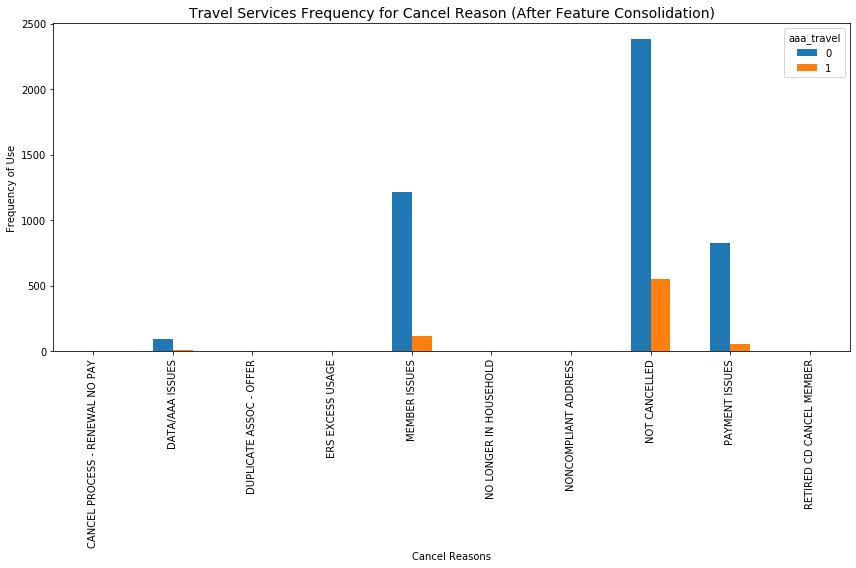

In [41]:
group1 = ['NON-PAYMENT', 'ERS DECLINE CC', 'BAD ADD SET BY PO ACS', '*BAD CHECKS*', 
         ]
group2 = ['DECEASED', 'NO LONGER DRIVING', 'MEMBERS REQUEST', 'CANCELLED DO NOT RENEW', 'TRANSFER MEMBER',
          'DO NOT RENEW', 'MOVED OUT OF TERR', 'TRANSFER MEMBER SUSPEND', 'CANCELLED MBRS REQUEST',
          'HEALTH ISSUE', 'NONCOMPLIANT AGE', 'PO RETURN'
         ]
group3 = ['DATA PROBLEM','DUP MEMBERSHIP','ERS CNCL MSHIP PROGRAM','MANAGEMENT REQUEST', 'CANCEL PROCESS - FUTURE CANCEL DNR']

for i in group1:
    df_household['cancel_reason']=np.where(df_household['cancel_reason']== i, 'PAYMENT ISSUES', df_household['cancel_reason'])
for i in group2:
    df_household['cancel_reason']=np.where(df_household['cancel_reason']== i, 'MEMBER ISSUES', df_household['cancel_reason'])
for i in group3:
    df_household['cancel_reason']=np.where(df_household['cancel_reason']== i, 'DATA/AAA ISSUES', df_household['cancel_reason'])

df_household['cancel_reason']=np.where(df_household['cancel_reason']== 'UNKNOWN', 'NOT CANCELLED', df_household['cancel_reason'])

pd.crosstab(df_household.cancel_reason,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Cancel Reason (After Feature Consolidation)')
plt.xlabel('Cancel Reasons')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'cancel_reason_use_feat_'+var_to_predict_save)

In [42]:
# mosaic_household
df_household.mosaic_household.value_counts()

UNKNOWN                       1530
AGING IN PLACE                 684
SILVER SOPHISTICATES           332
REAPING REWARDS                246
NO PLACE LIKE HOME             238
ROOTED FLOWER POWER            219
TOWN ELDERS                    196
SENIOR DISCOUNTS               173
AGING OF AQUARIUS              158
SETTLED IN SUBURBIA            140
FULL POCKETS  EMPTY NESTS      116
DIGITAL DEPENDENTS             108
BOHEMIAN GROOVE                 73
FAST TRACK COUPLES              72
BLUE COLLAR COMFORT             69
PLATINUM PROSPERITY             65
FAMILY FUN-TASTIC               61
AMERICAN ROYALTY                58
PROGRESSIVE POTPOURRI           51
STATUS SEEKING SINGLES          45
BOOMERS AND BOOMERANGS          44
GOLF CARTS AND GOURMETS         42
UNSPOILED SPLENDOR              41
MID-SCALE MEDLEY                39
BIRKENSTOCKS AND BEEMERS        39
PICTURE PERFECT FAMILIES        38
COUPLES WITH CLOUT              28
SETTLED AND SENSIBLE            25
GENERATIONAL SOUP   

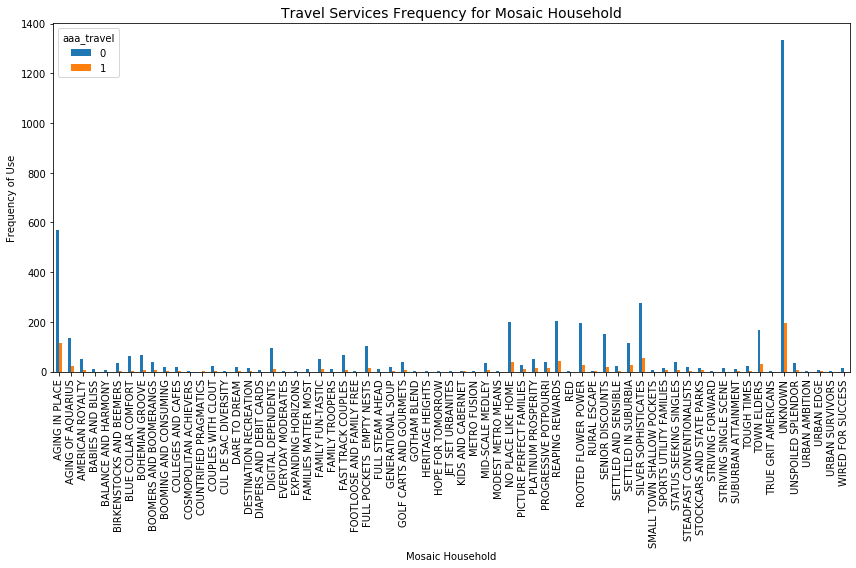

In [43]:
# graph Mosaic household
pd.crosstab(df_household.mosaic_household,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Mosaic Household')
plt.xlabel('Mosaic Household')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'mosaic_household_use_'+var_to_predict_save)

In [44]:
# mosaic_household
df_household.mosaic_global_household.value_counts()

UNKNOWN                      1530
COMFORTABLE RETIREMENT       1168
BOURGEOIS PROSPERITY          843
ROUTINE SERVICE WORKERS       548
HARD WORKING BLUE COLLAR      267
CAREER AND FAMILY             245
POST INDUSTRIAL SURVIVORS     228
LOW INCOME ELDERS             222
METROPOLITAN STRUGGLERS       143
SOPHISTICATED SINGLES          64
RURAL INHERITANCE               3
Name: mosaic_global_household, dtype: int64

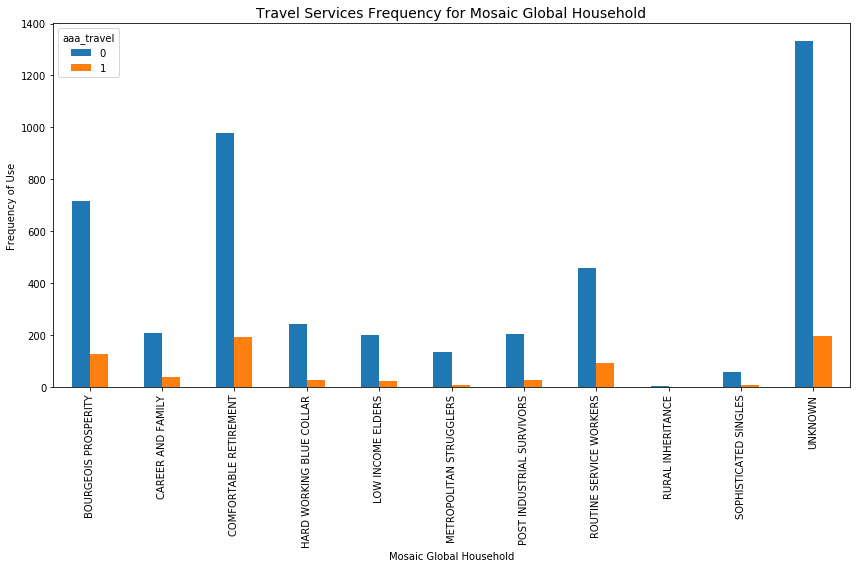

In [45]:
# graph Mosaic Global household
pd.crosstab(df_household.mosaic_global_household,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Mosaic Global Household')
plt.xlabel('Mosaic Global Household')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'mosaic_global_household_use_'+var_to_predict_save)

# Observation
Reviewing the graph above, these three groups can be consolidated in:
* a) METROPOLITAN STRUGGLERS into ROUTINE SERVICE WORKERS
* b) SOPHISTICATED SINGLES into BOURGEOIS PROSPERITY
* c) RURAL INHERITANCE into CAREER AND FAMILY
* d) POST INDUSTRIAL SURVIVORS into ROUTINE SERVICE WORKERS

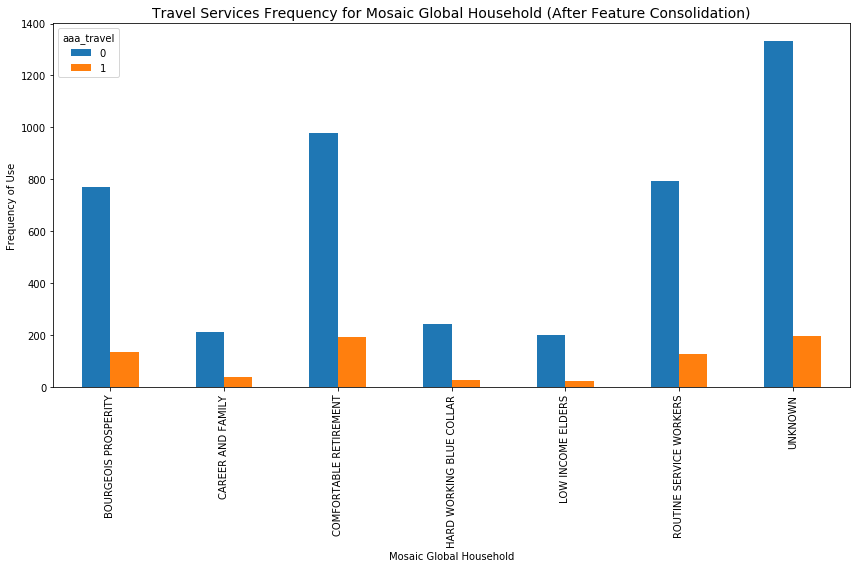

In [46]:
df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'METROPOLITAN STRUGGLERS', 
                                                 'ROUTINE SERVICE WORKERS', df_household['mosaic_global_household']
                                                )

df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'SOPHISTICATED SINGLES', 
                                                 'BOURGEOIS PROSPERITY', df_household['mosaic_global_household']
                                                )

df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'RURAL INHERITANCE', 
                                                 'CAREER AND FAMILY', df_household['mosaic_global_household']
                                                )
df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'POST INDUSTRIAL SURVIVORS', 
                                                 'ROUTINE SERVICE WORKERS', df_household['mosaic_global_household']
                                                )

pd.crosstab(df_household.mosaic_global_household,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))

plt.title(var_to_predict_title+' Frequency for Mosaic Global Household (After Feature Consolidation)')
plt.xlabel('Mosaic Global Household')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'mosaic_global_household_use_feat_'+var_to_predict_save)

In [47]:
# kcl_b_ind_mosaicsgrouping
df_household.kcl_b_ind_mosaicsgrouping.value_counts()

UNKNOWN                     1530
AUTUMN YEARS                 713
GOLDEN YEAR GUARDIANS        619
BOOMING WITH CONFIDENCE      576
THRIVING BOOMERS             395
BLUE SKY BOOMERS             240
POWER ELITE                  195
SURBURBAN STYLE              174
SINGLES AND STARTERS         164
FAMILY UNION                 116
MIDDLE CLASS MELTING POT     107
FLOURISHING FAMILIES          95
SIGNIFICANT SINGLES           91
PROMISING FAMILIES            83
YOUNG CITY SOLOS              51
CULTURAL CONNECTIONS          47
ECONOMIC CHALLENGES           33
ASPIRATIONAL FUSION           22
FAMILIES IN MOTION             8
PASTORAL PRIDE                 2
Name: kcl_b_ind_mosaicsgrouping, dtype: int64

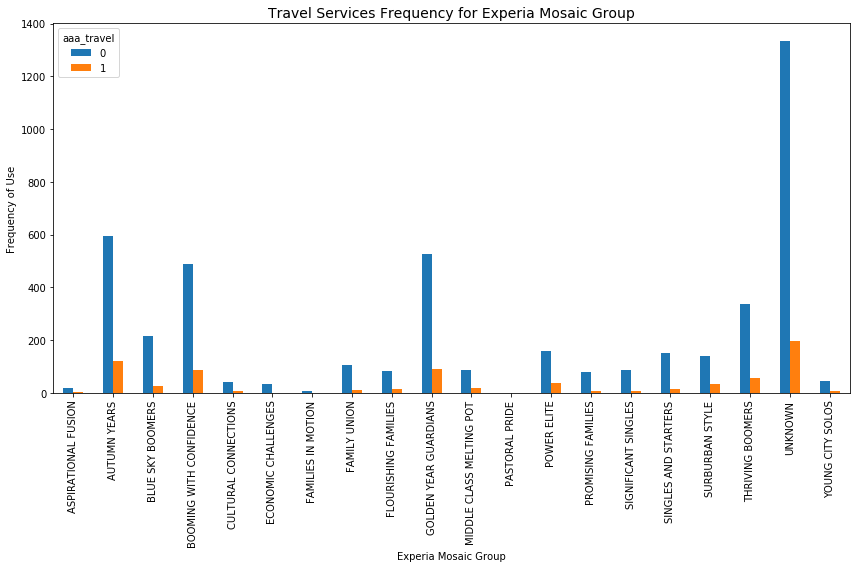

In [48]:
# graph kcl_b_ind_mosaicsgrouping
pd.crosstab(df_household.kcl_b_ind_mosaicsgrouping,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Experia Mosaic Group')
plt.xlabel('Experia Mosaic Group')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'kcl_b_ind_mosaicsgrouping_use_'+var_to_predict_save)

# Observation
Reviewing the graph above, there are five dominant group here
* a) GOLDEN YEARS - retired people
* b) BOOMING - well established families
* c) POWER ELITE - powerufull wealth people
* d) FAMILY - middle class families
* e) Singles - singles or single moms.

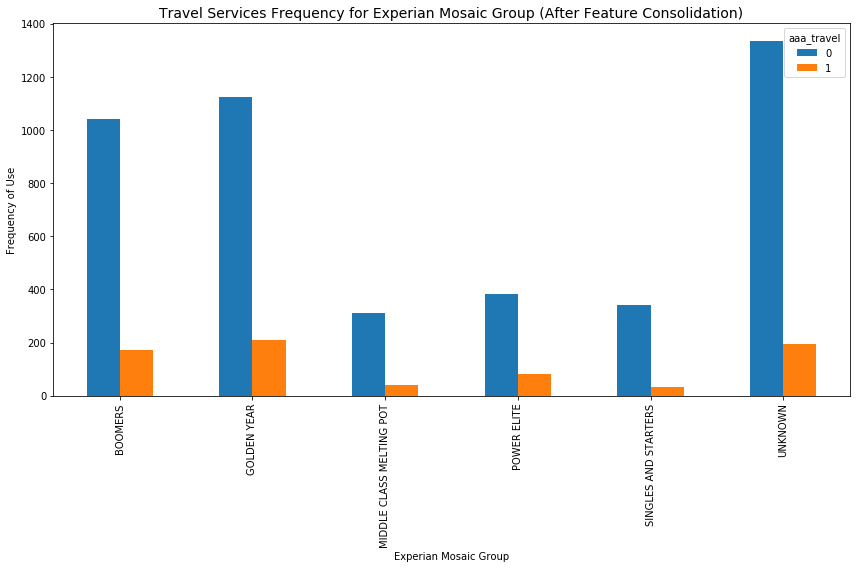

In [49]:
group1 = ['AUTUMN YEARS', 'GOLDEN YEAR GUARDIANS']
group2 = ['BOOMING WITH CONFIDENCE', 'THRIVING BOOMERS', 'BLUE SKY BOOMERS']
group3 = ['POWER ELITE', 'SURBURBAN STYLE', 'FLOURISHING FAMILIES']
group4 = ['FAMILY UNION', 'MIDDLE CLASS MELTING POT', 'PROMISING FAMILIES', 'ECONOMIC CHALLENGES', 'FAMILIES IN MOTION',
          'PASTORAL PRIDE']
group5 = ['SINGLES AND STARTERS', 'SIGNIFICANT SINGLES', 'YOUNG CITY SOLOS', 'CULTURAL CONNECTIONS',
         'ASPIRATIONAL FUSION']
for i in group1:
    df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'GOLDEN YEAR', df_household['kcl_b_ind_mosaicsgrouping'])
for i in group2:
    df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'BOOMERS', df_household['kcl_b_ind_mosaicsgrouping'])
for i in group3:
    df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'POWER ELITE', df_household['kcl_b_ind_mosaicsgrouping'])
for i in group4:
    df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'MIDDLE CLASS MELTING POT', df_household['kcl_b_ind_mosaicsgrouping'])
for i in group5:
    df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'SINGLES AND STARTERS', df_household['kcl_b_ind_mosaicsgrouping'])

pd.crosstab(df_household.kcl_b_ind_mosaicsgrouping,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))

plt.title(var_to_predict_title+' Frequency for Experian Mosaic Group (After Feature Consolidation)')
plt.xlabel('Experian Mosaic Group')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'kcl_b_ind_mosaicsgrouping_use_feat_'+var_to_predict_save)

In [50]:
# Vehicle Manufacturer
df_household.sc_vehicle_manufacturer_name.value_counts()

UNKNOWN            2652
TOYOTA              469
FORD                319
HONDA               285
CHEVROLET           202
NISSAN              130
HYUNDAI             122
BUICK               116
SUBARU               86
DODGE                78
CHRYSLER             66
LEXUS                60
JEEP                 60
MERCURY              52
MERCEDES-BENZ        49
VOLKSWAGEN           49
MAZDA                45
VOLVO                44
KIA                  44
CADILLAC             40
BMW                  32
ACURA                32
SATURN               32
GMC                  31
LINCOLN              28
PONTIAC              27
OLDSMOBILE           18
INFINITI             18
AUDI                 16
SAAB                 12
SCION                 7
MITSUBISHI            7
LAND ROVER            6
PLYMOUTH              6
MINI                  6
FIAT                  3
GEO                   3
SUZUKI                2
JAGUAR                2
AMERICAN AUSTIN       1
ISUZU                 1
PORSCHE         

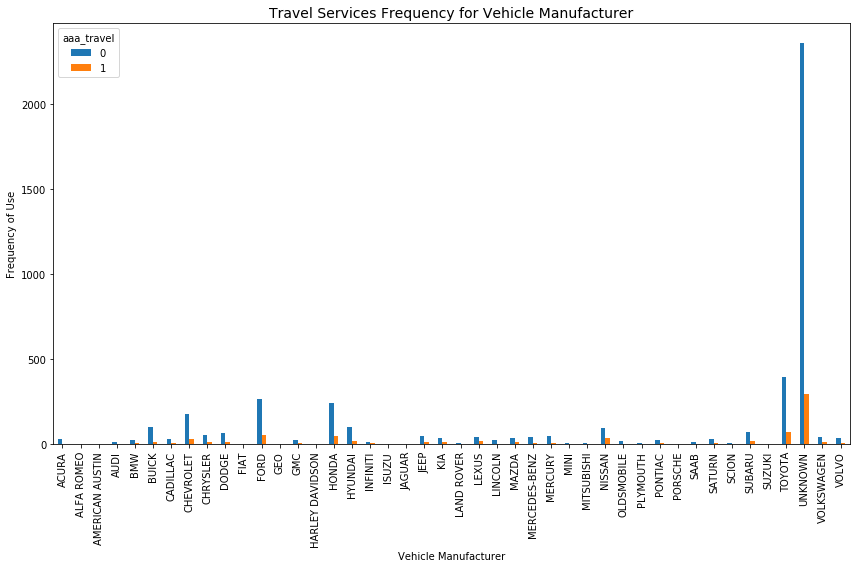

In [51]:
# graph Vehicle manufacturer
pd.crosstab(df_household.sc_vehicle_manufacturer_name,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Vehicle Manufacturer')
plt.xlabel('Vehicle Manufacturer')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'vehicle_manufacturer_use_'+var_to_predict_save)

# Observation
Reviewing the graph above, there are four main group of car.  

* a) Standard for small families, and young professional, 
* b) Middle End - Middle class families and middle management
* c) High End - Success and upper management or people above 55 years no debts and no kids at school

Going to group the vehicle manufacturer in those three groups.

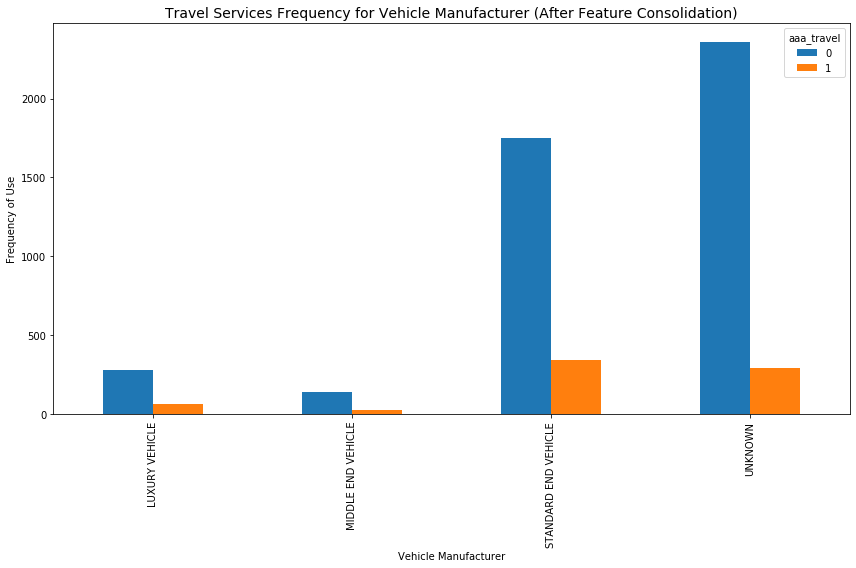

In [54]:
group1 = [ 'TOYOTA', 'FORD', 'HONDA', 'CHEVROLET', 'HYUNDAI', 'NISSAN', 'BUICK', 'SUBARU', 'SUZUKI',
         'DODGE', 'CHRYSLER', 'VOLKSWAGEN','KIA', 'MAZDA', 'SATURN', 'PONTIAC', 'SCION', 'MITSUBISHI',
          'GEO', 'CRYSLER', 'MG', 'FIAT', 'BICYCLE', 'ISUZU']
group2 = ['JEEP', 'MERCURY','GMC', 'OLSMOBILE', 'RAM', 'PLYMOUTH', 'GENESIS', 'OLDSMOBILE', 'AMERICAN AUSTIN']
          
group3 = ['LEXUS', 'VOLVO', 'MERCEDES-BENZ', 'CADILLAC','LINCOLN', 'ACURA', 'BMW', 'SAAB', 'AUDI', 'INFINITI',
          'LAND ROVER', 'MINI', 'JAGUAR', 'PORSCHE', 'HARLEY DAVIDSON', 'ALFA ROMEO']

for i in group1:
    df_household['sc_vehicle_manufacturer_name']=np.where(df_household['sc_vehicle_manufacturer_name']== i, 'STANDARD END VEHICLE', df_household['sc_vehicle_manufacturer_name'])
for i in group2:
    df_household['sc_vehicle_manufacturer_name']=np.where(df_household['sc_vehicle_manufacturer_name']== i, 'MIDDLE END VEHICLE', df_household['sc_vehicle_manufacturer_name'])
for i in group3:
    df_household['sc_vehicle_manufacturer_name']=np.where(df_household['sc_vehicle_manufacturer_name']== i, 'LUXURY VEHICLE', df_household['sc_vehicle_manufacturer_name'])


pd.crosstab(df_household.sc_vehicle_manufacturer_name,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Vehicle Manufacturer (After Feature Consolidation)')
plt.xlabel('Vehicle Manufacturer')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'vehicle_manufacturer_use_feat_'+var_to_predict_save)

In [55]:
# Occupation Code
df_household.occupation_code.value_counts()

UNKNOWN                            4359
RETIRED                             216
PROFESSIONAL/TECHNICAL              119
UPPER MANAGEMENT/EXECUTIVE           80
NURSE                                75
CLERICAL/OFFICE                      60
SKILLEDTRADE/MACHINE/LABORER         56
TEACHER/EDUCATOR                     54
MIDDLE MANAGEMENT                    51
SALES/MARKETING                      28
BEAUTY                               21
REAL ESTATE                          17
SELF EMPLOYED                        14
EXECUTIVE/ADMINISTRATOR              11
ATTORNEYS                            11
HEALTH SERVICES                       9
COUNSELORS                            8
PROFESSIONAL DRIVER                   7
PHARMACIST                            6
RETAIL SALES                          5
COMPUTER PROFESSIONAL                 5
DENTIST/DENTAL HYGIENIST              5
ENGINEERS                             5
ACCOUNTANTS/CPA                       4
MILITARY                              4


In [56]:
df_household.occupation_group.value_counts()

UNKNOWN                             3236
RETIRED - INFERRED                   631
PROFESSIONAL - KNOWN                 300
RETIRED - KNOWN                      216
MANAGEMENT - KNOWN                   151
MANAGEMENT - INFERRED                106
OTHER - INFERRED                      82
PROFESSIONAL - INFERRED               80
OFFICE ADMINISTRATION - INFERRED      72
BLUE COLLAR - INFERRED                72
BLUE COLLAR - KNOWN                   65
OFFICE ADMINISTRATION - KNOWN         60
SALES - KNOWN                         50
TECHNICAL - INFERRED                  47
OTHER - KNOWN                         45
SALES - INFERRED                      33
TECHNICAL - KNOWN                     15
Name: occupation_group, dtype: int64

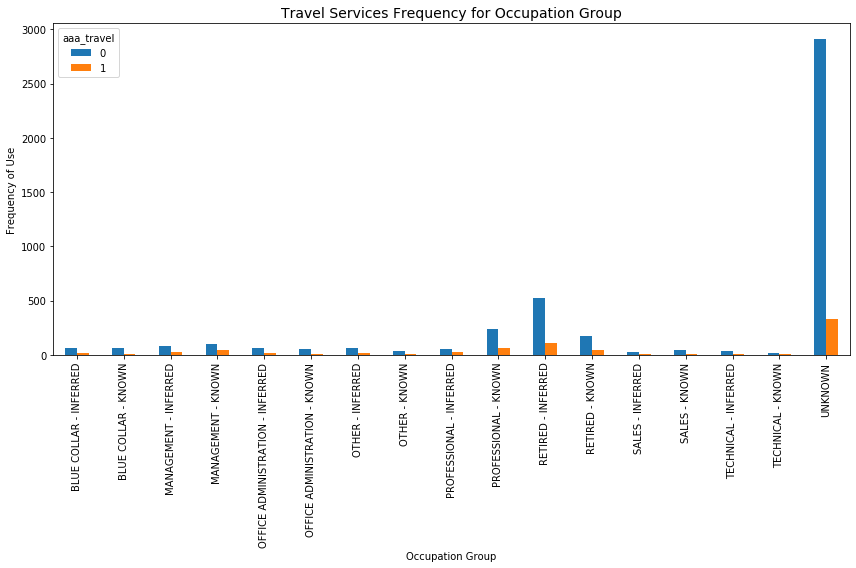

In [57]:
# graph ocuppation group
pd.crosstab(df_household.occupation_group,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Occupation Group')
plt.xlabel('Occupation Group')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'occupation_group_use_'+var_to_predict_save)

# Observation
Reviewing the graph above, there are 4 prodominat group
* a) PROFESSIONAL
* b) MANAGEMENT
* c) RETIRED
* d) OTHERS

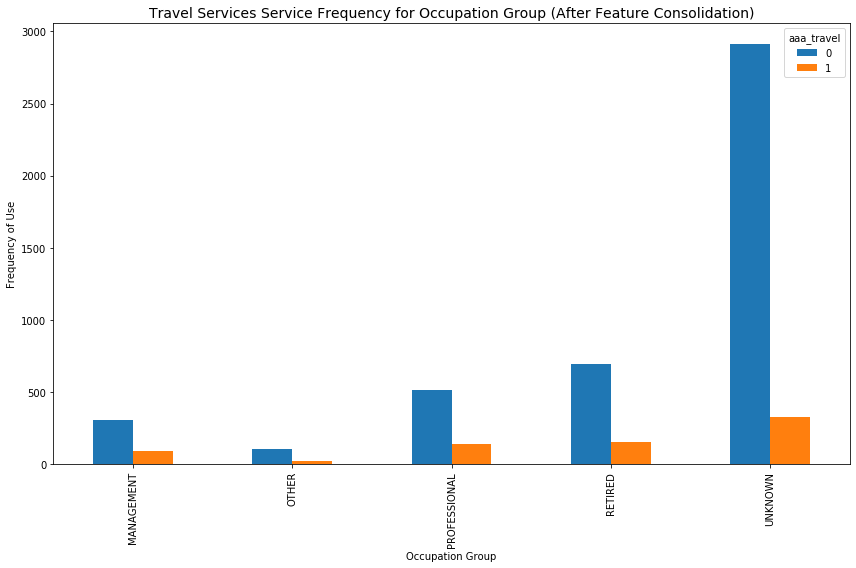

In [58]:
group1 = ['PROFESSIONAL - KNOWN', 'PROFESSIONAL - INFERRED', 'OFFICE ADMINISTRATION - KNOWN',
         'SALES - KNOWN', 'OFFICE ADMINISTRATION - INFERRED', 'TECHNICAL - INFERRED',
         'SALES - INFERRED', 'TECHNICAL - KNOWN']
group2 = ['MANAGEMENT - KNOWN', 'BLUE COLLAR - KNOWN', 'MANAGEMENT - INFERRED', 'BLUE COLLAR - INFERRED']
group3 = ['RETIRED - INFERRED', 'RETIRED - KNOWN']
group4 = ['OTHER - INFERRED', 'OTHER - KNOWN']

for i in group1:
    df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'PROFESSIONAL', df_household['occupation_group'])
for i in group2:
    df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'MANAGEMENT', df_household['occupation_group'])
for i in group3:
    df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'RETIRED', df_household['occupation_group'])
for i in group4:
    df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'OTHER', df_household['occupation_group'])


pd.crosstab(df_household.occupation_group,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Service Frequency for Occupation Group (After Feature Consolidation)')
plt.xlabel('Occupation Group')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'occupation_group_use_feat_'+var_to_predict_save)

In [59]:
# graph occupant type
df_household.occupant_type.value_counts()

UNKNOWN      5083
HOMEOWNER     122
RENTER         56
Name: occupant_type, dtype: int64

In [60]:
# graph member status
df_household.member_status.value_counts()

ACTIVE       2662
CANCELLED    2324
PENDING       275
Name: member_status, dtype: int64

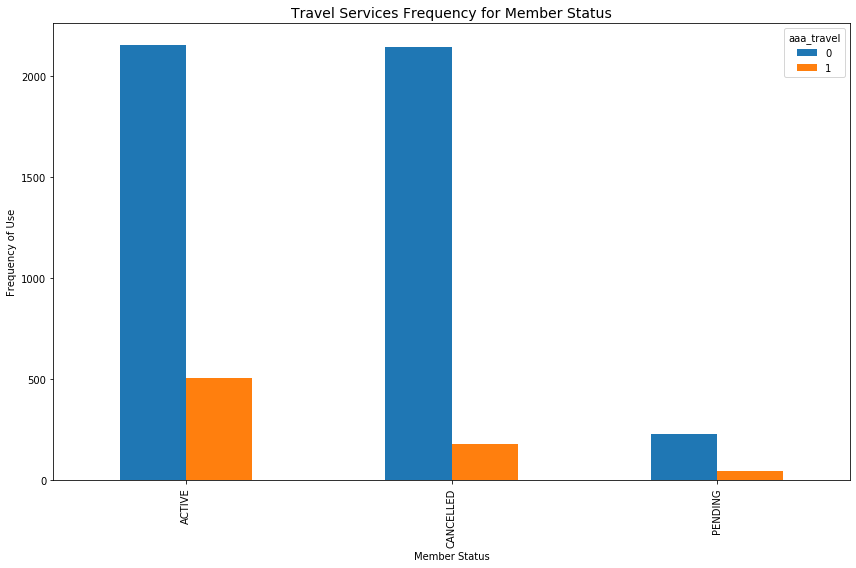

In [61]:
# graph member status group
pd.crosstab(df_household.member_status,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Member Status')
plt.xlabel('Member Status')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'member_status_use_'+var_to_predict_save)

In [62]:
# graph deposit
df_household.aaa_deposit.value_counts()

0    5233
1      28
Name: aaa_deposit, dtype: int64

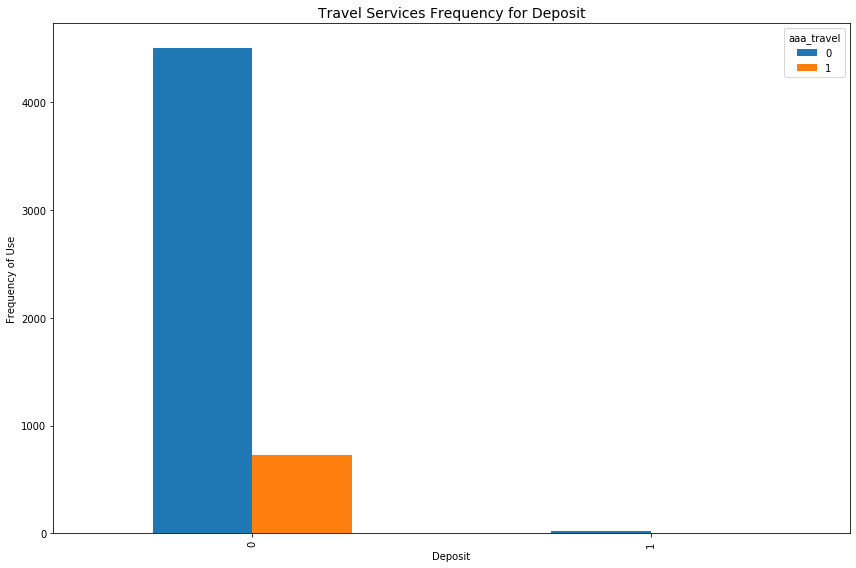

In [63]:
# graph Deposit
pd.crosstab(df_household.aaa_deposit,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Deposit')
plt.xlabel('Deposit')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'deposit_use_'+var_to_predict_save)

In [64]:
# graph Financial service
df_household.aaa_financial_service.value_counts()

0    4893
1     368
Name: aaa_financial_service, dtype: int64

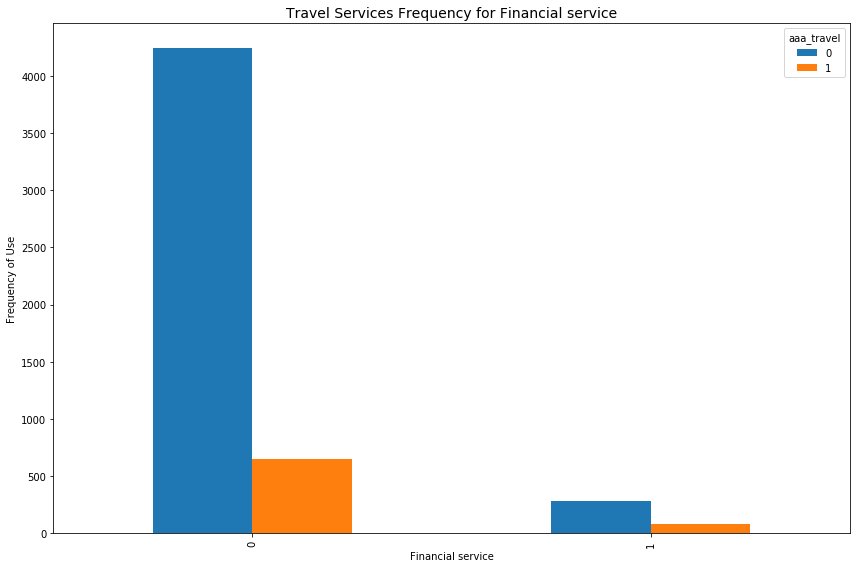

In [65]:
# graph Financial service
pd.crosstab(df_household.aaa_financial_service,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Financial service')
plt.xlabel('Financial service')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'financial_service_use_'+var_to_predict_save)

In [66]:
# graph home_equity
df_household.aaa_home_equity.value_counts()

0    5255
1       6
Name: aaa_home_equity, dtype: int64

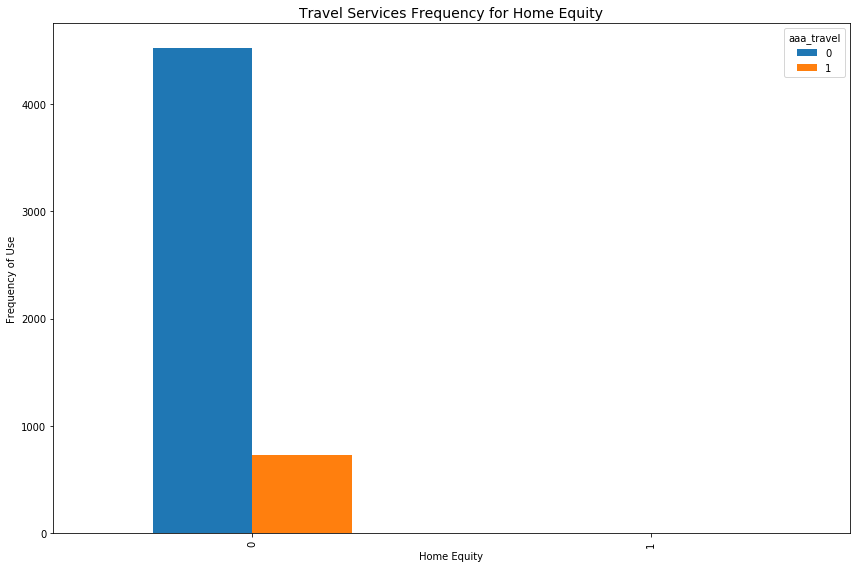

In [67]:
# graph home_equity
pd.crosstab(df_household.aaa_home_equity,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Home Equity')
plt.xlabel('Home Equity')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'home_equity_use_'+var_to_predict_save)

In [68]:
# graph mortgage
df_household.aaa_mortgage.value_counts()

0    4893
1     368
Name: aaa_mortgage, dtype: int64

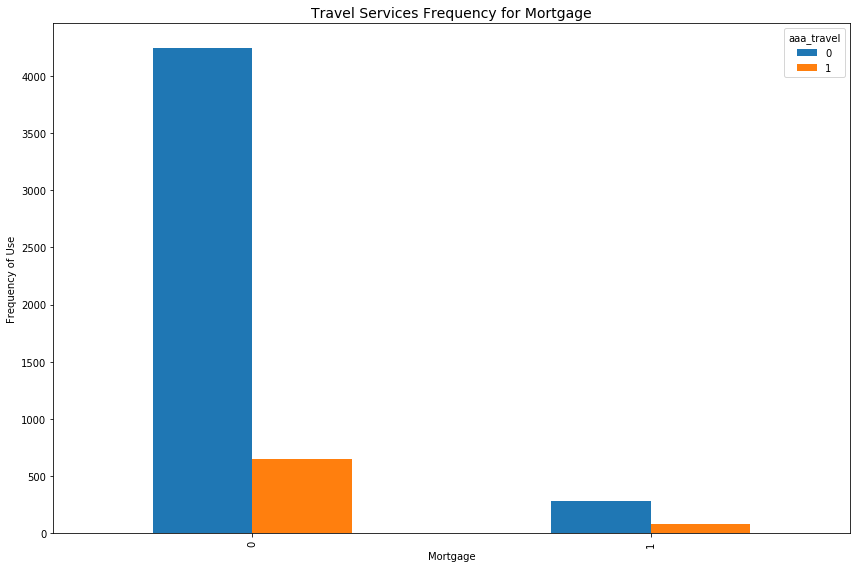

In [69]:
# graph Mortgage group
pd.crosstab(df_household.aaa_mortgage,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Mortgage')
plt.xlabel('Mortgage')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'mortgage_use_'+var_to_predict_save)

In [70]:
# graph credit card
df_household.aaa_credit_card.value_counts()

0    4681
1     580
Name: aaa_credit_card, dtype: int64

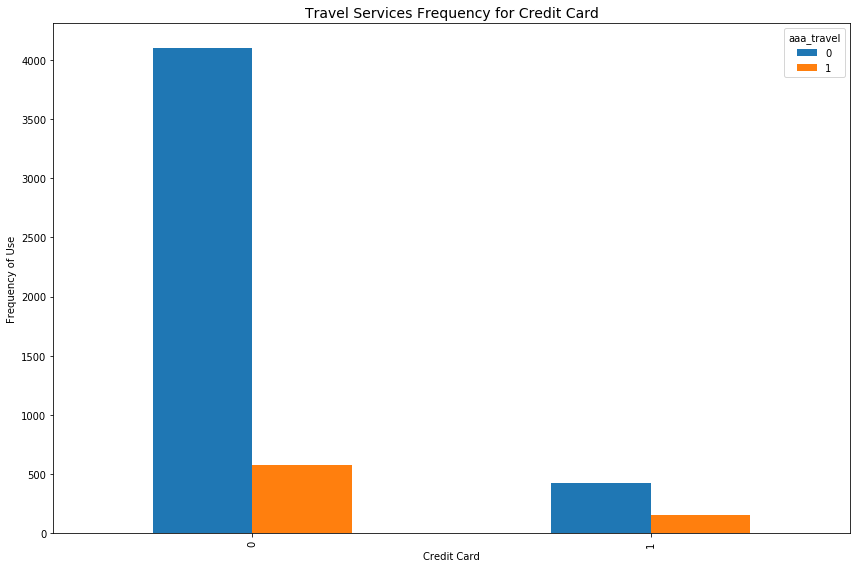

In [71]:
# graph Credit card group
pd.crosstab(df_household.aaa_credit_card,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Credit Card')
plt.xlabel('Credit Card')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'credit_card_use_'+var_to_predict_save)

In [72]:
# graph auto insurance
df_household.aaa_auto_insurance.value_counts()

0    3816
1    1445
Name: aaa_auto_insurance, dtype: int64

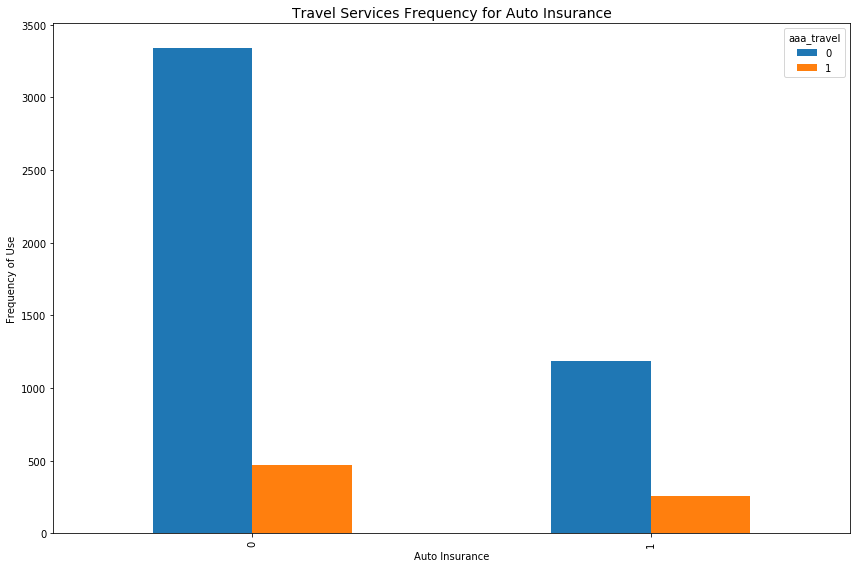

In [73]:
# graph auto insurance group
pd.crosstab(df_household.aaa_auto_insurance,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for Auto Insurance')
plt.xlabel('Auto Insurance')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'auto_insurance_use_'+var_to_predict_save)

In [74]:
# graph id theft service
df_household.aaa_id_theft.value_counts()

0    5026
1     235
Name: aaa_id_theft, dtype: int64

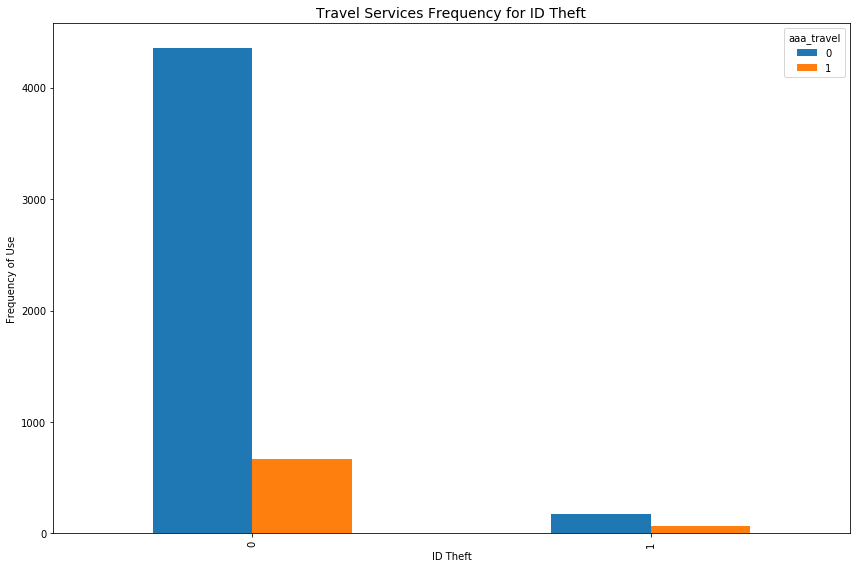

In [75]:
# graph id theft service
pd.crosstab(df_household.aaa_id_theft,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for ID Theft')
plt.xlabel('ID Theft')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'id_theft_use_'+var_to_predict_save)

In [77]:
# graph use roadside service
df_household.use_road_side.value_counts()

1    3067
0    2194
Name: use_road_side, dtype: int64

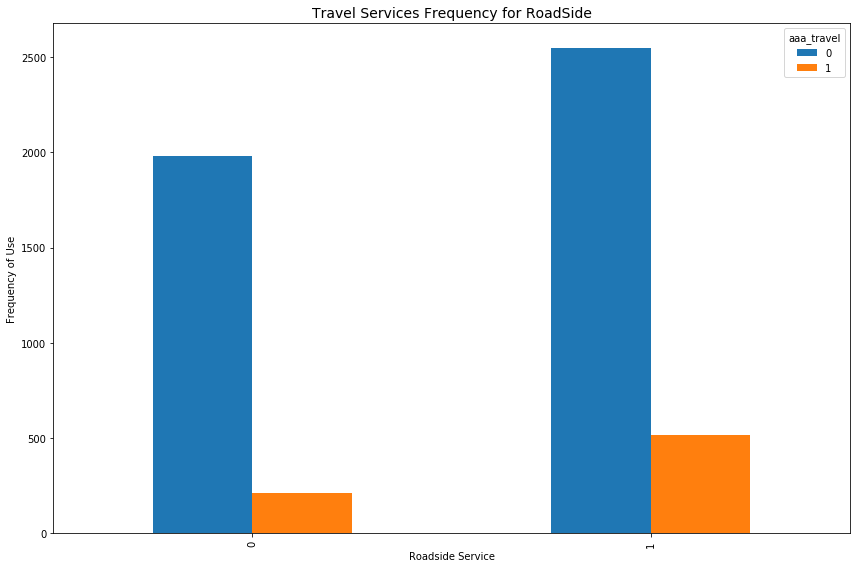

In [78]:
# graph id theft service
pd.crosstab(df_household.use_road_side,df_household[var_to_predict[0]]).plot(kind='bar', figsize=(12,8))
plt.title(var_to_predict_title+' Frequency for RoadSide')
plt.xlabel('Roadside Service')
plt.ylabel('Frequency of Use')
plt.savefig('./model_pics/Travel/'+'roadside_use_'+var_to_predict_save)

# Model to predict Roadside Service Usage by household key

Previous Columns Used
* cols_house_dummmies = ['income', 'tenure', 'credit_ranges','education', 'generation', 'cancel_reason',
                       'race', 'home_owner', 'dwelling_type', 'mosaic_global_household',
                       'plus_indicator_description', 'gender', 'mosaic_household',
                       'kcl_b_ind_mosaicsgrouping', 'sc_vehicle_manufacturer_name'
                       occupation_code, occupation_group, occupant_type, vehicle, sc_vehicle_model_name

* feature_cols = ['aaa_mean_age', 'length_of_residence', 'aaa_mean_child', 
                    'total_calls', 'total_member_cost', 'total_cost', 'mean_total_member_cost', 'mean_total_cost'
* feature_cols = ['no_members', 'total_calls', 'mean_total_member_cost', 'mean_total_cost',
               'mean_basic_cost', 'mean_plus_cost', 'mean_premier_cost']

# Final Observation (Need update)

Based on the previous anlysis, these are the most important feature:
* income
* tenure
* credit_ranges
* education
* generation
* race
* home_owner
* cancel_reason
* mosaic_global_household
* plus_indicator_description
* Gender
* kcl_b_ind_mosaicsgrouping
* sc_vehicle_manufacturer_name
* occupation_group


In [79]:
# Re initiate all features and data
def reiniciar(df_household):
    df_household = read_data('household_view.csv')
    
    # Regroup Group Income
    group1 = ['UNDER 10K','10-19,999' , '20-29,999', '30-39,999']
    group2 = ['40-49,999', '50-59,999', '60-69,999', '70-79,999', '80-89,999', '90-99,999']
    group3 = ['100-149,999', '150 - 174,999', '175 - 199,999', '200 - 249,999', '250K+' ]
    for i in group1:
        df_household['income']=np.where(df_household['income']== i, 'UNDER 39,999', df_household['income'])
    for i in group2:
        df_household['income']=np.where(df_household['income']== i, '40 - 99,999', df_household['income'])
    for i in group3:
        df_household['income']=np.where(df_household['income']== i, '100k+', df_household['income'])
    
    # Regroup tenures
    group1 = ['BETWEEN 6 & 10 YEARS', 'BETWEEN 11 & 15 YEARS', 
          'BETWEEN 16 & 20 YEARS', 'BETWEEN 1 & 5 YEARS', '< 1 YEAR']
    group2 = ['BETWEEN 31 & 40 YEARS', 'BETWEEN 21 & 30 YEARS']
    group3 = ['+40 YEARS']
    for i in group1:
        df_household['tenure']=np.where(df_household['tenure']== i, 'UNDER 20 YEARS', df_household['tenure'])
    for i in group2:
        df_household['tenure']=np.where(df_household['tenure']== i, 'BETWEEN 21 & 40 YEARS', df_household['tenure'])
    for i in group3:
        df_household['tenure']=np.where(df_household['tenure']== i, '+40 YEARS', df_household['tenure'])
    
    # Regroup credit ranges
    group1 = ['499 & LESS', '500-549','550-599','600-649', '650-699']
    group2 = ['700-749', '750-799']
    group3 = ['800+']
    for i in group1:
        df_household['credit_ranges']=np.where(df_household['credit_ranges']== i, 'BELOW 700', df_household['credit_ranges'])
    for i in group2:
        df_household['credit_ranges']=np.where(df_household['credit_ranges']== i, 'BETWEEN 700 & 799', df_household['credit_ranges'])
    for i in group3:
        df_household['credit_ranges']=np.where(df_household['credit_ranges']== i, '800+', df_household['credit_ranges'])
    
    # Regroup Education
    df_household['education']=np.where(df_household['education'] =='GRADUATED SCHOOL', 
                                   'COMPLETED COLLEGE', df_household['education']
                                  )
    # Regroup Race
    group1 = ['CAUCASION / WHITE - EUROPEAN', 'CAUCASION / WHITE - ENGLISH', 'CAUCASION / WHITE - WHITE NON-AMERICAN',
          'CAUCASION / WHITE - UNKNOWN', 'CAUCASION / WHITE - EASTERN EUROPEAN', 'CAUCASION / WHITE - JEWISH',
          'CAUCASION / WHITE - GREEK', 'CAUCASION / WHITE - DUTCH'
         ]
    group2 = ['HISPANIC - HISPANIC ORIGIN', 'HISPANIC - PORTUGUESE ORIGIN']
    group3 = ['ASIAN - CHINESE', 'ASIAN - UNKNOWN', 'ASIAN - JAPANESE', 'ASIAN - INDIAN', 'ASIAN - ORIENTAL']
    group4 = ['MIDDLE EASTERN - ARAB', 'MIDDLE EASTERN - EGYPTIAN']
    group5 = ['AFRICAN AMERICAN - AFRICAN ORIGIN', 'AMERICAN INDIAN']

    for i in group1:
        df_household['race']=np.where(df_household['race']== i, 'CAUCASION / WHITE', df_household['race'])
    for i in group2:
        df_household['race']=np.where(df_household['race']== i, 'HISPANIC', df_household['race'])
    for i in group3:
        df_household['race']=np.where(df_household['race']== i, 'ASIAN', df_household['race'])
    for i in group4:
        df_household['race']=np.where(df_household['race']== i, 'ARABS', df_household['race'])
    for i in group5:
        df_household['race']=np.where(df_household['race']== i, 'AMERICAN AFRICANS / INDIANS', df_household['race'])

    # Regroup Home Owner
    df_household['home_owner']=np.where(df_household['home_owner']== 'PROBABLE RENTER', 'RENTER', df_household['home_owner'])
    df_household['home_owner']=np.where(df_household['home_owner']== 'PROBABLE HOME OWNER', 'HOME OWNER', df_household['home_owner'])
    
    # Regroup Cancel reason
    group1 = ['NON-PAYMENT', 'ERS DECLINE CC', 'BAD ADD SET BY PO ACS', '*BAD CHECKS*', 
         ]
    group2 = ['DECEASED', 'NO LONGER DRIVING', 'MEMBERS REQUEST', 'CANCELLED DO NOT RENEW', 'TRANSFER MEMBER',
              'DO NOT RENEW', 'MOVED OUT OF TERR', 'TRANSFER MEMBER SUSPEND', 'CANCELLED MBRS REQUEST',
              'HEALTH ISSUE', 'NONCOMPLIANT AGE', 'PO RETURN'
             ]
    group3 = ['DATA PROBLEM','DUP MEMBERSHIP','ERS CNCL MSHIP PROGRAM','MANAGEMENT REQUEST', 'CANCEL PROCESS - FUTURE CANCEL DNR']

    for i in group1:
        df_household['cancel_reason']=np.where(df_household['cancel_reason']== i, 'PAYMENT ISSUES', df_household['cancel_reason'])
    for i in group2:
        df_household['cancel_reason']=np.where(df_household['cancel_reason']== i, 'MEMBER ISSUES', df_household['cancel_reason'])
    for i in group3:
        df_household['cancel_reason']=np.where(df_household['cancel_reason']== i, 'DATA/AAA ISSUES', df_household['cancel_reason'])

    # Regroup Mosaic Global household
    df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'METROPOLITAN STRUGGLERS', 
                                                 'ROUTINE SERVICE WORKERS', df_household['mosaic_global_household']
                                                )

    df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'SOPHISTICATED SINGLES', 
                                                     'BOURGEOIS PROSPERITY', df_household['mosaic_global_household']
                                                    )

    df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'RURAL INHERITANCE', 
                                                     'CAREER AND FAMILY', df_household['mosaic_global_household']
                                                    )
    df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'POST INDUSTRIAL SURVIVORS', 
                                                     'ROUTINE SERVICE WORKERS', df_household['mosaic_global_household']
                                                    )
    # Regroup Experian Group
    group1 = ['AUTUMN YEARS', 'GOLDEN YEAR GUARDIANS']
    group2 = ['BOOMING WITH CONFIDENCE', 'THRIVING BOOMERS', 'BLUE SKY BOOMERS']
    group3 = ['POWER ELITE', 'SURBURBAN STYLE', 'FLOURISHING FAMILIES']
    group4 = ['FAMILY UNION', 'MIDDLE CLASS MELTING POT', 'PROMISING FAMILIES', 'ECONOMIC CHALLENGES', 'FAMILIES IN MOTION',
              'PASTORAL PRIDE']
    group5 = ['SINGLES AND STARTERS', 'SIGNIFICANT SINGLES', 'YOUNG CITY SOLOS', 'CULTURAL CONNECTIONS',
             'ASPIRATIONAL FUSION']
    for i in group1:
        df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'GOLDEN YEAR', df_household['kcl_b_ind_mosaicsgrouping'])
    for i in group2:
        df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'BOOMERS', df_household['kcl_b_ind_mosaicsgrouping'])
    for i in group3:
        df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'POWER ELITE', df_household['kcl_b_ind_mosaicsgrouping'])
    for i in group4:
        df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'MIDDLE CLASS MELTING POT', df_household['kcl_b_ind_mosaicsgrouping'])
    for i in group5:
        df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'SINGLES AND STARTERS', df_household['kcl_b_ind_mosaicsgrouping'])
    
    # Regroup Vehicle Manufaturer
    group1 = [ 'TOYOTA', 'FORD', 'HONDA', 'CHEVROLET', 'HYUNDAI', 'NISSAN', 'BUICK', 'SUBARU', 'SUZUKI',
         'DODGE', 'CHRYSLER', 'VOLKSWAGEN','KIA', 'MAZDA', 'SATURN', 'PONTIAC', 'SCION', 'MITSUBISHI',
          'GEO', 'CRYSLER', 'MG', 'FIAT', 'BICYCLE', 'ISUZU']
    group2 = ['JEEP', 'MERCURY','GMC', 'OLSMOBILE', 'RAM', 'PLYMOUTH', 'GENESIS', 'OLDSMOBILE', 'AMERICAN AUSTIN']
          
    group3 = ['LEXUS', 'VOLVO', 'MERCEDES-BENZ', 'CADILLAC','LINCOLN', 'ACURA', 'BMW', 'SAAB', 'AUDI', 'INFINITI',
          'LAND ROVER', 'MINI', 'JAGUAR', 'PORSCHE', 'HARLEY DAVIDSON', 'ALFA ROMEO']

    for i in group1:
        df_household['sc_vehicle_manufacturer_name']=np.where(df_household['sc_vehicle_manufacturer_name']== i, 'STANDARD END VEHICLE', df_household['sc_vehicle_manufacturer_name'])
    for i in group2:
        df_household['sc_vehicle_manufacturer_name']=np.where(df_household['sc_vehicle_manufacturer_name']== i, 'MIDDLE END VEHICLE', df_household['sc_vehicle_manufacturer_name'])
    for i in group3:
        df_household['sc_vehicle_manufacturer_name']=np.where(df_household['sc_vehicle_manufacturer_name']== i, 'LUXURY VEHICLE', df_household['sc_vehicle_manufacturer_name'])

    # Regroup Occupation Group
    group1 = ['PROFESSIONAL - KNOWN', 'PROFESSIONAL - INFERRED', 'OFFICE ADMINISTRATION - KNOWN',
         'SALES - KNOWN', 'OFFICE ADMINISTRATION - INFERRED', 'TECHNICAL - INFERRED',
         'SALES - INFERRED', 'TECHNICAL - KNOWN']
    group2 = ['MANAGEMENT - KNOWN', 'BLUE COLLAR - KNOWN', 'MANAGEMENT - INFERRED', 'BLUE COLLAR - INFERRED']
    group3 = ['RETIRED - INFERRED', 'RETIRED - KNOWN']
    group4 = ['OTHER - INFERRED', 'OTHER - KNOWN']

    for i in group1:
        df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'PROFESSIONAL', df_household['occupation_group'])
    for i in group2:
        df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'MANAGEMENT', df_household['occupation_group'])
    for i in group3:
        df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'RETIRED', df_household['occupation_group'])
    for i in group4:
        df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'OTHER', df_household['occupation_group'])

    # Regroup Total members inside a household
    df_household['no_members'] = ' '
    df_household['no_members']=np.where(df_household['total_members_in_household']== 1, '1 - MEMBER', 
                                        df_household['no_members'])
    df_household['no_members']=np.where(df_household['total_members_in_household']== 2, '2 - MEMBER', 
                                        df_household['no_members'])
    df_household['no_members']=np.where(df_household['total_members_in_household']== 3, '3 - MEMBER', 
                                        df_household['no_members'])
    df_household['no_members']=np.where(df_household['total_members_in_household']== 4, '4 - MEMBER', 
                                        df_household['no_members'])

    df_household['no_members']=np.where(df_household['total_members_in_household']> 4, '5 - MEMBER', 
                                        df_household['no_members'])
    group5 = np.arange(5,20,1)
    for i in group5:
        df_household['no_members']=np.where(df_household['total_members_in_household']== i, '+5 - MEMBER', 
                                        df_household['no_members'])
    
    # Create roadside usage
    df_household['use_road_side'] = df_household['total_calls'].apply(lambda x:road_side_usage(x))
    df_household.consumer_score = np.where(df_household.consumer_score!= np.nan, 1/df_household.consumer_score, 
                                        df_household.consumer_score)
    df_household.consumer_score = np.where(~(df_household.consumer_score > 0), df_household.consumer_score.mean(), 
                                           df_household.consumer_score)
    
    # create feature Cancel = 1 - member cancelled, if 0 active member
    df_household['aaa_cancel'] = 1
    df_household['aaa_cancel']=np.where(df_household['member_status']== 'ACTIVE', 0, 
                                        df_household['aaa_cancel'])
    df_household['aaa_cancel']=np.where(df_household['member_status']== 'PENDING', 0, 
                                        df_household['aaa_cancel'])
    df_household['aaa_cancel']=np.where(df_household['member_status']== 'CANCELLED', 1, 
                                        df_household['aaa_cancel'])
    
    # Remove members with status CANCELLED
    df_household = df_household[df_household.member_status!='CANCELLED']  
    return df_household

In [80]:
df_household.groupby(by=var_to_predict)['total_cost'].mean()

aaa_travel
0   118.9327
1   164.6699
Name: total_cost, dtype: float64

In [81]:
df_household.groupby(by=var_to_predict)['total_calls'].mean()

aaa_travel
0   7.3557
1   9.4932
Name: total_calls, dtype: float64

In [82]:
df_household.groupby(by=var_to_predict)['total_member_cost'].mean()

aaa_travel
0   389.8191
1   516.6612
Name: total_member_cost, dtype: float64

In [83]:
df_household.groupby(by=var_to_predict)['basic_cost'].mean()

aaa_travel
0   106.9953
1   150.0622
Name: basic_cost, dtype: float64

In [84]:
df_household.groupby(by=var_to_predict)['plus_cost'].mean()

aaa_travel
0    8.5831
1   12.6325
Name: plus_cost, dtype: float64

In [85]:
df_household.groupby(by=var_to_predict)['premier_cost'].mean()

aaa_travel
0   0.0212
1   0.0000
Name: premier_cost, dtype: float64

In [86]:
df_household.groupby(by=['use_road_side', 'length_of_residence']).mean()

membership_id  household_key       zip  aaa_no_tenure  aaa_member_tenure_years  aaa_mean_age  aaa_mortgage  aaa_credit_card  aaa_deposit  aaa_home_equity  aaa_financial_service  aaa_auto_insurance  aaa_id_theft  aaa_motorcycle_indicator  aaa_travel  aaa_mean_child  aaa_mean_total_cost  aaa_no_race  aaa_no_home_owner  aaa_no_education  aaa_no_income  aaa_no_dwelling_type  aaa_no_credit_ranges  aaa_no_gender  aaa_no_language  aaa_no_reason_joined  aaa_cancel_reason  aaa_no_mosaic_household  aaa_no_mosaic_global_household  aaa_no_kcl_b_ind_mosaicsgrouping  aaa_no_occupation_code  aaa_no_occupation_group  aaa_no_occupant_type  aaa_no_plus_indicator_description  aaa_no_generation  total_calls_year_1  total_calls_year_2  total_calls_year_3  total_member_cost_1  total_member_cost_2  total_member_cost_3  basic_cost  plus_cost  premier_cost  mean_basic_cost  mean_plus_cost  mean_premier_cost  total_calls  total_member_cost  mean_total_member_cost  \
use_road_side length_of_residence                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            
0             0.0000                 147901.0374  14860433.6977 3302.2975         0.9770                  47.0000       84.3349        0.0154           0.0298       0.0019           0.0010                 0.0154              0.1420        0.0077                    0.2740      0.0365          1.3654               4.0694       2.0435             0.0000            1.8182         5.3913                0.5674                2.8889         1.4444           0.5238                2.5625             3.2774                  13.7918                          3.7508                            6.2934                  9.8919                   5.0700                1.3077                             1.0519             0.3682              0.0000              0.0000              0.0000               0.0000               0.0000               1.1823      9.8383     0.6795        0.0000           3.8341          0.2232             0.0000       0.0000             1.1823                  0.1075   
              0.2500                  57877.0000   4878476.0000 2856.5000         1.5000                  45.0000       78.0000        0.0000           0.5000       0.0000           0.0000                 0.0000              1.0000        0.0000                    0.5000      0.0000          2.0000              36.1250       1.0000             0.0000            4.0000         2.0000                0.0000                2.5000         1.5000           0.0000                   nan             4.0000                   7.5000                          2.5000                            6.5000                     nan                   4.5000                   nan                             1.0000             1.0000              0.0000              0.0000              0.0000               0.0000               0.0000               0.0000    120.5000    24.0000        0.0000          30.1250          6.0000             0.0000       0.0000             0.0000                  0.0000   
              0.3333                 185609.0000   4259179.6667 2897.6667  

# Type of correlation
http://blogeducativope-t5.blogspot.com/2018/05/514-linear-correlation-coefficient.html
Our threshold will be set up to 0.75 to -0.75 meaning it will only use upt to moderate correlation 

# Correlation Analysis
librimind.com: 'Data columns with very similar trends are also likely to carry very similar information. In this case, only one of them will suffice to feed the machine learning model. Here we calculate the correlation coefficient between numerical and nominal columns as the Coefficient and the Pearson’s chi square value respectively. Pairs of columns with correlation coefficient higher than a threshold are reduced to only one.

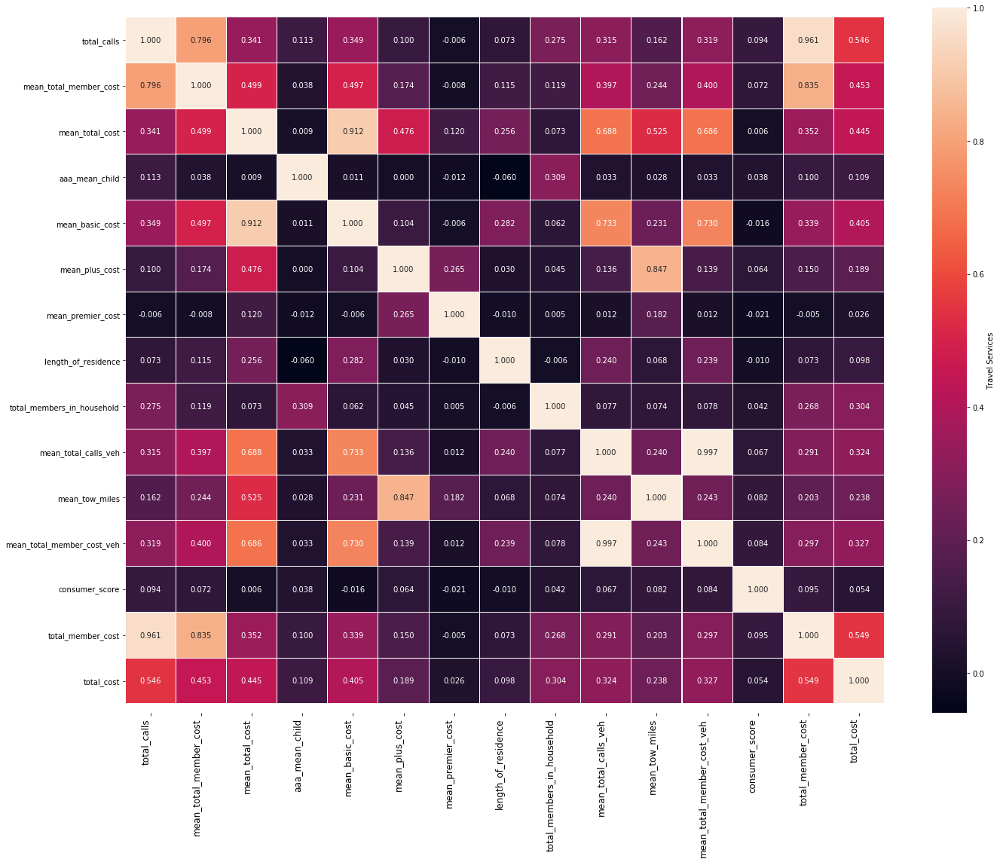

In [87]:
# Select all numeric features from df_household
# Get only numeric columns
# col_num = df_household.select_dtypes(include=np.number).columns.tolist()
col_num =['total_calls', 'mean_total_member_cost', 'mean_total_cost', 'aaa_mean_child',
          'mean_basic_cost', 'mean_plus_cost', 'mean_premier_cost', 'length_of_residence',
          'total_members_in_household', 'mean_total_calls_veh','mean_tow_miles',
          'mean_total_member_cost_veh', 'consumer_score', 'total_member_cost', 'total_cost'
         ]

df_corr = pd.DataFrame(df_household, columns=col_num)
df_corr = df_corr.corr()
plt.figure(figsize=(20,16))
sns.heatmap(df_corr, annot=True, fmt=".3f", linewidths=0.1, xticklabels=True, 
                cbar_kws={'label': var_to_predict_title}, yticklabels=True)
bottom, top = plt.ylim()
plt.ylim(bottom + 0.7, top - 0.7)
plt.xticks(rotation=90, 
           horizontalalignment='right',
           fontweight='light',
           fontsize='large')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_var_corr')
plt.show()

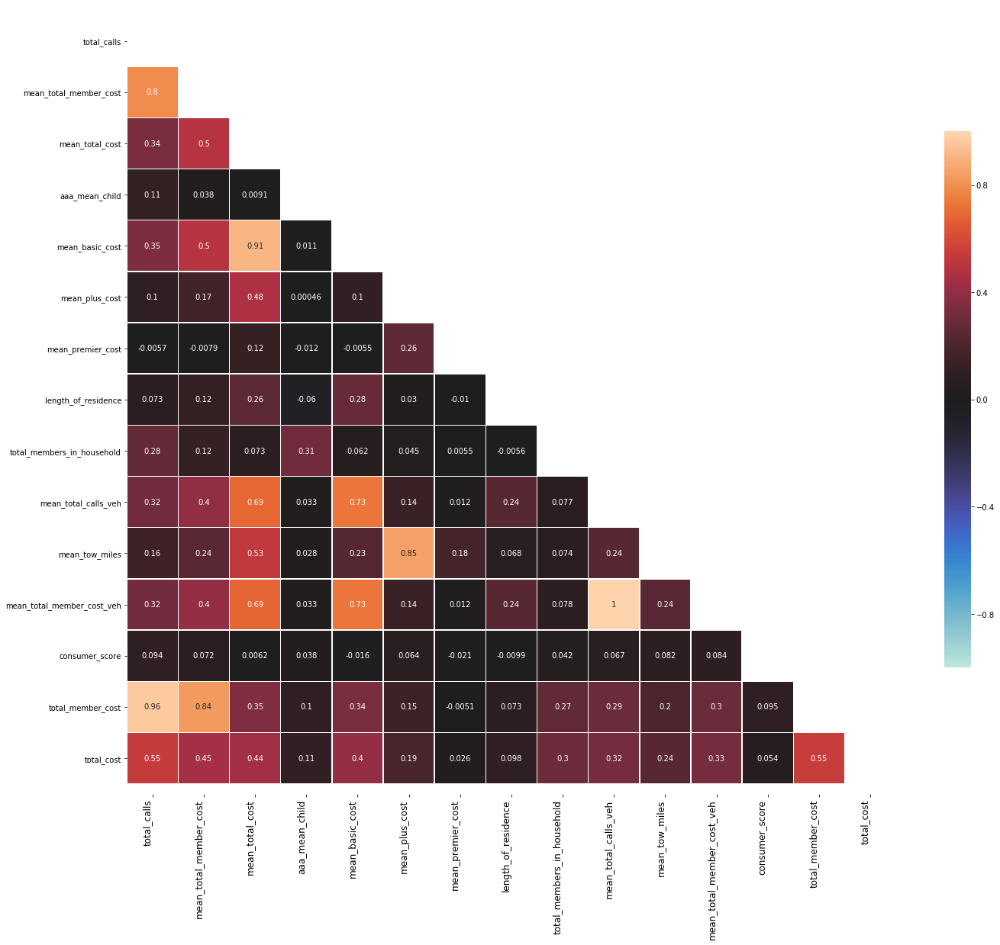

In [88]:
# Correlation
df_corr = pd.DataFrame(df_household, columns=col_num)
df_corr = df_corr.corr()

mask = np.zeros_like(df_corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(20, 20))

#cmap = sns.diverging_palette(180, 20, as_cmap=True)
sns.heatmap(df_corr, mask=mask, vmax=1, vmin =-1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
bottom, top = plt.ylim()
plt.ylim(bottom + 0.7, top - 0.7)
plt.xticks(rotation=90, 
           horizontalalignment='right',
           fontweight='light',
           fontsize='large')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_var_corr_1')
plt.show()

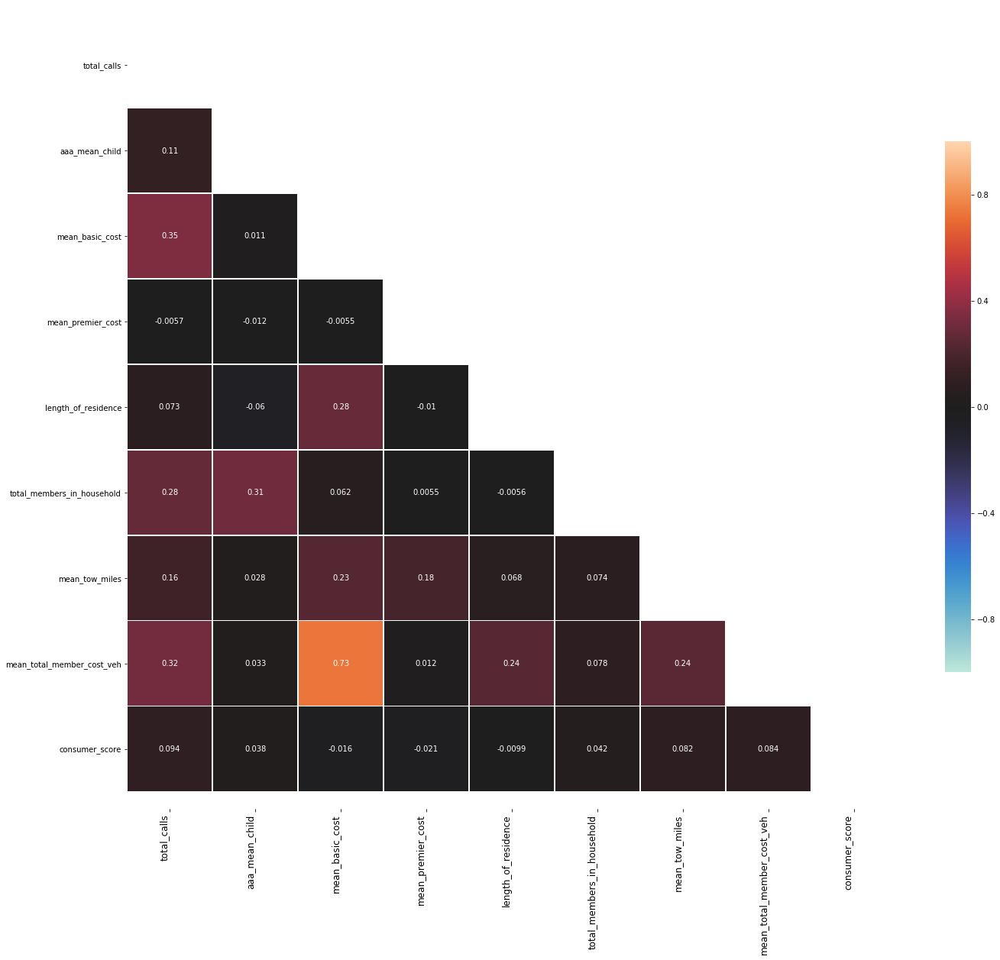

In [89]:
# Remove columns with strong correlation
# Columns to remove = ['total_member_cost','mean_total_calls_veh','mean_total_cost','mean_plus_cost', 'mean_total_member_cost', 'total_cost']

col_num =['total_calls',  'aaa_mean_child',
          'mean_basic_cost', 'mean_premier_cost', 'length_of_residence',
          'total_members_in_household', 'mean_tow_miles',
          'mean_total_member_cost_veh', 'consumer_score'
         ]


# Correlation
df_corr = pd.DataFrame(df_household, columns=col_num)
df_corr = df_corr.corr()

mask = np.zeros_like(df_corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(20, 20))

#cmap = sns.diverging_palette(180, 20, as_cmap=True)
sns.heatmap(df_corr, mask=mask, vmax=1, vmin =-1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
bottom, top = plt.ylim()
plt.ylim(bottom + 0.7, top - 0.7)
plt.xticks(rotation=90, 
           horizontalalignment='right',
           fontweight='light',
           fontsize='large')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_var_corr_2')
plt.show()

# Reload data to conduct another experiment

* Full features
cols_house_dummmies = ['income', 'credit_ranges','education', 'generation', 'aaa_financial_service',
                       'aaa_deposit', 'plus_indicator_description', 'aaa_credit_card', 'occupation_group',
                       'sc_vehicle_manufacturer_name', 'kcl_b_ind_mosaicsgrouping','dwelling_type',
                       'aaa_motorcycle_indicator', 'mosaic_global_household', 'tenure', 'aaa_auto_insurance',
                       'aaa_id_theft', 'no_members'
             ]
feature_cols = ['total_calls', 'mean_total_member_cost', 'mean_total_cost', 'aaa_mean_child',
               'mean_basic_cost', 'mean_plus_cost', 'mean_premier_cost', 'length_of_residence'
               ]

In [90]:
# Reload data to conduct another experiment
df_household = reiniciar(df_household)
cols_house_dummmies = ['aaa_financial_service','plus_indicator_description', 
                       'occupation_group','sc_vehicle_manufacturer_name', 'tenure', 'aaa_auto_insurance',
                       'no_members', 'gender', 'kcl_b_ind_mosaicsgrouping','education',
                       
                      ]
feature_cols = ['mean_total_calls_veh', 'consumer_score', 'mean_total_cost_veh', 'mean_total_member_cost_veh',
                'mean_tow_miles', 'length_of_residence', 'aaa_mean_child'
               ]

# Build Dummies Variables
df_dummies = pd.get_dummies(df_household, columns=cols_house_dummmies)
for i in cols_house_dummmies:
    cols = [j for j in df_dummies.columns if j.startswith(i)]
    feature_cols += cols

# construct Dataframe for prediction
feature_cols += var_to_predict
df_prediction = pd.DataFrame(df_dummies, columns=feature_cols)

# Stripping out spaces from ends of names, and replacing internal spaces with "_"
df_prediction.columns = [col.strip().replace(' ', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('&', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('+', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace(',', '').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('(', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace(')', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('<', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('.', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('/', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('-', '_').lower() for col in df_prediction.columns]

# Fix Nans
# Number of child
df_prediction.aaa_mean_child.fillna(value=0, inplace=True)
# Drop Unknown Columns 
cols_to_drop = [j for j in df_prediction.columns if j.endswith('unknown')]
df_prediction.drop(labels=cols_to_drop,axis=1, inplace=True)

# Save columns name for future use in modelling to split X-Input and y-Output
X_cols = df_prediction.columns[:-1]
y_cols = var_to_predict.copy()

In [91]:
df_prediction.describe()

,mean_total_calls_veh,consumer_score,mean_total_cost_veh,mean_total_member_cost_veh,mean_tow_miles,length_of_residence,aaa_mean_child,aaa_financial_service_0,aaa_financial_service_1,plus_indicator_description_basic_membership,plus_indicator_description_plus_membership,plus_indicator_description_plus_membership_with_motorcycle_coverage,plus_indicator_description_premier_membership,occupation_group_management,occupation_group_other,occupation_group_professional,occupation_group_retired,sc_vehicle_manufacturer_name_luxury_vehicle,sc_vehicle_manufacturer_name_middle_end_vehicle,sc_vehicle_manufacturer_name_standard_end_vehicle,tenure__40_years,tenure_between_21___40_years,tenure_under_20_years,aaa_auto_insurance_0,aaa_auto_insurance_1,no_members__5___member,no_members_1___member,no_members_2___member,no_members_3___member,no_members_4___member,gender_female,gender_male,kcl_b_ind_mosaicsgrouping_boomers,kcl_b_ind_mosaicsgrouping_golden_year,kcl_b_ind_mosaicsgrouping_middle_class_melting_pot,kcl_b_ind_mosaicsgrouping_power_elite,kcl_b_ind_mosaicsgrouping_singles_and_starters,education_completed_college,education_high_school,education_some_college,aaa_travel
count,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000
mean,1.9957,0.0149,33.0597,106.0340,1.3383,8.0691,1.4659,0.9094,0.0906,0.3953,0.2836,0.0007,0.0238,0.1052,0.0327,0.1801,0.2530,0.0957,0.0429,0.5638,0.6173,0.1638,0.2189,0.6919,0.3081,0.0769,0.2462,0.3544,0.2002,0.1222,0.3224,0.2475,0.2469,0.3160,0.0599,0.0855,0.0514,0.1277,0.1941,0.2094,0.1886
std,1.2244,0.0013,21.6023,65.7507,3.3242,5.6942,1.0682,0.2870,0.2870,0.4890,0.4508,0.0261,0.1526,0.3069,0.1778,0.3843,0.4348,0.2942,0.2027,0.4960,0.4861,0.3701,0.4136,0.4618,0.4618,0.2666,0.4309,0.4784,0.4002,0.3276,0.4675,0.4317,0.4313,0.4650,0.2374,0.2796,0.2209,0.3338,0.3956,0.4069,0.3913
min,0.0000,0.0123,0.0072,8.4416,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
25%,0.1645,0.0143,0.0072,8.4416,0.0000,2.6667,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
50%,2.5485,0.0149,46.3234,135.7757,0.0000,8.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
75%,2.8938,0.0154,47.1084,151.7466,1.3714,13.1250,2.0000,1.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
max,4.7407,0.0227,104.9700,382.7070,50.5000,32.2500,6.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


In [92]:
df_prediction.corr()

,mean_total_calls_veh,consumer_score,mean_total_cost_veh,mean_total_member_cost_veh,mean_tow_miles,length_of_residence,aaa_mean_child,aaa_financial_service_0,aaa_financial_service_1,plus_indicator_description_basic_membership,plus_indicator_description_plus_membership,plus_indicator_description_plus_membership_with_motorcycle_coverage,plus_indicator_description_premier_membership,occupation_group_management,occupation_group_other,occupation_group_professional,occupation_group_retired,sc_vehicle_manufacturer_name_luxury_vehicle,sc_vehicle_manufacturer_name_middle_end_vehicle,sc_vehicle_manufacturer_name_standard_end_vehicle,tenure__40_years,tenure_between_21___40_years,tenure_under_20_years,aaa_auto_insurance_0,aaa_auto_insurance_1,no_members__5___member,no_members_1___member,no_members_2___member,no_members_3___member,no_members_4___member,gender_female,gender_male,kcl_b_ind_mosaicsgrouping_boomers,kcl_b_ind_mosaicsgrouping_golden_year,kcl_b_ind_mosaicsgrouping_middle_class_melting_pot,kcl_b_ind_mosaicsgrouping_power_elite,kcl_b_ind_mosaicsgrouping_singles_and_starters,education_completed_college,education_high_school,education_some_college,aaa_travel
mean_total_calls_veh,1.0000,0.0757,0.9707,0.9955,0.2067,0.0269,0.0797,-0.0236,0.0236,0.4977,0.4099,0.0189,0.0985,0.0301,0.0194,-0.0011,-0.0547,0.2688,0.1632,0.6715,-0.0728,-0.0024,0.0878,-0.0499,0.0499,0.0663,-0.0512,-0.0161,-0.0013,0.0384,-0.0786,0.0587,0.0111,-0.0570,0.0281,0.0050,0.0492,0.0096,0.0020,-0.0101,0.0017
consumer_score,0.0757,1.0000,-0.0110,0.0988,0.0903,-0.0023,0.0381,-0.0306,0.0306,-0.0529,0.0519,0.0058,-0.0031,0.0484,0.0141,0.0101,-0.0077,-0.0279,0.4399,-0.1688,-0.0455,0.0106,0.0441,-0.0581,0.0581,0.0212,-0.0305,-0.0215,0.0365,0.0098,-0.0402,0.0859,0.0252,-0.0092,0.0044,0.0414,0.0073,-0.0442,0.0040,0.0185,-0.0048
mean_total_cost_veh,0.9707,-0.0110,1.0000,0.9669,0.1980,0.0266,0.0658,-0.0162,0.0162,0.5199,0.4053,0.0173,0.1082,0.0243,0.0232,-0.0007,-0.0611,0.2323,0.1374,0.7244,-0.0651,-0.0067,0.0825,-0.0489,0.0489,0.0572,-0.0418,-0.0196,0.0033,0.0331,-0.0734,0.0443,0.0060,-0.0540,0.0249,-0.0030,0.0493,0.0123,0.0042,-0.0076,-0.0036
mean_total_member_cost_veh,0.9955,0.0988,0.9669,1.0000,0.2109,0.0253,0.0796,-0.0256,0.0256,0.4916,0.4091,0.0191,0.0983,0.0298,0.0193,-0.0018,-0.0540,0.2809,0.1875,0.6476,-0.0753,-0.0028,0.0910,-0.0515,0.0515,0.0690,-0.0531,-0.0167,0.0003,0.0379,-0.0793,0.0594,0.0138,-0.0587,0.0272,0.0053,0.0497,0.0082,0.0034,-0.0102,0.0013
mean_tow_miles,0.2067,0.0903,0.1980,0.2109,1.0000,0.0037,0.0282,-0.0403,0.0403,-0.0426,0.1912,0.1613,0.1358,0.0152,-0.0096,0.0111,-0.0073,0.0932,0.0201,0.1191,-0.0703,0.0007,0.0820,-0.0324,0.0324,0.0212,-0.0081,-0.0329,0.0201,0.0168,-0.0281,0.0338,0.0219,-0.0288,-0.0046,0.0215,0.0200,-0.0126,0.0062,0.0008,-0.0066
length_of_residence,0.0269,-0.0023,0.0266,0.0253,0.0037,1.0000,0.2775,0.0216,-0.0216,0.0267,-0.0067,0.0006,0.0186,0.0879,-0.0150,0.0681,0.1419,-0.0333,-0.0020,0.0451,0.1072,-0.0280,-0.1009,-0.0197,0.0197,-0.0848,0.1391,0.0144,-0.0339,-0.0936,0.1092,0.1449,0.0196,0.1427,0.0175,0.0328,-0.0483,0.1590,0.1830,0.2065,-0.0027
aaa_mean_child,0.0797,0.0381,0.0658,0.0796,0.0282,0.2775,1.0000,-0.0896,0.0896,0.0576,0.0239,-0.0037,-0.0460,0.0902,0.0159,0.0967,-0.0146,0.0264,0.0018,0.0467,-0.1008,0.0306,0.0910,-0.0723,0.0723,0.1954,-0.2197,-0.1281,0.1217,0.1682,0.0460,0.0941,0.0465,-0.0813,0.1122,0.2076,-0.0168,0.0706,0.1329,0.1197,0.0629
aaa_financial_service_0,-0.0236,-0.0306,-0.0162,-0.0256,-0.0403,0.0216,-0.0896,1.0000,-1.0000,0.0125,-0.0199,-0.0372,-0.0207,-0.0349,-0.0020,-0.0682,0.0445,0.0018,-0.0444,0.0023,0.0762,-0.0238,-0.0682,0.1131,-0.1131,-0.1493,0.1170,0.0726,-0.0408,-0.0887,-0.0031,-0.0389,-0.0394,0.0614,-0.0403,-0.0563,0.0090,-0.0001,0.0079,-0.0125,-0.0419
aaa_financial_service_1,0.0236,0.0306,0.0162,0.0256,0.0403,-0.0216,0.0896,-1.0000,1.0000,-0.0125,0.0199,0.0372,0.0207,0.0349,0.0020,0.0682,-0.0445,-0.0018,0.0444,-0.0023,-0.0762,0.0238,0.0682,-0.1131,0.1131,0.1493,-0.1170,-0.0726,0.0408,0.0887,0.0031,0.0389,0

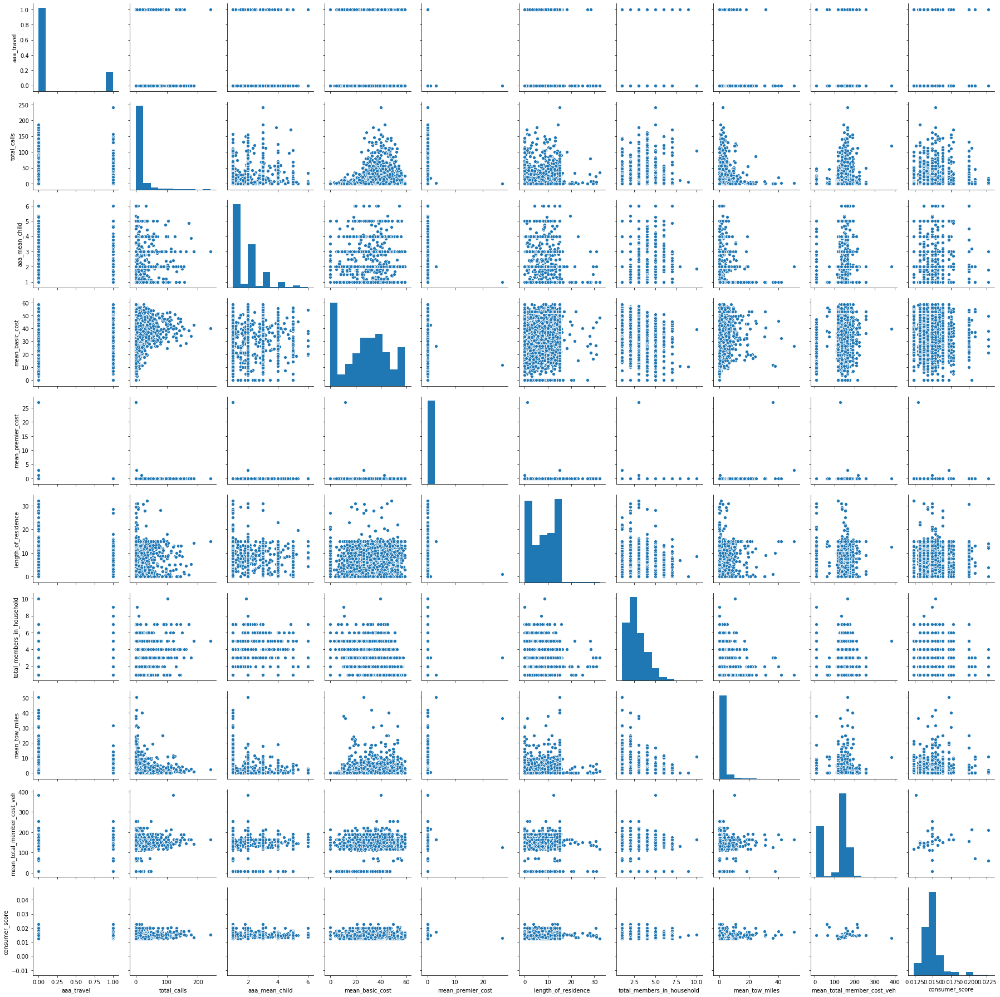

In [93]:
# Pair plot 
sns.pairplot(df_household[var_to_predict+col_num])
plt.show()

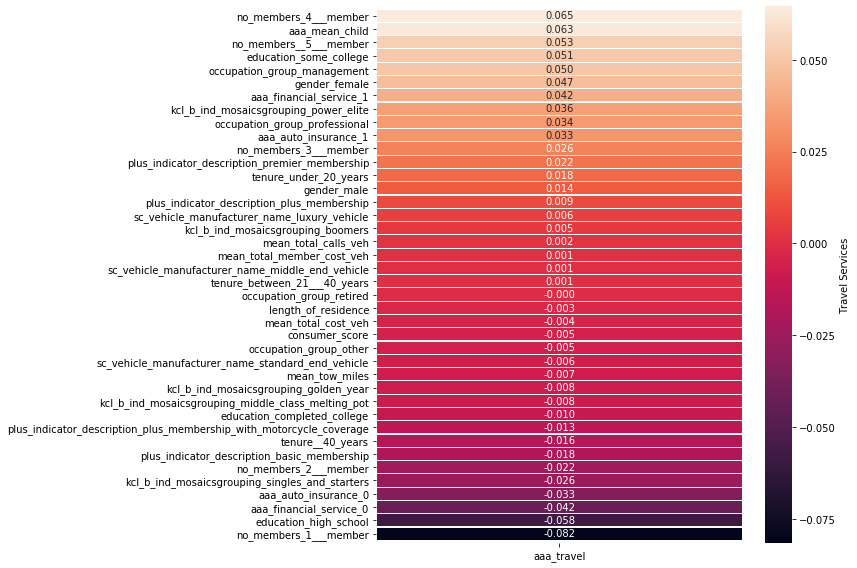

In [94]:
#  Correlation of AAA Roadside service
# Heat Map 
df_corr = df_prediction.corr()
df_corr.sort_values(by=var_to_predict[0], ascending=False, inplace=True)
df_corr = df_corr[df_corr.index.values!=var_to_predict[0]]
sns.heatmap(df_corr[[var_to_predict[0]]], annot=True, fmt=".3f", linewidths=0.1, xticklabels=True, 
                cbar_kws={'label': var_to_predict_title}, yticklabels=True)
bottom, top = plt.ylim()
plt.ylim(bottom + 0.7, top - 0.7)
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_var_corr')
plt.show()
#df_corr

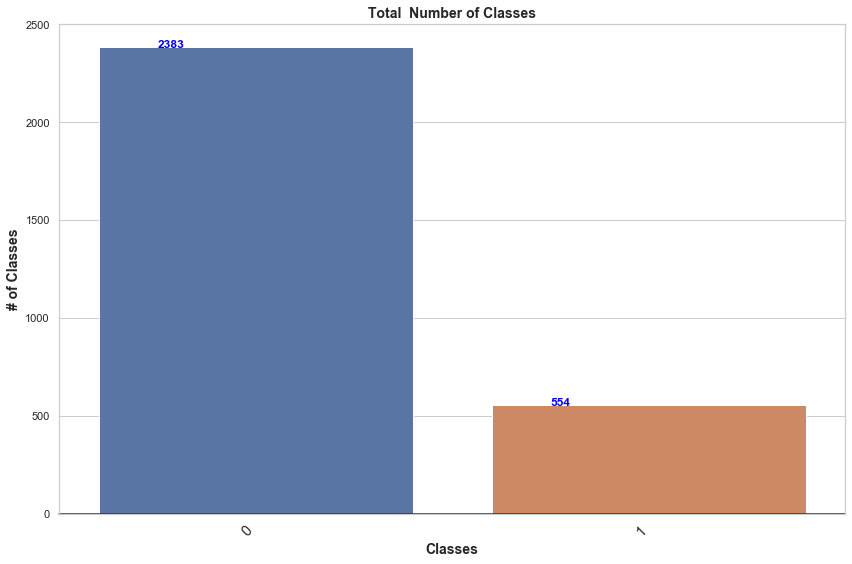

In [95]:
%matplotlib inline
pd.plotting.register_matplotlib_converters()
pd.options.display.float_format = '{:.4f}'.format
rcParams.update({'figure.autolayout': True, 'figure.figsize':(12,8),'axes.titlesize':14})
draw_col_shape(df_prediction,var_to_predict)

Random over-sampling:
1    2383
0    2383
Name: aaa_travel, dtype: int64


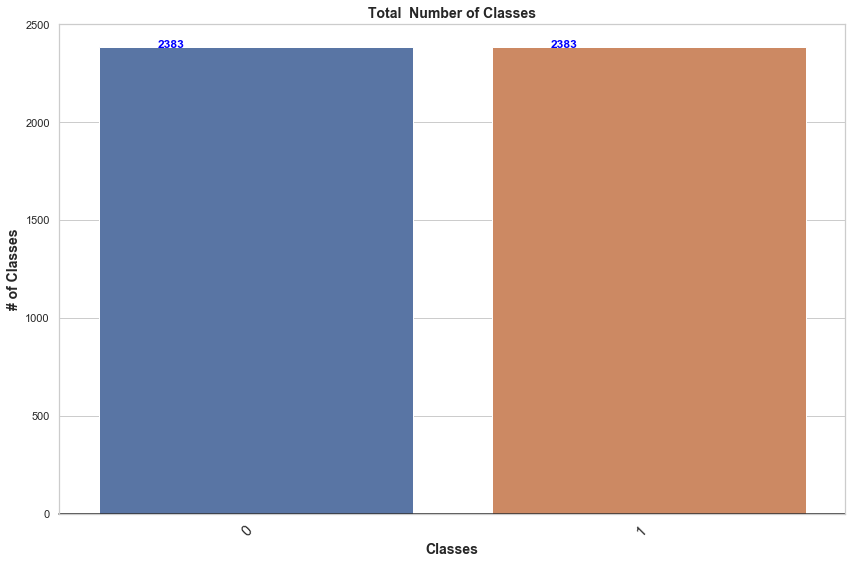

In [98]:
# Balance class Up Sampling
# As there is only 28 members that are using the Deposit Service.
# Will upsample the 11 (yes) to 5233
# Evaluate imbalanced classification model with different metrics

np.random.seed(42)
# Class count
count_class_0, count_class_1 = df_prediction[var_to_predict[0]].value_counts()

# Divide by class
df_class_0 = df_prediction[df_prediction[var_to_predict[0]] == 0]
df_class_1 = df_prediction[df_prediction[var_to_predict[0]] == 1]


df_class_1_over = df_class_1.sample(count_class_0, replace=True)
df_test_over = pd.concat([df_class_0, df_class_1_over], axis=0)

print('Random over-sampling:')
print(df_test_over[var_to_predict[0]].value_counts())

draw_col_shape(df_test_over,var_to_predict)
plt.show()

Random down-sampling:
1    554
0    554
Name: aaa_travel, dtype: int64


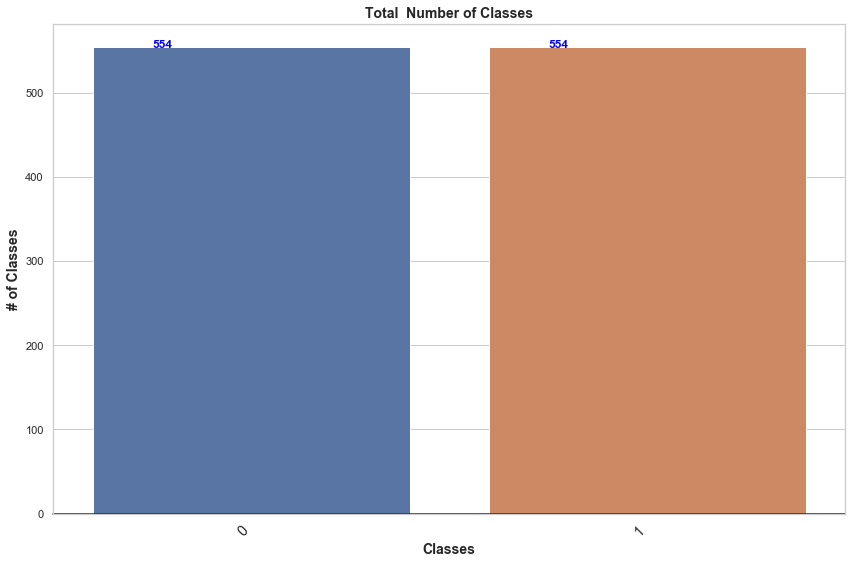

In [99]:
# Down sample Majority Class To Match Minority Class
# Indicies of each class' observations

np.random.seed(42)
count_class_0, count_class_1 = df_prediction[var_to_predict[0]].value_counts()

# Divide by class
df_class_0 = df_prediction[df_prediction[var_to_predict[0]] == 0]
df_class_1 = df_prediction[df_prediction[var_to_predict[0]] == 1]

df_class_0_down = df_class_0.sample(count_class_1, replace=True)
df_test_down = pd.concat([df_class_1, df_class_0_down], axis=0)

print('Random down-sampling:')
print(df_test_down[var_to_predict[0]].value_counts())

draw_col_shape(df_test_down,var_to_predict)
plt.show()

In [100]:
df_test_over.corr()

,mean_total_calls_veh,consumer_score,mean_total_cost_veh,mean_total_member_cost_veh,mean_tow_miles,length_of_residence,aaa_mean_child,aaa_financial_service_0,aaa_financial_service_1,plus_indicator_description_basic_membership,plus_indicator_description_plus_membership,plus_indicator_description_plus_membership_with_motorcycle_coverage,plus_indicator_description_premier_membership,occupation_group_management,occupation_group_other,occupation_group_professional,occupation_group_retired,sc_vehicle_manufacturer_name_luxury_vehicle,sc_vehicle_manufacturer_name_middle_end_vehicle,sc_vehicle_manufacturer_name_standard_end_vehicle,tenure__40_years,tenure_between_21___40_years,tenure_under_20_years,aaa_auto_insurance_0,aaa_auto_insurance_1,no_members__5___member,no_members_1___member,no_members_2___member,no_members_3___member,no_members_4___member,gender_female,gender_male,kcl_b_ind_mosaicsgrouping_boomers,kcl_b_ind_mosaicsgrouping_golden_year,kcl_b_ind_mosaicsgrouping_middle_class_melting_pot,kcl_b_ind_mosaicsgrouping_power_elite,kcl_b_ind_mosaicsgrouping_singles_and_starters,education_completed_college,education_high_school,education_some_college,aaa_travel
mean_total_calls_veh,1.0000,0.0548,0.9704,0.9962,0.2200,0.0378,0.1213,-0.0354,0.0354,0.4847,0.4155,0.0148,0.1077,0.0338,-0.0043,0.0008,-0.0534,0.2739,0.1562,0.6712,-0.0848,0.0115,0.0891,-0.0435,0.0435,0.0857,-0.0686,-0.0139,-0.0165,0.0511,-0.0938,0.0723,0.0004,-0.0457,0.0328,0.0203,0.0620,0.0289,-0.0040,-0.0470,0.0051
consumer_score,0.0548,1.0000,-0.0164,0.0801,0.0851,0.0298,0.0067,-0.0591,0.0591,-0.0374,0.0260,0.0047,0.0011,0.0327,0.0104,0.0296,0.0009,-0.0346,0.4318,-0.1643,-0.0474,0.0106,0.0460,-0.0741,0.0741,0.0217,-0.0300,-0.0033,0.0371,-0.0215,-0.0322,0.0914,0.0426,0.0081,0.0053,0.0102,0.0292,-0.0399,-0.0029,0.0565,-0.0134
mean_total_cost_veh,0.9704,-0.0164,1.0000,0.9669,0.2131,0.0414,0.1111,-0.0221,0.0221,0.5045,0.4156,0.0135,0.1141,0.0322,-0.0088,0.0019,-0.0622,0.2284,0.1331,0.7291,-0.0718,0.0059,0.0788,-0.0367,0.0367,0.0759,-0.0511,-0.0244,-0.0146,0.0503,-0.0878,0.0549,-0.0072,-0.0424,0.0285,0.0148,0.0666,0.0290,0.0012,-0.0406,0.0013
mean_total_member_cost_veh,0.9962,0.0801,0.9669,1.0000,0.2247,0.0380,0.1196,-0.0391,0.0391,0.4786,0.4157,0.0150,0.1074,0.0351,-0.0030,0.0014,-0.0544,0.2854,0.1762,0.6504,-0.0881,0.0106,0.0937,-0.0467,0.0467,0.0881,-0.0718,-0.0125,-0.0157,0.0501,-0.0949,0.0747,0.0055,-0.0477,0.0318,0.0214,0.0631,0.0266,-0.0028,-0.0461,0.0031
mean_tow_miles,0.2200,0.0851,0.2131,0.2247,1.0000,0.0088,0.0608,-0.0564,0.0564,-0.0548,0.2080,0.1349,0.1547,0.0130,-0.0310,0.0157,-0.0408,0.1043,0.0107,0.1291,-0.0718,-0.0033,0.0869,-0.0285,0.0285,0.0178,-0.0212,-0.0245,0.0245,0.0159,-0.0288,-0.0027,-0.0039,-0.0380,-0.0007,0.0340,0.0262,-0.0171,0.0248,-0.0160,0.0042
length_of_residence,0.0378,0.0298,0.0414,0.0380,0.0088,1.0000,0.2780,0.0318,-0.0318,0.0365,-0.0103,0.0010,0.0368,0.0955,-0.0253,0.0831,0.1484,-0.0413,0.0332,0.0491,0.1040,-0.0127,-0.1104,-0.0368,0.0368,-0.1027,0.1291,0.0256,-0.0194,-0.0845,0.1247,0.1493,0.0396,0.1683,0.0208,0.0023,-0.0259,0.1610,0.1789,0.2066,-0.0259
aaa_mean_child,0.1213,0.0067,0.1111,0.1196,0.0608,0.2780,1.0000,-0.0699,0.0699,0.0700,0.0568,-0.0037,-0.0438,0.0821,-0.0182,0.1364,-0.0281,0.0268,-0.0015,0.0903,-0.1043,0.0706,0.0597,-0.0586,0.0586,0.1664,-0.2280,-0.1421,0.1220,0.1921,0.0623,0.0809,0.0495,-0.0937,0.1288,0.2118,-0.0135,0.0704,0.1271,0.1216,0.0673
aaa_financial_service_0,-0.0354,-0.0591,-0.0221,-0.0391,-0.0564,0.0318,-0.0699,1.0000,-1.0000,0.0206,-0.0323,-0.0259,-0.0305,-0.0454,0.0321,-0.0830,0.0577,0.0119,-0.0821,0.0045,0.0754,-0.0293,-0.0623,0.1122,-0.1122,-0.1960,0.1224,0.0730,-0.0252,-0.0563,-0.0063,-0.0305,-0.0314,0.0494,-0.0467,-0.0661,0.0194,-0.0364,0.0304,0.0163,-0.0738
aaa_financial_service_1,0.0354,0.0591,0.0221,0.0391,0.0564,-0.0318,0.0699,-1.0000,1.0000,-0.0206,0.0323,0.0259,0.0305,0.0454,-0.0321,0.0830,-0.0577,-0.0119,0.0821,-0.0045,-0.0754,0.0293,0.0623,-0.1122,0.1122,0.1960,-0.1224,-0.0730,0.0252,0.0563,0.0063,0.0305,0

In [101]:
df_test_down.describe()

,mean_total_calls_veh,consumer_score,mean_total_cost_veh,mean_total_member_cost_veh,mean_tow_miles,length_of_residence,aaa_mean_child,aaa_financial_service_0,aaa_financial_service_1,plus_indicator_description_basic_membership,plus_indicator_description_plus_membership,plus_indicator_description_plus_membership_with_motorcycle_coverage,plus_indicator_description_premier_membership,occupation_group_management,occupation_group_other,occupation_group_professional,occupation_group_retired,sc_vehicle_manufacturer_name_luxury_vehicle,sc_vehicle_manufacturer_name_middle_end_vehicle,sc_vehicle_manufacturer_name_standard_end_vehicle,tenure__40_years,tenure_between_21___40_years,tenure_under_20_years,aaa_auto_insurance_0,aaa_auto_insurance_1,no_members__5___member,no_members_1___member,no_members_2___member,no_members_3___member,no_members_4___member,gender_female,gender_male,kcl_b_ind_mosaicsgrouping_boomers,kcl_b_ind_mosaicsgrouping_golden_year,kcl_b_ind_mosaicsgrouping_middle_class_melting_pot,kcl_b_ind_mosaicsgrouping_power_elite,kcl_b_ind_mosaicsgrouping_singles_and_starters,education_completed_college,education_high_school,education_some_college,aaa_travel
count,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000,1108.0000
mean,1.9944,0.0149,33.1228,105.8423,1.3369,8.0754,1.4967,0.9034,0.0966,0.3926,0.2861,0.0009,0.0253,0.1119,0.0289,0.1877,0.2491,0.0884,0.0379,0.5785,0.6092,0.1733,0.2175,0.6733,0.3267,0.0857,0.2211,0.3547,0.1977,0.1408,0.3204,0.2554,0.2392,0.3150,0.0514,0.0912,0.0415,0.1173,0.1733,0.2392,0.5000
std,1.2172,0.0013,21.4851,65.1336,3.0671,5.4892,1.0580,0.2955,0.2955,0.4885,0.4521,0.0300,0.1570,0.3154,0.1675,0.3907,0.4327,0.2841,0.1911,0.4940,0.4881,0.3787,0.4127,0.4692,0.4692,0.2801,0.4152,0.4786,0.3984,0.3480,0.4668,0.4363,0.4268,0.4647,0.2210,0.2880,0.1996,0.3220,0.3787,0.4268,0.5002
min,0.1645,0.0123,0.0072,8.4416,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
25%,0.1645,0.0143,0.0072,8.4416,0.0000,3.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
50%,2.5485,0.0149,46.3234,135.7757,0.0000,8.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.5000
75%,2.8938,0.0154,47.1084,151.7466,1.5284,13.0000,2.0000,1.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000
max,4.1892,0.0227,55.6096,254.1365,42.0000,28.5000,6.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


# Setting Up the Training and Test data for up Sampling the minority class
To use the same split in all models

In [102]:
num_folds = 10
np.random.seed(42)
scoring = 'accuracy'
test_size = 0.40

# Create input and output dataframes
X_df = pd.DataFrame(df_test_over,columns=X_cols)
y_df = pd.DataFrame(df_test_over,columns=y_cols)

scaler = MinMaxScaler(feature_range=(0, 1))
scaled_df_mm = MinMaxScaler(feature_range=(0, 1)).fit_transform(X_df)
scaled_df_mm = pd.DataFrame(scaled_df_mm, columns=X_cols)

# Split Train and test
trainX, testX, trainy, testy = train_test_split(scaled_df_mm, y_df, test_size=test_size)

# Algorithms Search and Testing

Travel Services - Algorithm Comparison - Over Sampling
LR: Accuracy : 0.582713 - Std. Dev.: (0.027268)
LDA: Accuracy : 0.580264 - Std. Dev.: (0.024436)
KNN: Accuracy : 0.660725 - Std. Dev.: (0.020552)
CART: Accuracy : 0.823376 - Std. Dev.: (0.021491)
NB: Accuracy : 0.559281 - Std. Dev.: (0.017195)
SVM: Accuracy : 0.572932 - Std. Dev.: (0.025399)
SGD: Accuracy : 0.552284 - Std. Dev.: (0.034059)
AB: Accuracy : 0.574669 - Std. Dev.: (0.022207)
GBM: Accuracy : 0.644987 - Std. Dev.: (0.011216)
RF: Accuracy : 0.868836 - Std. Dev.: (0.017842)
ET: Accuracy : 0.899618 - Std. Dev.: (0.013158)
XGB: Accuracy : 0.632035 - Std. Dev.: (0.015074)


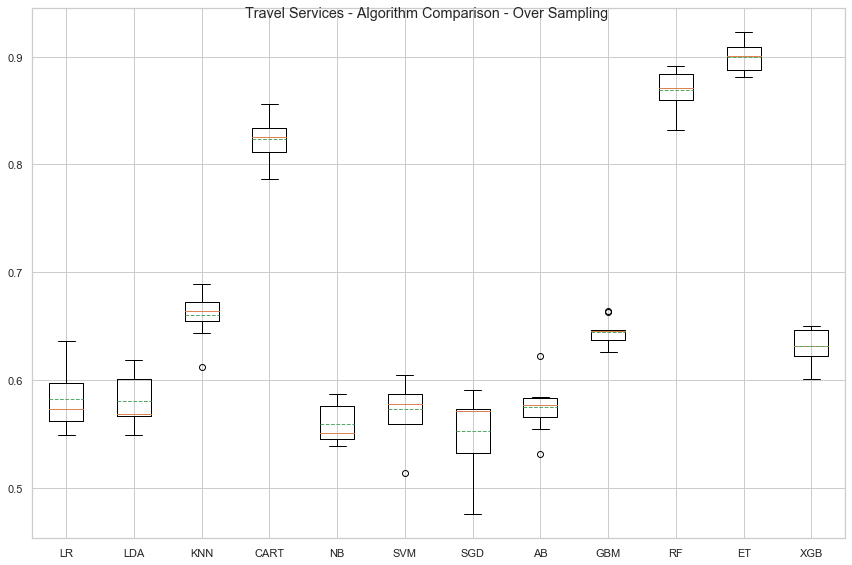

In [103]:
# Algorithms Search
# Spot Check Algorithms

print(var_to_predict_title+' - Algorithm Comparison - Over Sampling')
models = []
models.append(('LR', LogisticRegression(solver='liblinear')))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC(gamma='auto')))
models.append(('SGD', SGDClassifier(loss='log')))
results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=num_folds)
    cv_results = cross_val_score(model, trainX, trainy, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: Accuracy : %f - Std. Dev.: (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

# Ensembles Methods
ensembles = []
ensembles.append(('AB', AdaBoostClassifier()))
ensembles.append(('GBM', GradientBoostingClassifier()))
ensembles.append(('RF', RandomForestClassifier(n_estimators=10)))
ensembles.append(('ET', ExtraTreesClassifier(n_estimators=10)))
ensembles.append(('XGB', XGBClassifier()))
for name, model in ensembles:
    kfold = KFold(n_splits=num_folds)
    cv_results = cross_val_score(model, trainX, trainy, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: Accuracy : %f - Std. Dev.: (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

# Compare Algorithms
fig = plt.figure()
fig.suptitle(var_to_predict_title+' - Algorithm Comparison - Over Sampling')
ax = fig.add_subplot(111)
plt.boxplot(results, meanline=True, showmeans=True)
ax.set_xticklabels(names)
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_algorithms')
plt.show()

# Setting Up the Training and Test data for Down Sampling the mayority class
To use the same split in all models

In [104]:
num_folds = 10
np.random.seed(42)
scoring = 'accuracy'
test_size = 0.4

# Create input and output dataframes
X_df = pd.DataFrame(df_test_down,columns=X_cols)
y_df = pd.DataFrame(df_test_down,columns=y_cols)

scaler = MinMaxScaler(feature_range=(0, 1))
scaled_df_mm = MinMaxScaler(feature_range=(0, 1)).fit_transform(X_df)
scaled_df_mm = pd.DataFrame(scaled_df_mm, columns=X_cols)

# Split Train and test
trainX, testX, trainy, testy = train_test_split(scaled_df_mm, y_df, test_size=test_size)

Travel Services - Algorithm Comparison - Down Sampling
LR: Accuracy : 0.557304 - Std. Dev.: (0.042927)
LDA: Accuracy : 0.536137 - Std. Dev.: (0.051160)
KNN: Accuracy : 0.509091 - Std. Dev.: (0.052284)
CART: Accuracy : 0.531547 - Std. Dev.: (0.083401)
NB: Accuracy : 0.592017 - Std. Dev.: (0.043696)
SVM: Accuracy : 0.551199 - Std. Dev.: (0.023072)
SGD: Accuracy : 0.522637 - Std. Dev.: (0.051944)
AB: Accuracy : 0.546789 - Std. Dev.: (0.045694)
GBM: Accuracy : 0.549548 - Std. Dev.: (0.061764)
RF: Accuracy : 0.549706 - Std. Dev.: (0.053953)
ET: Accuracy : 0.512280 - Std. Dev.: (0.065443)
XGB: Accuracy : 0.564767 - Std. Dev.: (0.064480)


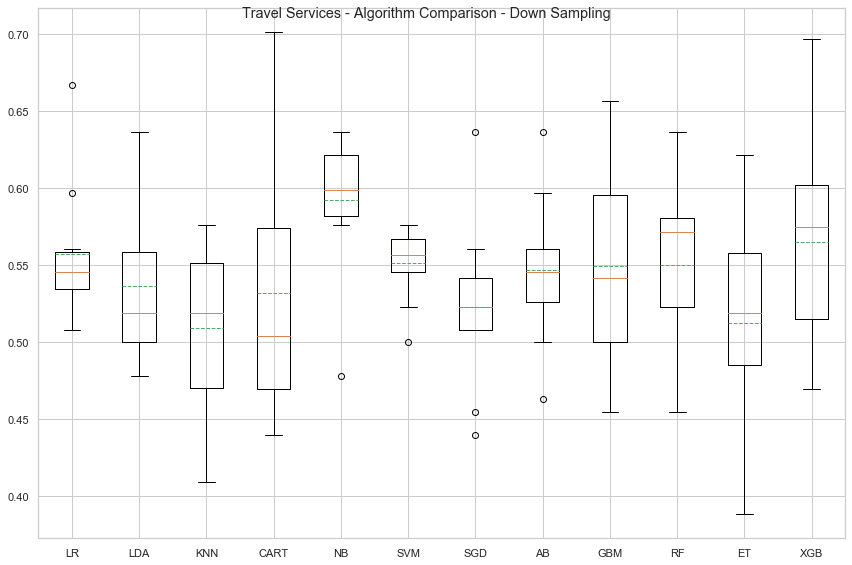

In [105]:
# Spot Check Algorithms
print(var_to_predict_title+' - Algorithm Comparison - Down Sampling')
models = []
models.append(('LR', LogisticRegression(solver='liblinear')))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC(gamma='auto')))
models.append(('SGD', SGDClassifier(loss='log')))
results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=num_folds)
    cv_results = cross_val_score(model, trainX, trainy, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: Accuracy : %f - Std. Dev.: (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

# Ensembles Methods
ensembles = []
ensembles.append(('AB', AdaBoostClassifier()))
ensembles.append(('GBM', GradientBoostingClassifier()))
ensembles.append(('RF', RandomForestClassifier(n_estimators=10)))
ensembles.append(('ET', ExtraTreesClassifier(n_estimators=10)))
ensembles.append(('XGB', XGBClassifier()))
for name, model in ensembles:
    kfold = KFold(n_splits=num_folds)
    cv_results = cross_val_score(model, trainX, trainy, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: Accuracy : %f - Std. Dev.: (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

# Compare Algorithms
fig = plt.figure()
fig.suptitle(var_to_predict_title+' - Algorithm Comparison - Down Sampling')
ax = fig.add_subplot(111)
plt.boxplot(results, meanline=True, showmeans=True)
ax.set_xticklabels(names)
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_algorithms_down')
plt.show()

# Observation
Based on the previous graph, the model performs better by up sampling the minority class.  the rest of the analysis will be performed using the up sampling data.
* Travel Services - Algorithm Comparison - Over Sampling
    * LR: Accuracy : 0.582713 - Std. Dev.: (0.027268)
    * LDA: Accuracy : 0.580264 - Std. Dev.: (0.024436)
    * KNN: Accuracy : 0.660725 - Std. Dev.: (0.020552)
    * CART: Accuracy : 0.823376 - Std. Dev.: (0.021491)
    * NB: Accuracy : 0.559281 - Std. Dev.: (0.017195)
    * SVM: Accuracy : 0.572932 - Std. Dev.: (0.025399)
    * SGD: Accuracy : 0.552284 - Std. Dev.: (0.034059)
    * AB: Accuracy : 0.574669 - Std. Dev.: (0.022207)
    * GBM: Accuracy : 0.644987 - Std. Dev.: (0.011216)
    * RF: Accuracy : 0.868836 - Std. Dev.: (0.017842)
    * ET: Accuracy : 0.899618 - Std. Dev.: (0.013158)
    * XGB: Accuracy : 0.632035 - Std. Dev.: (0.015074)

* Travel Services - Algorithm Comparison - Down Sampling
    * LR: Accuracy : 0.557304 - Std. Dev.: (0.042927)
    * LDA: Accuracy : 0.536137 - Std. Dev.: (0.051160)
    * KNN: Accuracy : 0.509091 - Std. Dev.: (0.052284)
    * CART: Accuracy : 0.531547 - Std. Dev.: (0.083401)
    * NB: Accuracy : 0.592017 - Std. Dev.: (0.043696)
    * SVM: Accuracy : 0.551199 - Std. Dev.: (0.023072)
    * SGD: Accuracy : 0.522637 - Std. Dev.: (0.051944)
    * AB: Accuracy : 0.546789 - Std. Dev.: (0.045694)
    * GBM: Accuracy : 0.549548 - Std. Dev.: (0.061764)
    * RF: Accuracy : 0.549706 - Std. Dev.: (0.053953)
    * ET: Accuracy : 0.512280 - Std. Dev.: (0.065443)
    * XGB: Accuracy : 0.564767 - Std. Dev.: (0.064480)

In [106]:
num_folds = 10
np.random.seed(42)
scoring = 'accuracy'
test_size = 0.40

# Create input and output dataframes
X_df = pd.DataFrame(df_test_over,columns=X_cols)
y_df = pd.DataFrame(df_test_over,columns=y_cols)

scaler = MinMaxScaler(feature_range=(0, 1))
scaled_df_mm = MinMaxScaler(feature_range=(0, 1)).fit_transform(X_df)
scaled_df_mm = pd.DataFrame(scaled_df_mm, columns=X_cols)

# Split Train and test
trainX, testX, trainy, testy = train_test_split(scaled_df_mm, y_df, test_size=test_size)

# Grid Search Logistic Regression

In [107]:
# Grid Search with Up Sampling
# Logistic regression
np.random.seed(42)
logregpipe = Pipeline([('scale', MinMaxScaler(feature_range=(0, 1))),
                   ('logreg',LogisticRegression(penalty='l2',multi_class="auto"))])
# Grid search to determine the value of C and solver
param_grid = {'logreg__C':np.arange(0.01,100,10), 'logreg__solver':['lbfgs','liblinear','newton-cg']}
logreg_cv = GridSearchCV(logregpipe,param_grid,cv=num_folds,return_train_score=True, scoring=scoring)
logreg_cv.fit(trainX, trainy)
print('Logistic regression - Over Sampling the minority class')
print('Logistic Regression - Best Parameters       : ', logreg_cv.best_params_)

bestlogreg = logreg_cv.best_estimator_
bestlogreg.fit(trainX,trainy)
bestlogreg.coef_ = bestlogreg.named_steps['logreg'].coef_
print('Logistic Regression - Accuracy Training Data : %.3f' % bestlogreg.score(trainX,trainy))
print('Logistic Regression - Accuracy Test Data     : %.3f' % bestlogreg.score(testX,testy))

Logistic regression - Over Sampling the minority class
Logistic Regression - Best Parameters       :  {'logreg__C': 70.01, 'logreg__solver': 'lbfgs'}
Logistic Regression - Accuracy Training Data : 0.600
Logistic Regression - Accuracy Test Data     : 0.571


# Observation
These are the best parameters:

Grid run identifying best C
    * Logistic regression - Over Sampling the minority class
    * Logistic Regression - Best Parameters       :  {'logreg__C': 70.01, 'logreg__solver': 'lbfgs'}
    * Logistic Regression - Accuracy Training Data : 0.600
    * Logistic Regression - Accuracy Test Data     : 0.571

Logistic Regression - Accuracy training          : 0.602
Logistic Regression - Accuracy test              : 0.574
Logistic Regression - Precision                  : 0.572
Logistic Regression - Recall                     : 0.547
Logistic Regression - F-measure                  : 0.559
Logistic Regression - Log-Loss                   : 14.707
Logistic Regression - Cross Entropy Loss         : 2.578
Logistic Regression - No Skill - ROC AUC         : 0.500
Logistic Regression - ROC AUC                    : 0.592
Logistic Regression - Cross Validation Accuracy  : 0.570 (+/- 0.054)


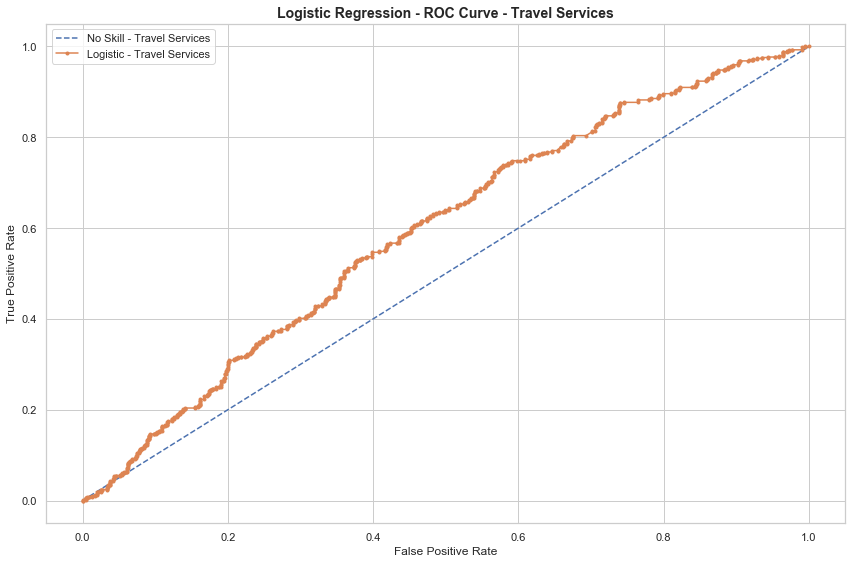

In [108]:
# Use Logistic Regression algorithms to classify which customers are going to use Deposit Service or not (0 = No, 1 = Yes)
# Using Oversample Dataframe with transformation MinMax Scaler

np.random.seed(42)
# Define model 
lr = LogisticRegression(penalty='l2',multi_class="auto", solver="lbfgs", C=70.01)

# Fit model
lr.fit(trainX, trainy)

# Predict on test set
yhat = lr.predict(testX)

# Generate a no skill prediction for ROC Curve
ns_probs = [0 for _ in range(len(testy))]

# Predict probabilities
lr_probs = lr.predict_proba(testX)

# Keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]

# Calculate scores
ns_auc = roc_auc_score(testy, ns_probs)
lr_auc = roc_auc_score(testy, lr_probs)

# Calculate Cross valdation scores
lr_scores = cross_val_score(lr, testX, testy, cv=num_folds)

# Evaluate predictions
print('Logistic Regression - Accuracy training          : %.3f' % accuracy_score(lr.predict(trainX), trainy))
print('Logistic Regression - Accuracy test              : %.3f' % accuracy_score(testy, yhat))
print('Logistic Regression - Precision                  : %.3f' % precision_score(testy, yhat))
print('Logistic Regression - Recall                     : %.3f' % recall_score(testy, yhat))
print('Logistic Regression - F-measure                  : %.3f' % f1_score(testy, yhat))
print('Logistic Regression - Log-Loss                   : %.3f' % log_loss(testy, yhat))
print('Logistic Regression - Cross Entropy Loss         : %.3f' % cross_entropy(yhat, testy[var_to_predict[0]]))
print('Logistic Regression - No Skill - ROC AUC         : %.3f' % (ns_auc))
print('Logistic Regression - ROC AUC                    : %.3f' % (lr_auc))
print('Logistic Regression - Cross Validation Accuracy  : %0.3f (+/- %0.3f)' % (lr_scores.mean(), lr_scores.std() * 2))

# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(testy, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(testy, lr_probs)
# plot the roc curve for the model
plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill - '+var_to_predict_title)
plt.plot(lr_fpr, lr_tpr, marker='.', label='Logistic - '+var_to_predict_title)
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.legend()
# Show title
plt.title('Logistic Regression - ROC Curve - '+var_to_predict_title, loc='center', fontdict={'fontsize':14, 'fontweight':'bold'})
# show the plot
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_lr_roc')
plt.show()

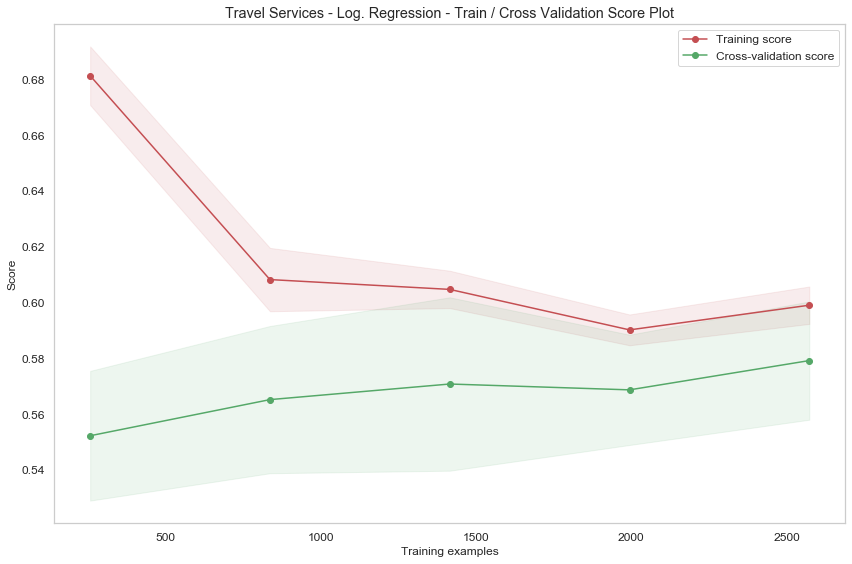

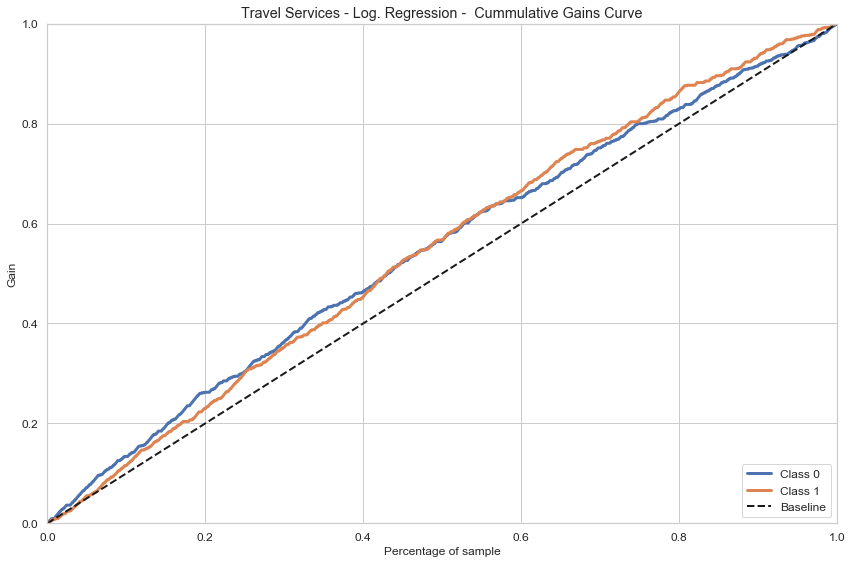

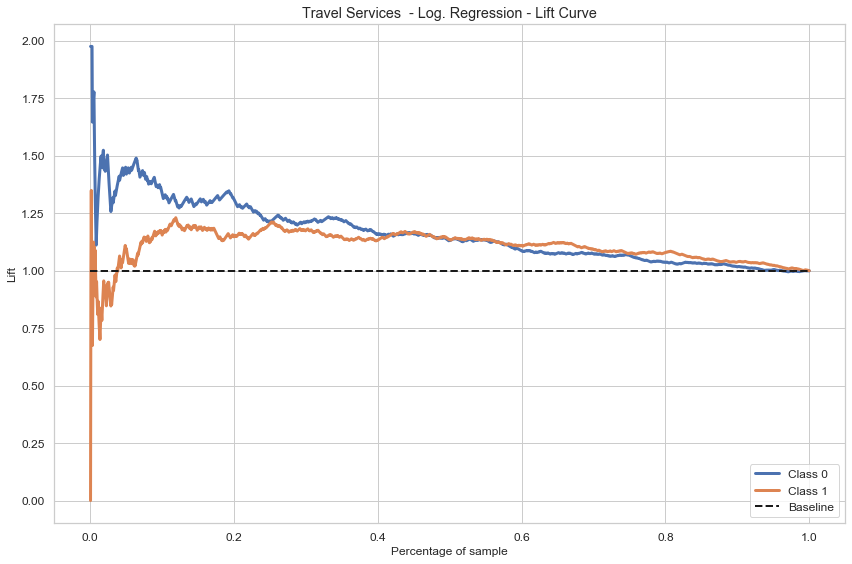

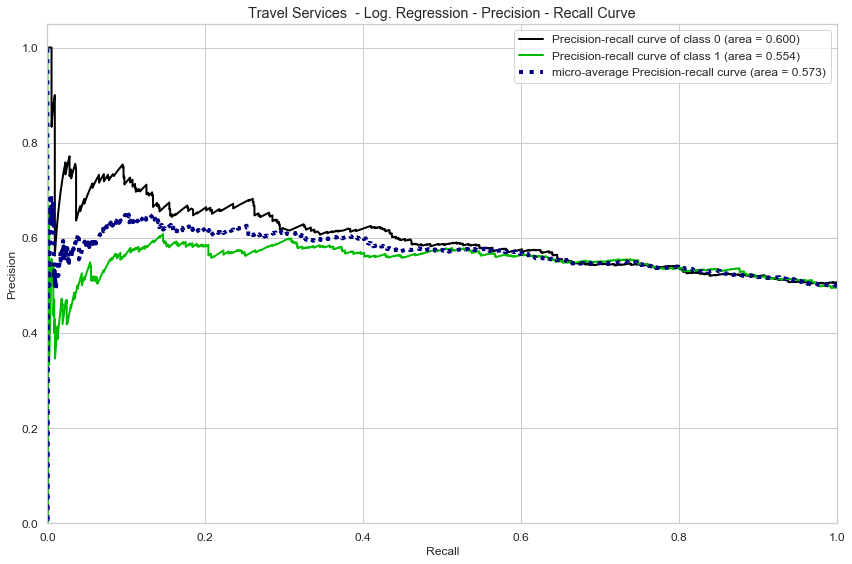

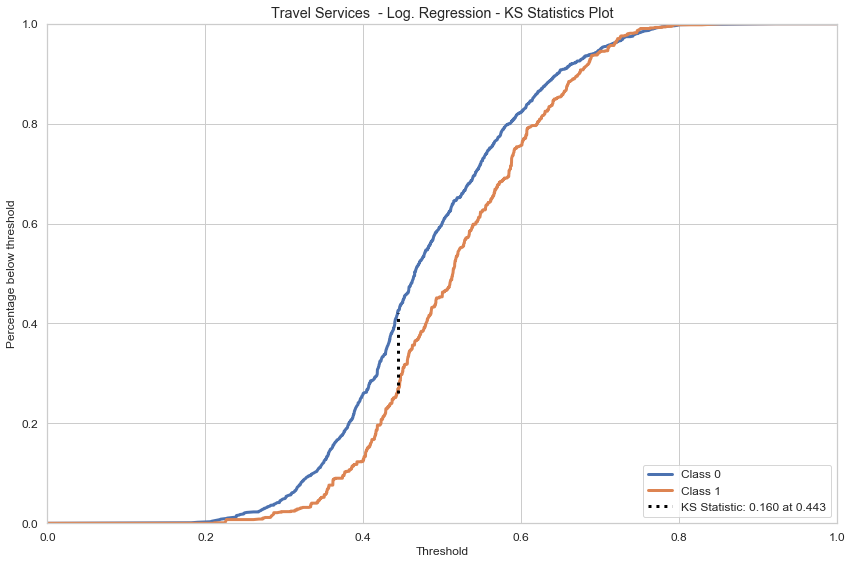

In [109]:
# Train / Cross Validation Score Plot
skplt.estimators.plot_learning_curve(lr, trainX, trainy, cv=num_folds, title=var_to_predict_title + ' - Log. Regression - Train / Cross Validation Score Plot')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_lr_txcval')
plt.show()

# Cummulative Gain Plot
skplt.metrics.plot_cumulative_gain(testy,lr.predict_proba(testX), title=var_to_predict_title + ' - Log. Regression -  Cummulative Gains Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_lr_cgc')
plt.show()

# Lift Curve Plot
skplt.metrics.plot_lift_curve(testy,lr.predict_proba(testX), title=var_to_predict_title + '  - Log. Regression - Lift Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_lr_liftc')
plt.show()

# Precision - Recall Curve
skplt.metrics.plot_precision_recall_curve(testy,lr.predict_proba(testX), title=var_to_predict_title + '  - Log. Regression - Precision - Recall Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_lr_prerecc')
plt.show()

# KS statistics Plot
skplt.metrics.plot_ks_statistic(testy, lr.predict_proba(testX), title=var_to_predict_title+'  - Log. Regression - KS Statistics Plot')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_lr_ksst')
plt.show()

Confusion matrix - Travel Services, without normalization - Logistic Regression
[[580 385]
 [427 515]]


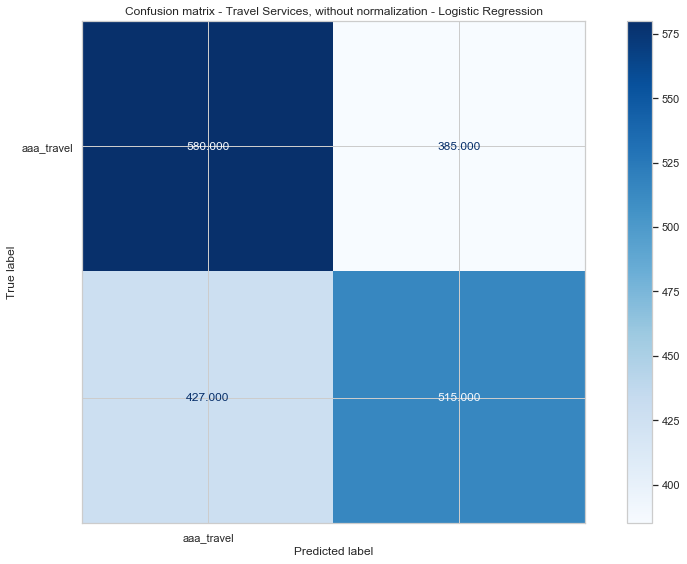

Normalized confusion matrix - Travel Services - Logistic Regression
[[0.6  0.4 ]
 [0.45 0.55]]


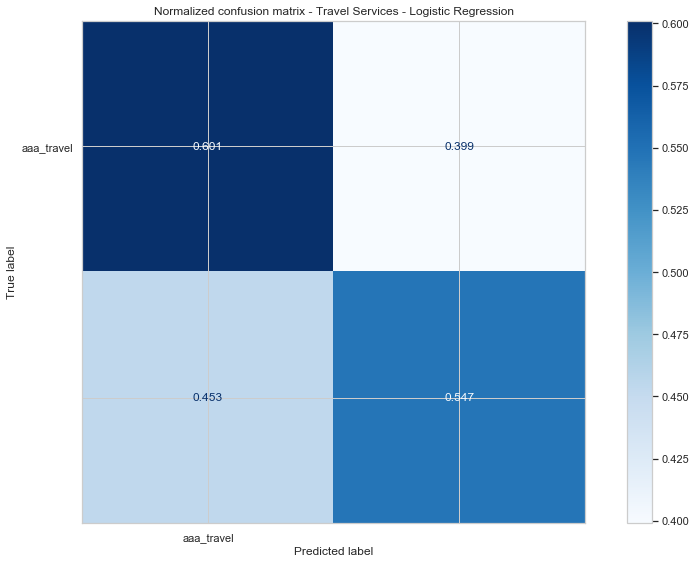

In [110]:
# Confusion Metrics
np.set_printoptions(precision=2)
i = 1
# Plot non-normalized confusion matrix
titles_options = [("Confusion matrix - "+var_to_predict_title+", without normalization - Logistic Regression", None),
                  ("Normalized confusion matrix - "+var_to_predict_title + " - Logistic Regression", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(lr, testX, testy,
                                 display_labels=testy,
                                 values_format='.3f',
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
    disp.ax_.set_title(title)
    print(title)
    print(disp.confusion_matrix)
    if i==1: plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_lr_cm')
    else: plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_lr_cm_1')
    i +=1
    plt.show()

In [111]:
coef_df_lgr = pd.DataFrame({'feature':testX.columns, 'coefs': lr.coef_[0]})
coef_df_lgr["abs_coeff"] = coef_df_lgr['coefs'].abs()
coef_df_lgr.sort_values("abs_coeff",ascending=False,inplace=True)
coef_df_lgr.nlargest(30,columns=["abs_coeff"])
counts_df_lgr = pd.DataFrame(coef_df_lgr.nlargest(30,columns=["abs_coeff"]), index=None)
#counts.reset_index(inplace=True)
counts_df_lgr.rename(columns={"feature": "Features (MinMax Transformer)", 'coefs':'Coefficients', 'abs_coeff': "ABS of Coeffs."}, inplace=True)
fig = ff.create_table(counts_df_lgr, height_constant=30, index=False)
fig.write_image('./model_pics/Travel/'+var_to_predict_save+'_lr_coef.png')
py.iplot(fig)

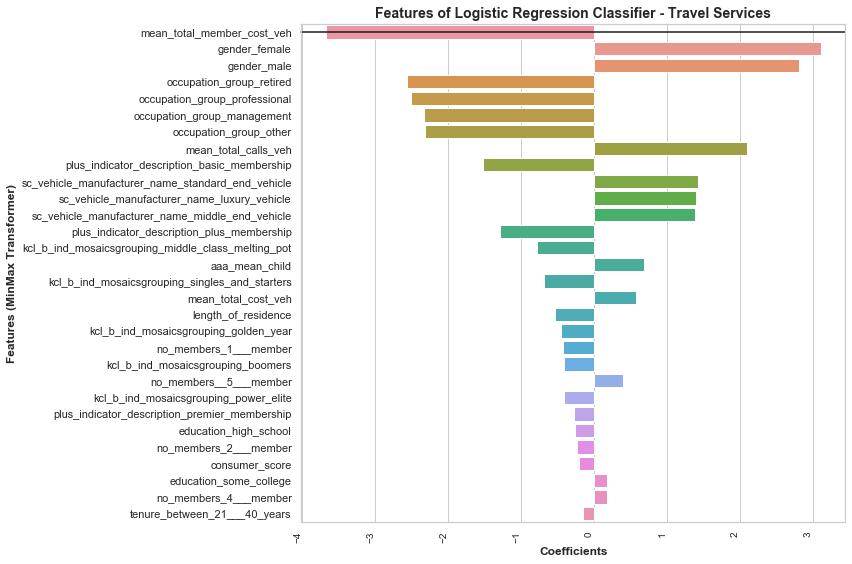

In [112]:
# Bar graph of Coefficients
sns.set(style="whitegrid")
plt.axhline(0, color="k", clip_on=False)
plt.ylabel("Coefs",fontsize=12, fontweight='bold')
plt.xlabel("Features", fontsize=12, fontweight='bold')
plt.title('Features of Logistic Regression Classifier - '+var_to_predict_title,loc='center', fontdict={'fontsize':14, 'fontweight':'bold'})
sns.barplot(y=counts_df_lgr['Features (MinMax Transformer)'], x=counts_df_lgr['Coefficients'], orient='h')
plt.xticks(
    rotation=90, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='small')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_lr_coef_1')
plt.show()

# k-Nearest Neighbors

In [113]:
# KNN Model - Grid search with RandomizedSearch
np.random.seed(42)
num_folds = 10
scoring='accuracy'
weight_options = ['uniform', 'distance']
algorithm_options = ['ball_tree', 'kd_tree', 'brute']
neighbors_settings = list(range(1, 10))
leaf_options = list(range(1, 50))
param_grid = dict(n_neighbors=neighbors_settings, weights=weight_options, algorithm=algorithm_options, leaf_size=leaf_options)

knn = KNeighborsClassifier()
best_scores = []
for _ in range(5):
    rand = RandomizedSearchCV(knn, param_grid, cv=num_folds, scoring=scoring, n_iter=10)
    rand.fit(trainX,trainy)
    best_scores.append([rand.best_params_,rand.best_score_])

for i in range(len(best_scores)):
    print('The best parameters : ',best_scores[i])

The best parameters :  [{'weights': 'uniform', 'n_neighbors': 1, 'leaf_size': 43, 'algorithm': 'kd_tree'}, 0.8261673414304994]
The best parameters :  [{'weights': 'distance', 'n_neighbors': 2, 'leaf_size': 38, 'algorithm': 'brute'}, 0.826867868973132]
The best parameters :  [{'weights': 'distance', 'n_neighbors': 2, 'leaf_size': 6, 'algorithm': 'kd_tree'}, 0.825817691080849]
The best parameters :  [{'weights': 'uniform', 'n_neighbors': 1, 'leaf_size': 26, 'algorithm': 'brute'}, 0.8296650717703351]
The best parameters :  [{'weights': 'distance', 'n_neighbors': 4, 'leaf_size': 14, 'algorithm': 'ball_tree'}, 0.7827935222672064]


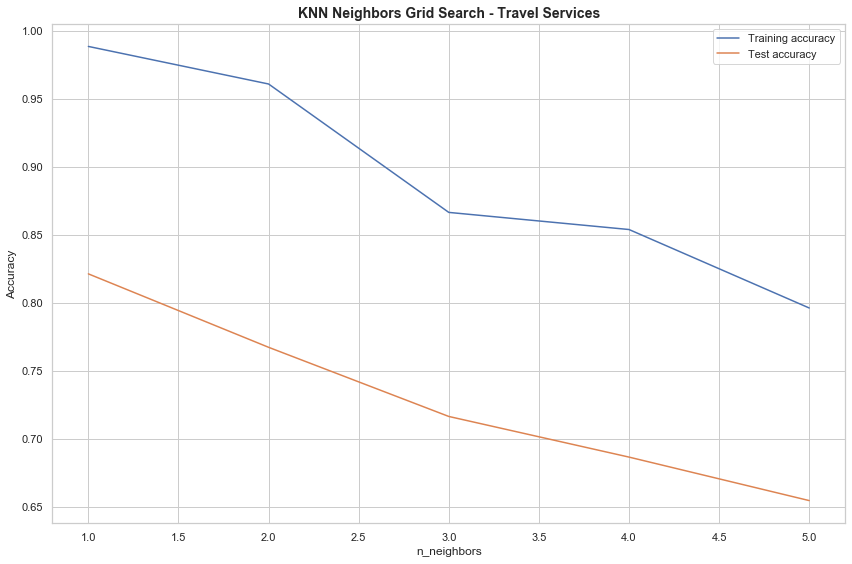

In [114]:
# KNN Model - Grid search
# The best parameters :
    # The best parameters :  [{'weights': 'uniform', 'n_neighbors': 1, 'leaf_size': 26, 'algorithm': 'brute'}, 0.8296650717703351]
np.random.seed(42)

training_accuracy = []
test_accuracy = []
# try n_neighbors from 1 to 20
neighbors_settings = range(1, 6)

for n_neighbors in neighbors_settings:
    # build the model
    knn = KNeighborsClassifier(n_neighbors=n_neighbors,  weights='uniform', leaf_size=26, algorithm='brute')
    knn.fit(trainX, trainy)
    # record training set accuracy
    training_accuracy.append(knn.score(trainX, trainy))
    # record test set accuracy
    test_accuracy.append(knn.score(testX, testy))

plt.plot(neighbors_settings, training_accuracy, label="Training accuracy")
plt.plot(neighbors_settings, test_accuracy, label="Test accuracy")
plt.ylabel("Accuracy")
plt.xlabel("n_neighbors")
plt.legend()
# Show title
plt.title('KNN Neighbors Grid Search - '+var_to_predict_title,loc='center', fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_knn_compare_model')

# Observations
The plot shows the training and test set accuracy on the y-axis against the setting of n_neighbors on the x-axis. Considering a single nearest neighbor, the prediction on the training set is perfect. But when more neighbors are considered, the training accuracy drops, indicating that using more than 2 neighbor leads to a model that is too complex.

The best performance is somewhere around 2 neighbors. Still, it is good to keep the scale of the plot in mind. The worst performance is more than 82% accuracy, which might still be pretty good.

The above plot suggests that we should choose n_neighbors= where the model gets its stability. 
Outcome of the Grid Search above 
* The best parameters :  [{'weights': 'uniform', 'n_neighbors': 1, 'leaf_size': 26, 'algorithm': 'brute'}, 0.8296650717703351]
    

Accuracy of K-NN classifier on training set: 0.988
Accuracy of K-NN classifier on test set: 0.821
K-NN classifier - Precision                  : 0.764
K-NN classifier - Recall                     : 0.923
K-NN classifier - F-measure                  : 0.836
K-NN classifier - Log-Loss                   : 6.176
K-NN Classifier - Cross Entropy Loss         : 0.441
K-NN classifier - No Skill - ROC AUC         : 0.500
K-NN classifier - ROC AUC                    : 0.822
K-NN classifier - Cross Validation Accuracy  : 0.761 (+/- 0.063)


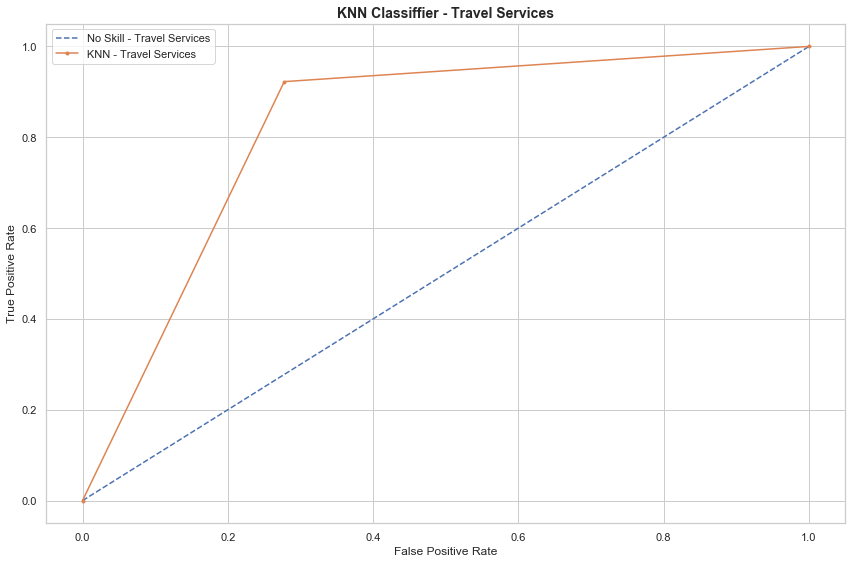

In [115]:
# Best model
# # The best parameters :  [{'weights': 'uniform', 'n_neighbors': 1, 'leaf_size': 26, 'algorithm': 'brute'}, 0.8296650717703351]

knn = KNeighborsClassifier(n_neighbors=1, leaf_size=26,algorithm='brute', weights='uniform')
knn.fit(trainX, trainy)


print('Accuracy of K-NN classifier on training set: {:.3f}'.format(knn.score(trainX, trainy)))
print('Accuracy of K-NN classifier on test set: {:.3f}'.format(knn.score(testX, testy)))

# Predict on test set
yhat = knn.predict(testX)

# Generate a no skill prediction for ROC Curve
ns_probs = [0 for _ in range(len(testy))]

# Predict probabilities
knn_probs = knn.predict_proba(testX)

# Keep probabilities for the positive outcome only
knn_probs = knn_probs[:, 1]

# Calculate scores
ns_auc = roc_auc_score(testy, ns_probs)
knn_auc = roc_auc_score(testy, knn_probs)

# Calculate Cross valdation scores
knn_scores = cross_val_score(knn, testX, testy, cv=num_folds)

# Evaluate predictions
print('K-NN classifier - Precision                  : %.3f' % precision_score(testy, yhat))
print('K-NN classifier - Recall                     : %.3f' % recall_score(testy, yhat))
print('K-NN classifier - F-measure                  : %.3f' % f1_score(testy, yhat))
print('K-NN classifier - Log-Loss                   : %.3f' % log_loss(testy, yhat))
print('K-NN Classifier - Cross Entropy Loss         : %.3f' % cross_entropy(yhat, testy[var_to_predict[0]]))
print('K-NN classifier - No Skill - ROC AUC         : %.3f' % (ns_auc))
print('K-NN classifier - ROC AUC                    : %.3f' % (knn_auc))
print("K-NN classifier - Cross Validation Accuracy  : %0.3f (+/- %0.3f)" % (knn_scores.mean(), knn_scores.std() * 2))

# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(testy, ns_probs)
knn_fpr, knn_tpr, _ = roc_curve(testy, knn_probs)
# plot the roc curve for the model
plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill - '+var_to_predict_title)
plt.plot(knn_fpr, knn_tpr, marker='.', label='KNN - '+var_to_predict_title)
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.legend()
# Show title
plt.title('KNN Classiffier - '+var_to_predict_title,loc='center', fontdict={'fontsize':14, 'fontweight':'bold'})
# show the plot
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_knn_roc')
plt.show()

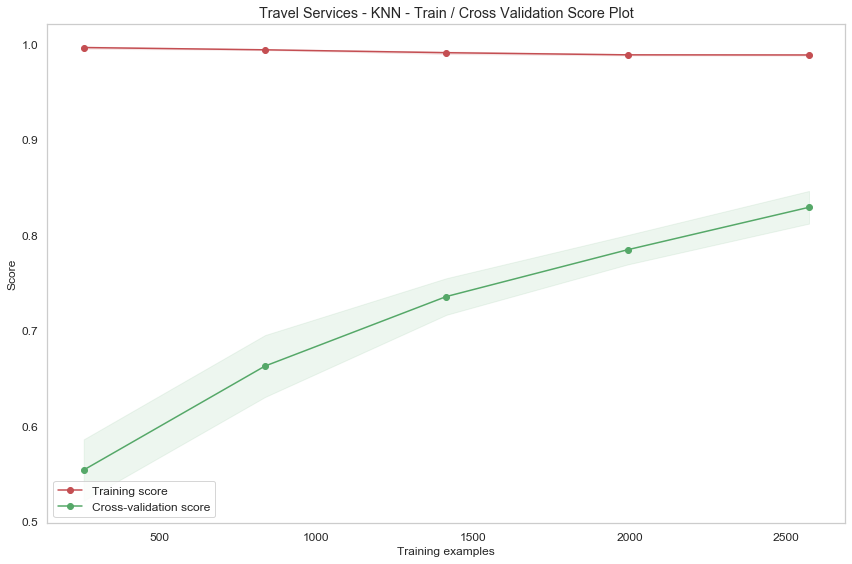

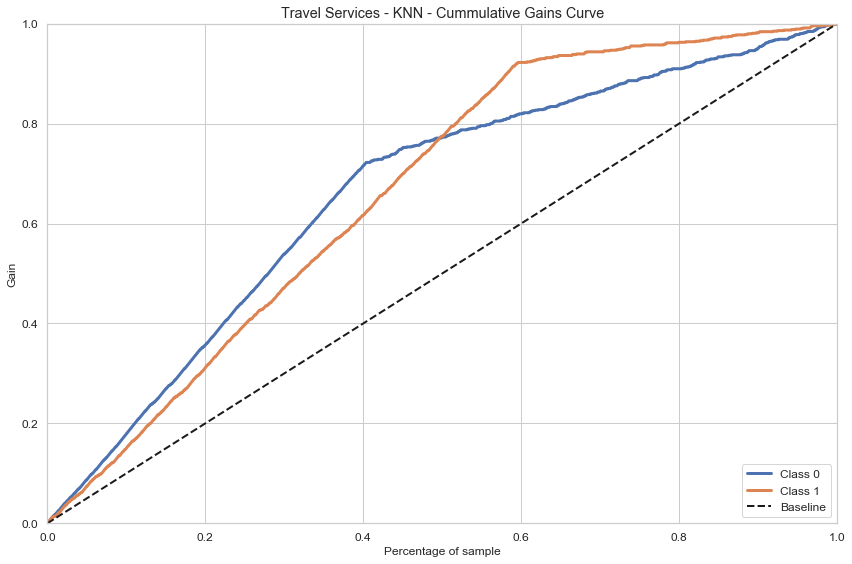

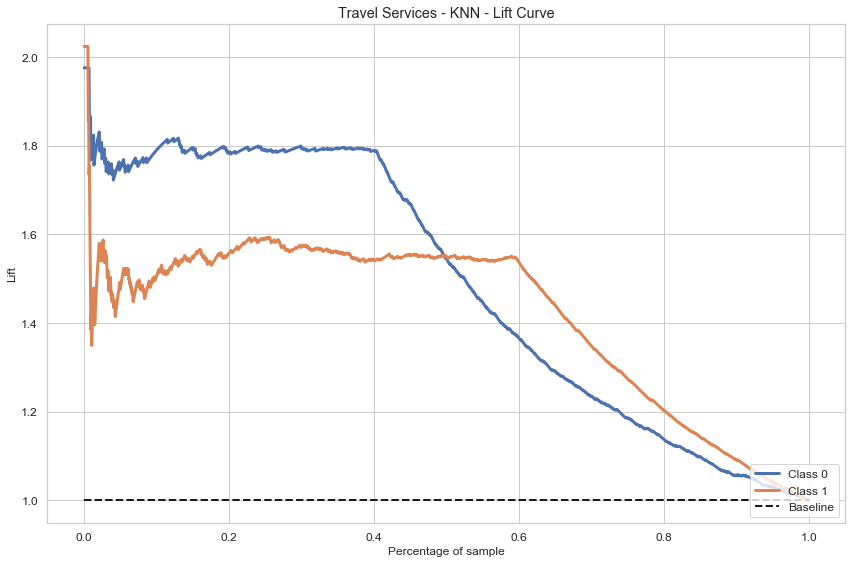

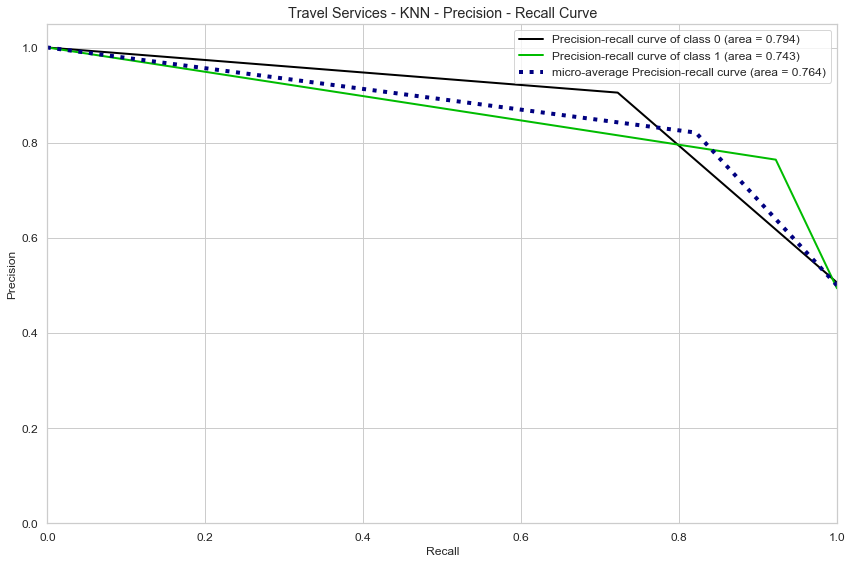

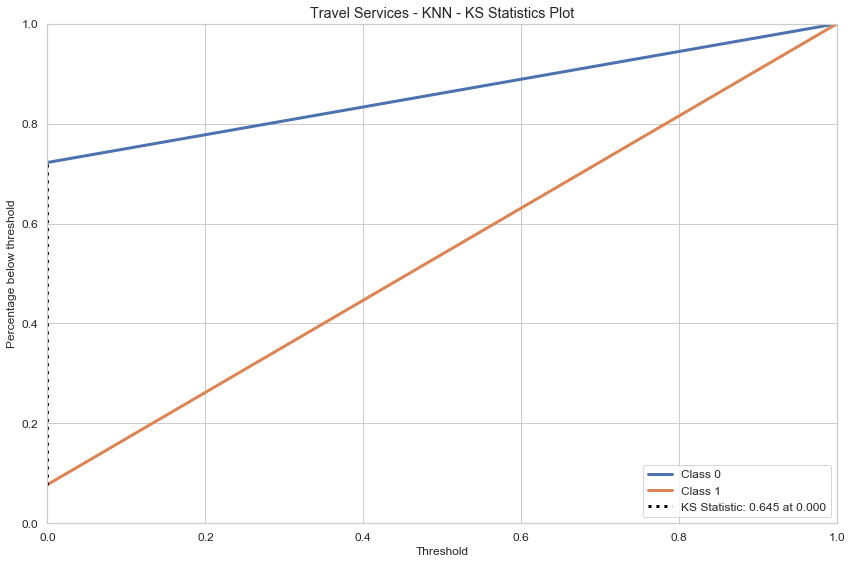

In [116]:
# Train / Cross Validation Score Plot
skplt.estimators.plot_learning_curve(knn, trainX, trainy, cv=num_folds, title=var_to_predict_title + ' - KNN - Train / Cross Validation Score Plot')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_knn_txcval')
plt.show()

# Cummulative Gain Plot
skplt.metrics.plot_cumulative_gain(testy,knn.predict_proba(testX), title=var_to_predict_title + ' - KNN - Cummulative Gains Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_knn_cgc')
plt.show()

# Lift Curve Plot
skplt.metrics.plot_lift_curve(testy,knn.predict_proba(testX), title=var_to_predict_title + ' - KNN - Lift Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_knn_liftc')
plt.show()

# Precision - Recall Curve
skplt.metrics.plot_precision_recall_curve(testy,knn.predict_proba(testX), title=var_to_predict_title + ' - KNN - Precision - Recall Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_knn_prerecc')
plt.show()

# KS statistics Plot
skplt.metrics.plot_ks_statistic(testy, knn.predict_proba(testX), title=var_to_predict_title+' - KNN - KS Statistics Plot')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_knn_ksst')
plt.show()

Confusion matrix - Travel Services, without normalization - KNN Classiffier
[[697 268]
 [ 73 869]]


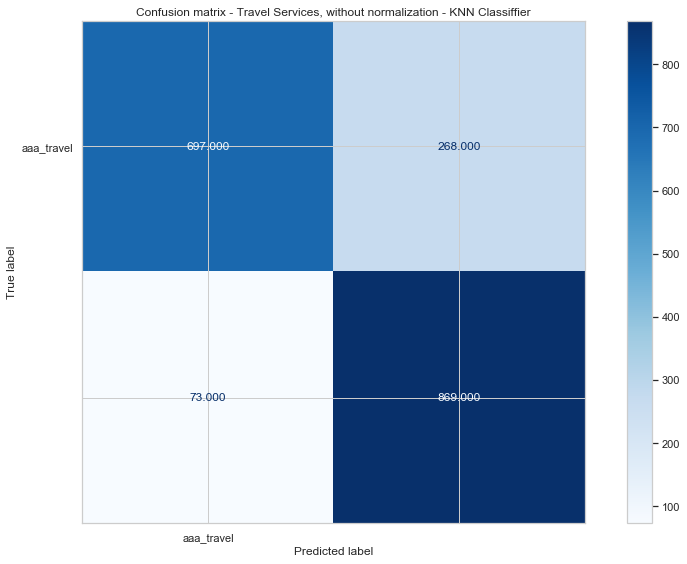

Normalized confusion matrix - Travel Services - KNN Classiffier
[[0.72 0.28]
 [0.08 0.92]]


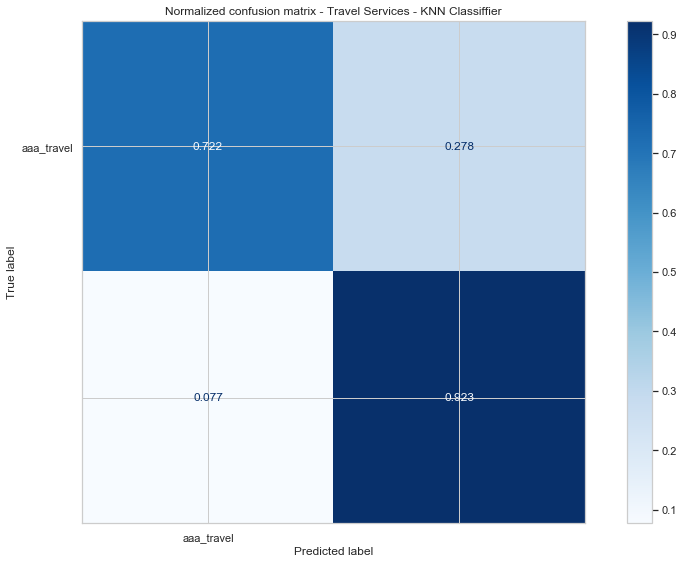

In [118]:
# Confusion Metrics
np.set_printoptions(precision=2)
i = 1
# Plot non-normalized confusion matrix
titles_options = [("Confusion matrix - "+var_to_predict_title+", without normalization - KNN Classiffier", None),
                  ("Normalized confusion matrix - "+var_to_predict_title+" - KNN Classiffier", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(knn, testX, testy,
                                 display_labels=testy,
                                 values_format='.3f',
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)
    if i==1: plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_knn_cm')
    else: plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_knn_cm_1')
    i +=1
    plt.show()

# CART  Model - DecisionTreeClassifier

In [120]:
# DecisionTreeClasifier
np.random.seed(42)

#create a dictionary of all values we want to test
param_grid = { 'criterion':['gini','entropy'],'max_depth': np.arange(40, 65,1)
             }

# decision tree model
cart = DecisionTreeClassifier()

#use gridsearch to test all values
cart_gscv = GridSearchCV(cart, param_grid, cv=num_folds)

#fit model to data
cart_gscv.fit(trainX, trainy)
print('Best parameters : ', cart_gscv.best_params_)
print('Best Score      : ', cart_gscv.best_score_)

Best parameters :  {'criterion': 'entropy', 'max_depth': 64}
Best Score      :  0.8338621028094713


# Observation

Based on the grid search above, the best parameter for the Decission Tree Classifier is:
* Narrowing the parameters
    * Best parameters :  {'criterion': 'entropy', 'max_depth': 64}
    * Best Score      :  0.8338621028094713

CART - Accuracy on training set: 0.992
CART - Accuracy on test set: 0.815
CART - Precision                  : 0.748
CART - Recall                     : 0.945
CART - F-measure                  : 0.835
CART - Log-Loss                   : 6.375
CART - Cross Entropy Loss         : 0.314
CART - No Skill - ROC AUC         : 0.500
CART - ROC AUC                    : 0.822
CART - Cross Validation Accuracy  : 0.746 (+/- 0.045)


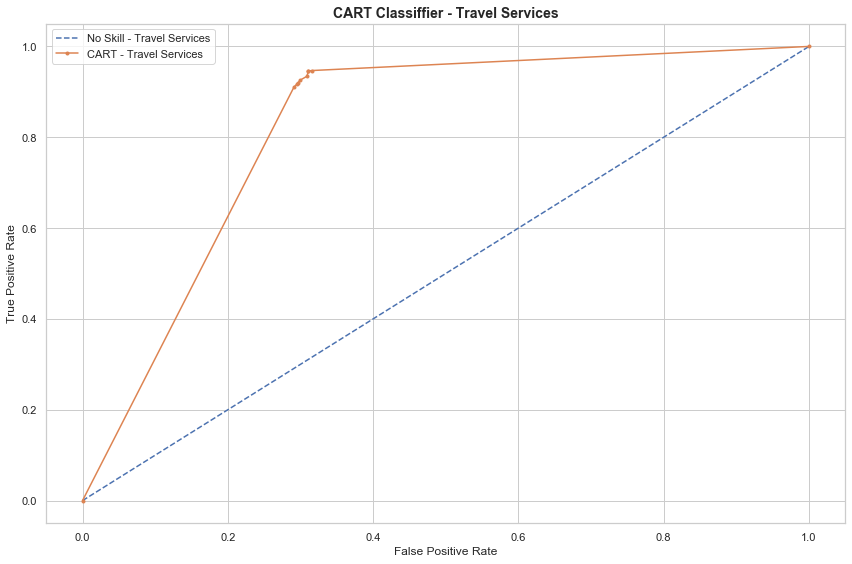

In [121]:
# Modeling based on the outcome of the grid serach
cart = DecisionTreeClassifier(criterion = 'entropy', max_depth=64)
cart.fit(trainX, trainy)

# Predict on test set
yhat = cart.predict(testX)

# Generate a no skill prediction for ROC Curve
ns_probs = [0 for _ in range(len(testy))]

# Predict probabilities
cart_probs = cart.predict_proba(testX)

# Keep probabilities for the positive outcome only
cart_probs = cart_probs[:, 1]

# Calculate scores
ns_auc = roc_auc_score(testy, ns_probs)
cart_auc = roc_auc_score(testy, cart_probs)

# Calculate Cross valdation scores
cart_scores = cross_val_score(cart, testX, testy, cv=num_folds)

print("CART - Accuracy on training set: {:.3f}".format(cart.score(trainX, trainy)))
print("CART - Accuracy on test set: {:.3f}".format(cart.score(testX, testy)))

# Evaluate predictions
print('CART - Precision                  : %.3f' % precision_score(testy, yhat))
print('CART - Recall                     : %.3f' % recall_score(testy, yhat))
print('CART - F-measure                  : %.3f' % f1_score(testy, yhat))
print('CART - Log-Loss                   : %.3f' % log_loss(testy, yhat))
print('CART - Cross Entropy Loss         : %.3f' % cross_entropy(yhat, testy[var_to_predict[0]]))
print('CART - No Skill - ROC AUC         : %.3f' % (ns_auc))
print('CART - ROC AUC                    : %.3f' % (cart_auc))
print("CART - Cross Validation Accuracy  : %0.3f (+/- %0.3f)" % (cart_scores.mean(), cart_scores.std() * 2))

# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(testy, ns_probs)
cart_fpr, cart_tpr, _ = roc_curve(testy, cart_probs)
# plot the roc curve for the model
plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill - '+var_to_predict_title)
plt.plot(cart_fpr, cart_tpr, marker='.', label='CART - '+var_to_predict_title)
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.legend()
plt.title('CART Classiffier - '+var_to_predict_title,loc='center', fontdict={'fontsize':14, 'fontweight':'bold'})
# show the plot
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_cart_roc')
# show the plot
plt.show()

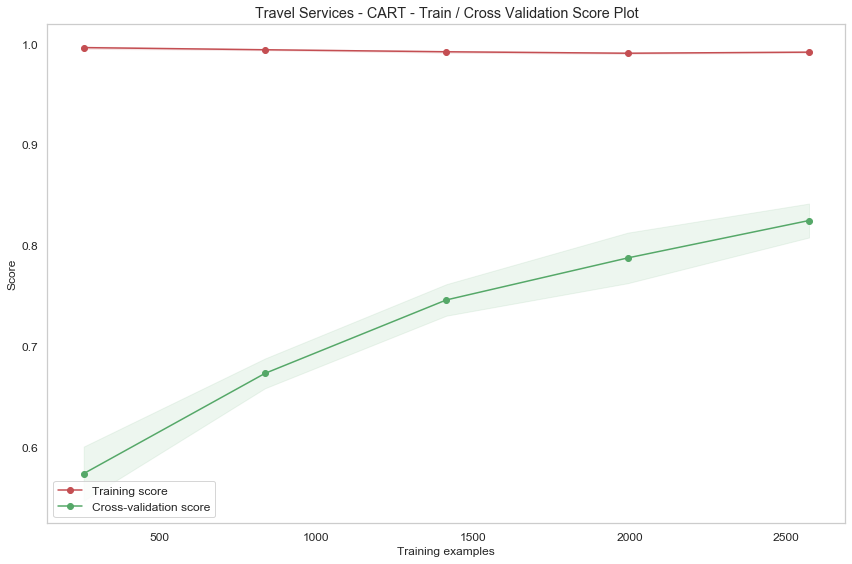

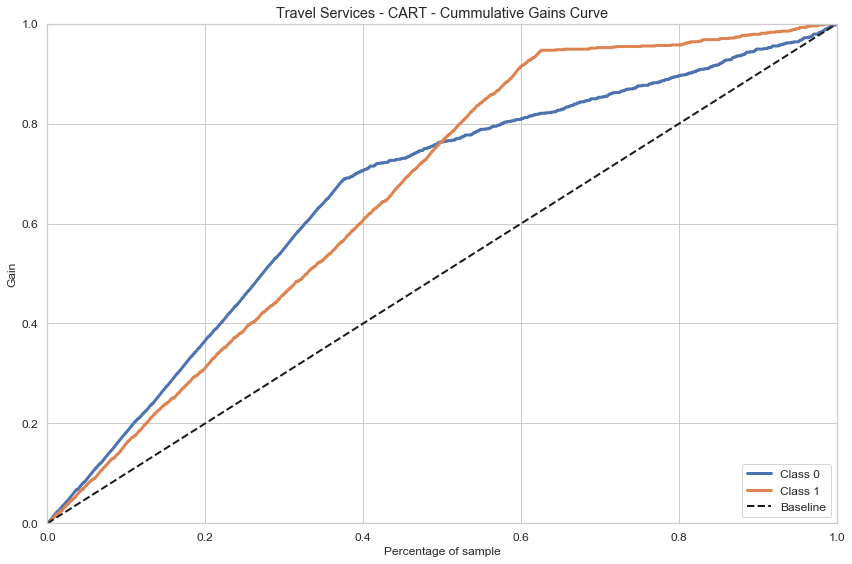

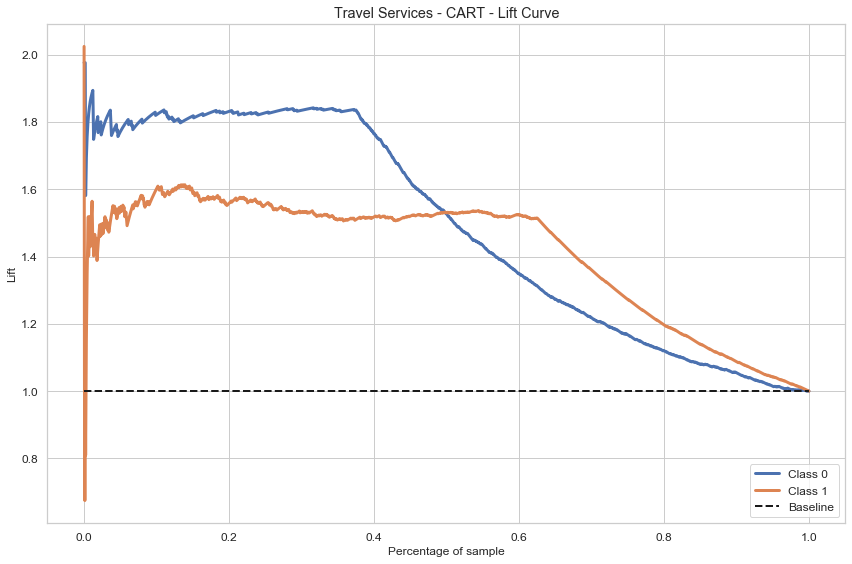

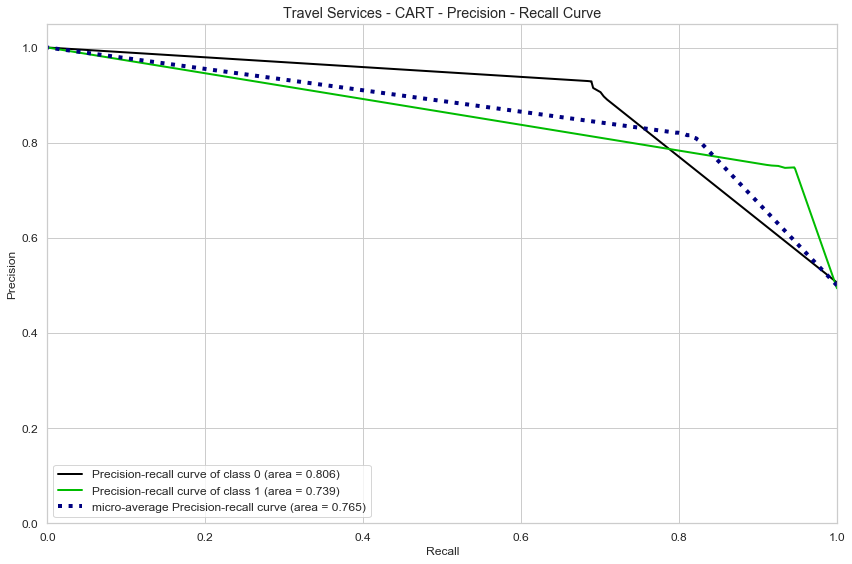

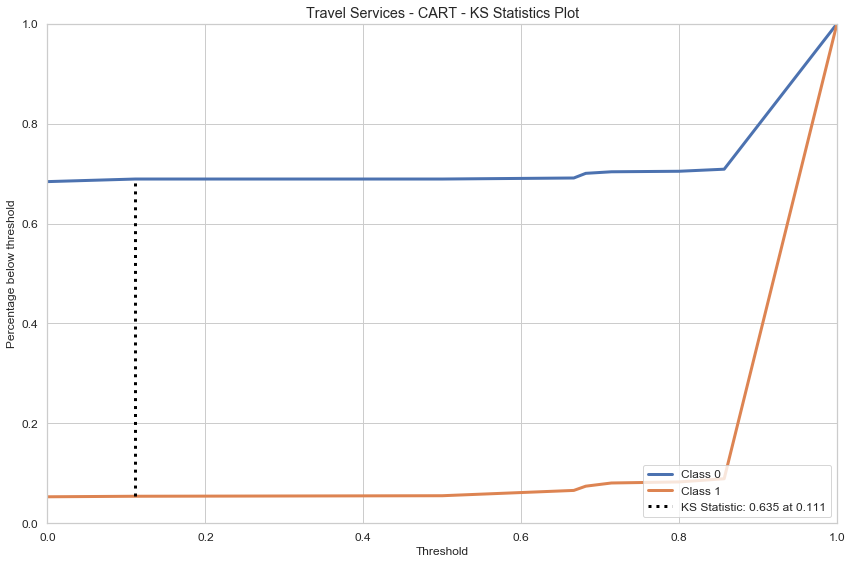

In [122]:
# Train / Cross Validation Score Plot
skplt.estimators.plot_learning_curve(cart, trainX, trainy, cv=num_folds, title=var_to_predict_title + ' - CART - Train / Cross Validation Score Plot')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_cart_txcval')
plt.show()

# Cummulative Gain Plot
skplt.metrics.plot_cumulative_gain(testy,cart.predict_proba(testX), title=var_to_predict_title + ' - CART - Cummulative Gains Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_cart_cgc')
plt.show()

# Lift Curve Plot
skplt.metrics.plot_lift_curve(testy,cart.predict_proba(testX), title=var_to_predict_title + ' - CART - Lift Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_cart_liftc')
plt.show()

# Precision - Recall Curve
skplt.metrics.plot_precision_recall_curve(testy,cart.predict_proba(testX), title=var_to_predict_title + ' - CART - Precision - Recall Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_cart_prerecc')
plt.show()

# KS statistics Plot
skplt.metrics.plot_ks_statistic(testy, cart.predict_proba(testX), title=var_to_predict_title+' - CART - KS Statistics Plot')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_cart_ksst')
plt.show()

Confusion matrix - Travel Services, without normalization - CART
[[665 300]
 [ 52 890]]


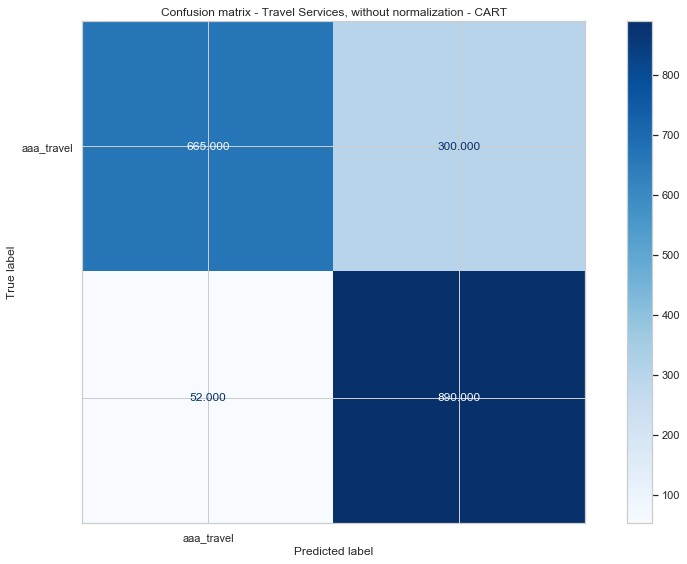

CART - Normalized confusion matrix - Travel Services
[[0.69 0.31]
 [0.06 0.94]]


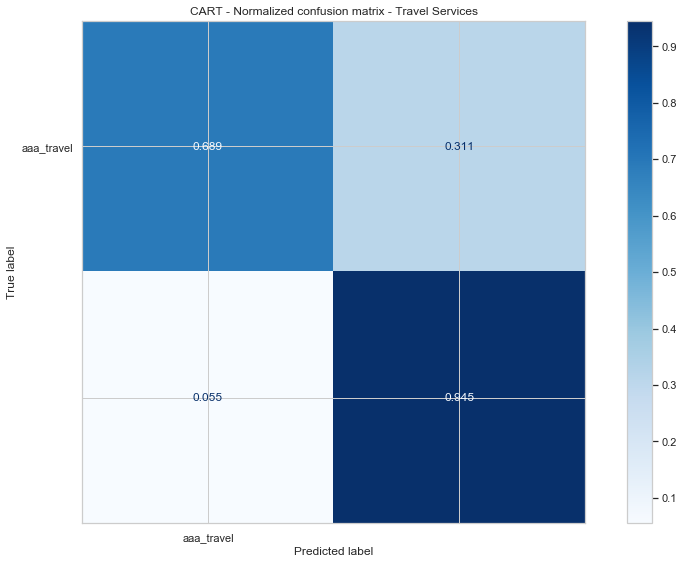

In [123]:
# Confusion Metrics
np.set_printoptions(precision=2)

i = 1
# Plot non-normalized confusion matrix
titles_options = [("Confusion matrix - "+var_to_predict_title+", without normalization - CART", None),
                  ("CART - Normalized confusion matrix - "+var_to_predict_title, 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(cart, testX, testy,
                                 display_labels=testy,
                                 values_format='.3f',
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

    if i==1: plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_cart_cm')
    else: plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_cart_cm_1')
    i +=1
    plt.show()

# Feature importance in trees
feature importance rates how important each feature is for the decision a tree makes. It is a number between 0 and 1 for each feature, where 0 means “not used at all” and 1 means “perfectly predicts the target.” The feature importances always sum to 1:

In [124]:
coef_df_cart = pd.DataFrame({'feature':testX.columns, 'coefs': cart.feature_importances_})
coef_df_cart["abs_coeff"] = coef_df_cart['coefs'].abs()
coef_df_cart.sort_values("abs_coeff",ascending=False,inplace=True)
coef_df_cart.nlargest(30,columns=["abs_coeff"])
counts_cart = pd.DataFrame(coef_df_cart.nlargest(30,columns=["abs_coeff"]), index=None)
counts_cart.rename(columns={"feature": "Features (MinMax Transformer)", 'coefs':'Coefficients', 'abs_coeff': "ABS of Coeffs."}, inplace=True)
fig = ff.create_table(counts_cart, height_constant=30, index=False)
fig.write_image('./model_pics/Travel/'+var_to_predict_save+'_cart_coef.png')
py.iplot(fig)

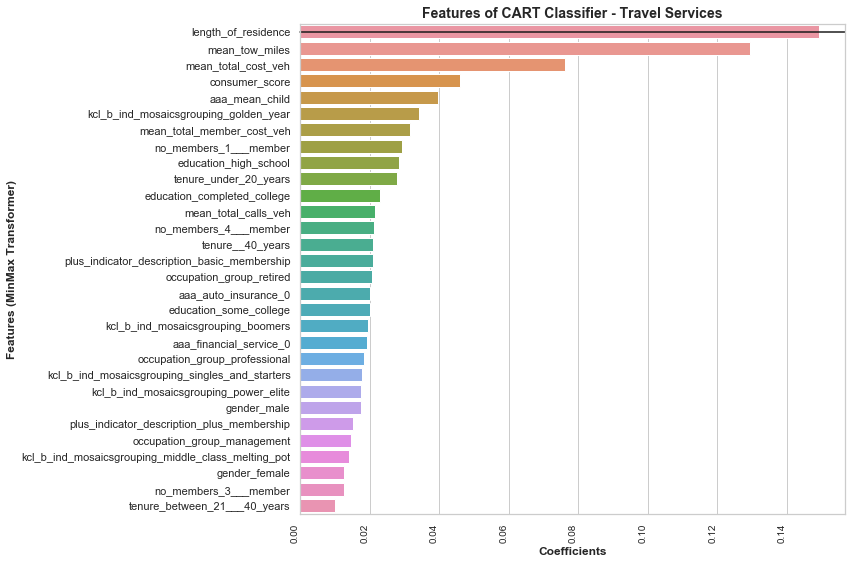

In [125]:
# Bar graph of Coefficients
sns.set(style="whitegrid")
plt.axhline(0, color="k", clip_on=False)
plt.ylabel("Coefs",fontsize=12, fontweight='bold')
plt.xlabel("Features", fontsize=12, fontweight='bold')
plt.title('Features of CART Classifier - '+var_to_predict_title,loc='center', fontdict={'fontsize':14, 'fontweight':'bold'})
sns.barplot(y=counts_cart['Features (MinMax Transformer)'], x=counts_cart['Coefficients'], orient='h')
plt.xticks(
    rotation=90, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='small')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_cart_coef_1')
plt.show()

# Random Forest Classifier Model

In [126]:
np.random.seed(42)
num_folds = 10
scoring = 'accuracy'
#create a dictionary of all values we want to test
param_grid = { 'criterion':['gini','entropy'],'max_depth': np.arange(2, 175, 15)}

# Random Forest Classifier model
rf = RandomForestClassifier()

#use gridsearch to test all values
rf_gscv = GridSearchCV(rf, param_grid, cv=num_folds, scoring=scoring)

#fit model to data
rf_gscv.fit(trainX, trainy)
print('Best parameters : ', rf_gscv.best_params_)
print('Best score      : ', rf_gscv.best_score_)

Best parameters :  {'criterion': 'gini', 'max_depth': 137}
Best score      :  0.8964666912035334


# Observation
Based on the grid search above, th best parameter for the Random Forest Classifier is:
* Narrowing the search around the best parameter of the 1st search
    * Best parameters :  {'criterion': 'gini', 'max_depth': 137}
    * Best score      :  0.8964666912035334

Random Forest - Accuracy on training set   : 0.992
Random Forest - Accuracy on test set       : 0.834
Random Forest - Precision                  : 0.770
Random Forest - Recall                     : 0.948
Random Forest - F-measure                  : 0.850
Random Forest - Log-Loss                   : 5.723
Random Forest - Cross Entropy Loss         : 0.296
Random Forest - No Skill - ROC AUC         : 0.500
Random Forest - ROC AUC                    : 0.843
Random Forest - Cross Validation Accuracy  : 0.759 (+/- 0.055)


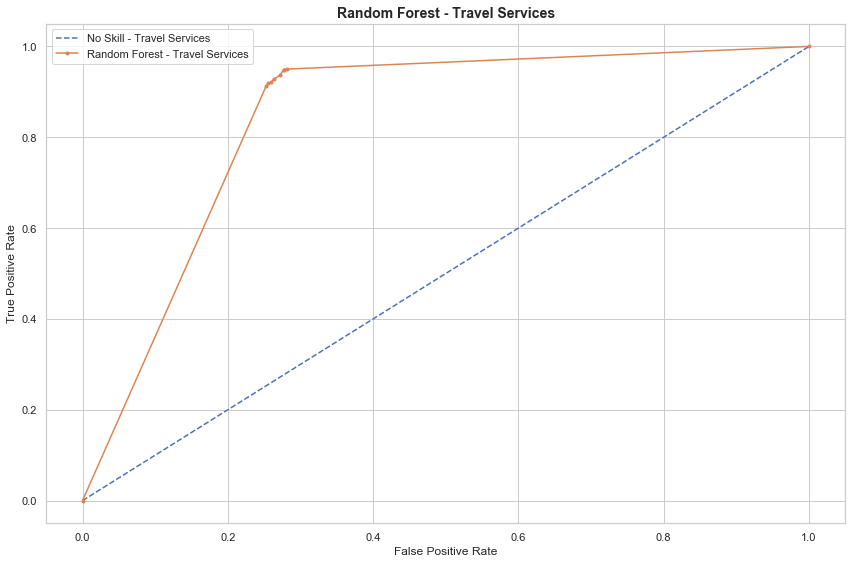

In [127]:
# Modeling based on the outcome of the grid serach of the random forest
rf = DecisionTreeClassifier(criterion = 'gini', max_depth=137, max_features='auto')
rf.fit(trainX, trainy)

# Predict on test set
yhat = rf.predict(testX)

# Generate a no skill prediction for ROC Curve
ns_probs = [0 for _ in range(len(testy))]

# Predict probabilities
rf_probs = rf.predict_proba(testX)

# Keep probabilities for the positive outcome only
rf_probs = rf_probs[:, 1]

# Calculate scores
ns_auc = roc_auc_score(testy, ns_probs)
rf_auc = roc_auc_score(testy, rf_probs)

# Calculate Cross valdation scores
rf_scores = cross_val_score(rf, testX, testy, cv=num_folds)

print("Random Forest - Accuracy on training set   : {:.3f}".format(rf.score(trainX, trainy)))
print("Random Forest - Accuracy on test set       : {:.3f}".format(rf.score(testX, testy)))

# Evaluate predictions
#print('Accuracy                   : %.3f' % accuracy_score(testy, yhat))
print('Random Forest - Precision                  : %.3f' % precision_score(testy, yhat))
print('Random Forest - Recall                     : %.3f' % recall_score(testy, yhat))
print('Random Forest - F-measure                  : %.3f' % f1_score(testy, yhat))
print('Random Forest - Log-Loss                   : %.3f' % log_loss(testy, yhat))
print('Random Forest - Cross Entropy Loss         : %.3f' % cross_entropy(yhat, testy[var_to_predict[0]]))
print('Random Forest - No Skill - ROC AUC         : %.3f' % (ns_auc))
print('Random Forest - ROC AUC                    : %.3f' % (rf_auc))
print("Random Forest - Cross Validation Accuracy  : %0.3f (+/- %0.3f)" % (rf_scores.mean(), rf_scores.std() * 2))

# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(testy, ns_probs)
rf_fpr, rf_tpr, _ = roc_curve(testy, rf_probs)
# plot the roc curve for the model
plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill - '+var_to_predict_title)
plt.plot(rf_fpr, rf_tpr, marker='.', label='Random Forest - '+var_to_predict_title)
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.legend()
plt.title('Random Forest - '+var_to_predict_title,loc='center', fontdict={'fontsize':14, 'fontweight':'bold'})
# show the plot
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_rf_roc')
plt.show()

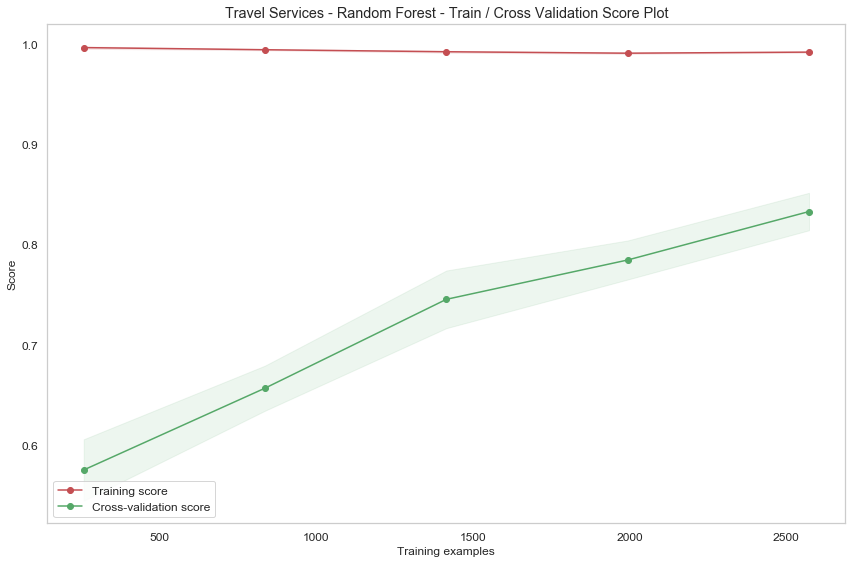

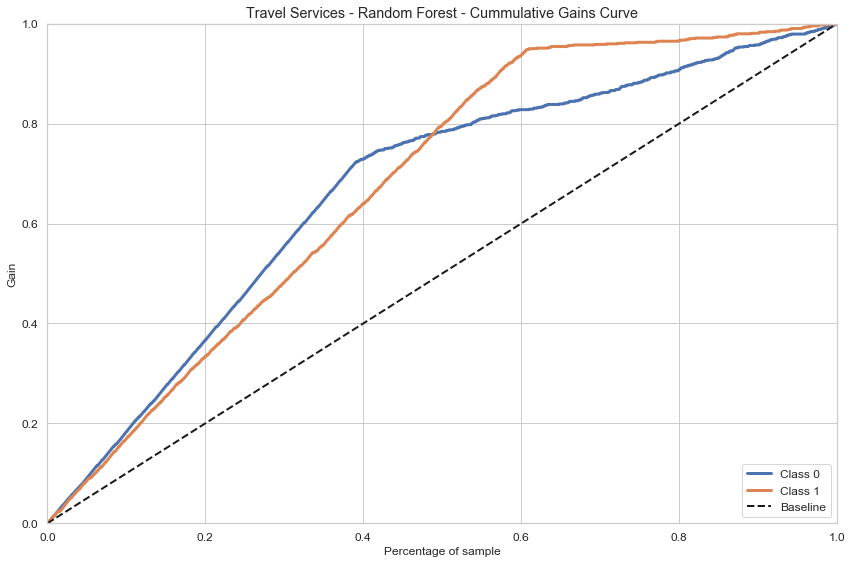

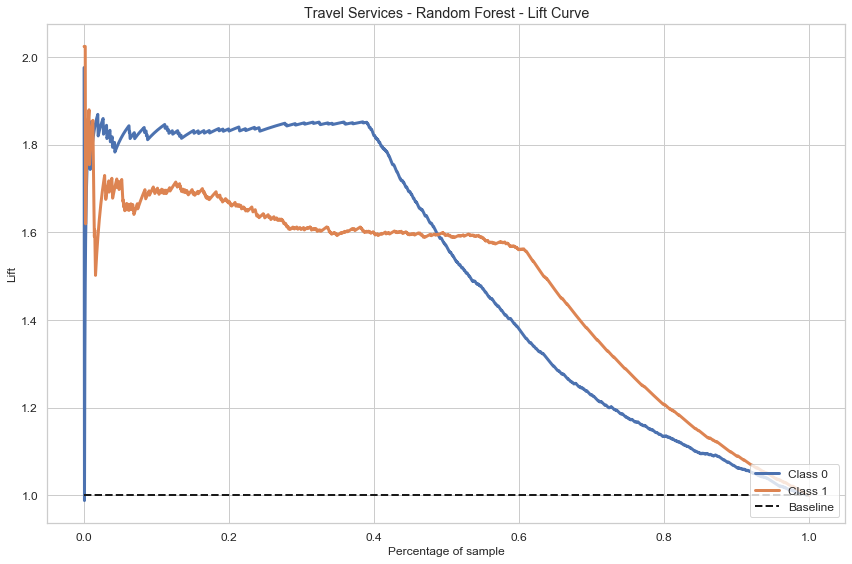

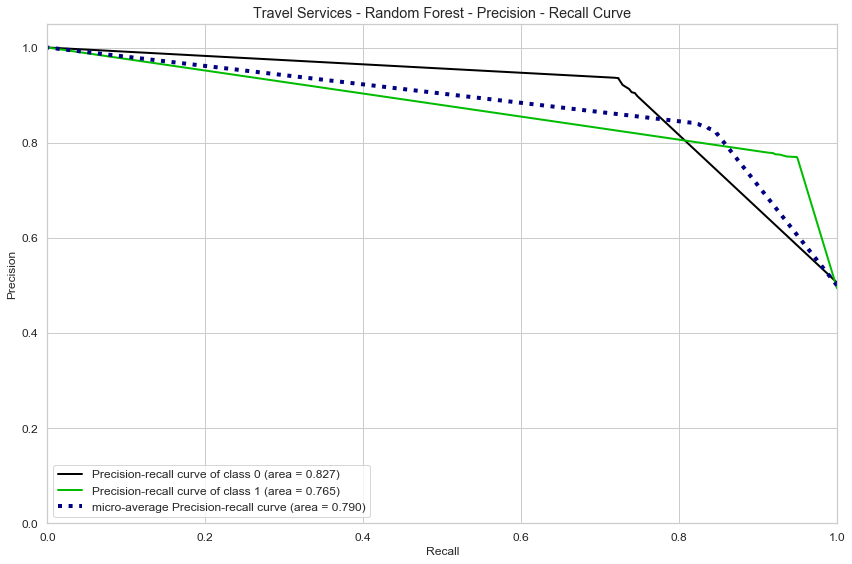

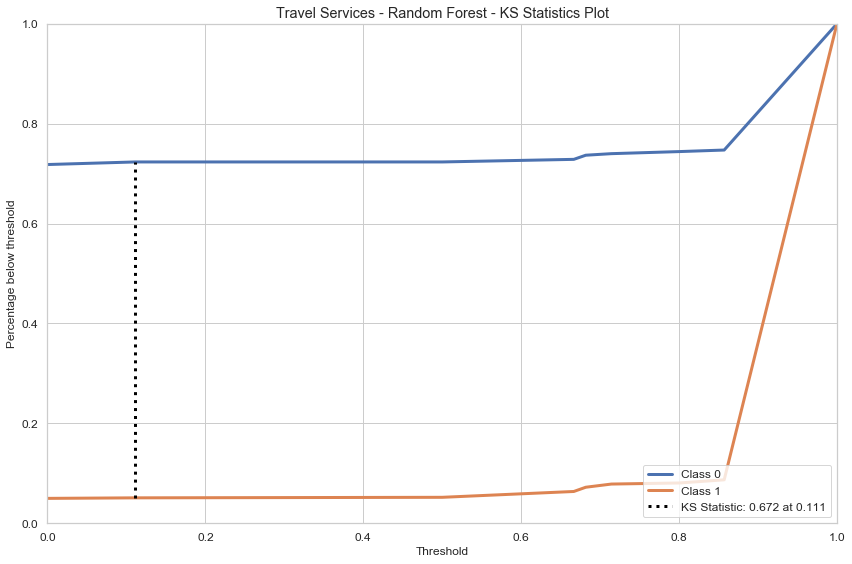

In [128]:
# Train / Cross Validation Score Plot
skplt.estimators.plot_learning_curve(rf, trainX, trainy, cv=num_folds, title=var_to_predict_title + ' - Random Forest - Train / Cross Validation Score Plot')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_rf_txcval')
plt.show()

# Cummulative Gain Plot
skplt.metrics.plot_cumulative_gain(testy,rf.predict_proba(testX), title=var_to_predict_title + ' - Random Forest - Cummulative Gains Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_rf_cgc')
plt.show()

# Lift Curve Plot
skplt.metrics.plot_lift_curve(testy,rf.predict_proba(testX), title=var_to_predict_title + ' - Random Forest - Lift Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_rf_liftc')
plt.show()

# Precision - Recall Curve
skplt.metrics.plot_precision_recall_curve(testy,rf.predict_proba(testX), title=var_to_predict_title + ' - Random Forest - Precision - Recall Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_rf_prerecc')
plt.show()

# KS statistics Plot
skplt.metrics.plot_ks_statistic(testy, rf.predict_proba(testX), title=var_to_predict_title+' - Random Forest - KS Statistics Plot')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_rf_ksst')
plt.show()

Confusion matrix - Travel Services, without normalization - Random Forest
[[698 267]
 [ 49 893]]


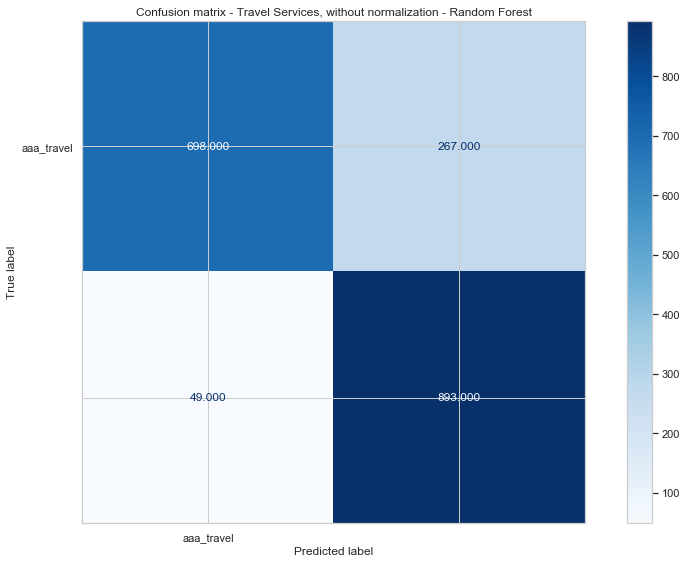

Normalized confusion matrix - Travel Services - Random Forest
[[0.72 0.28]
 [0.05 0.95]]


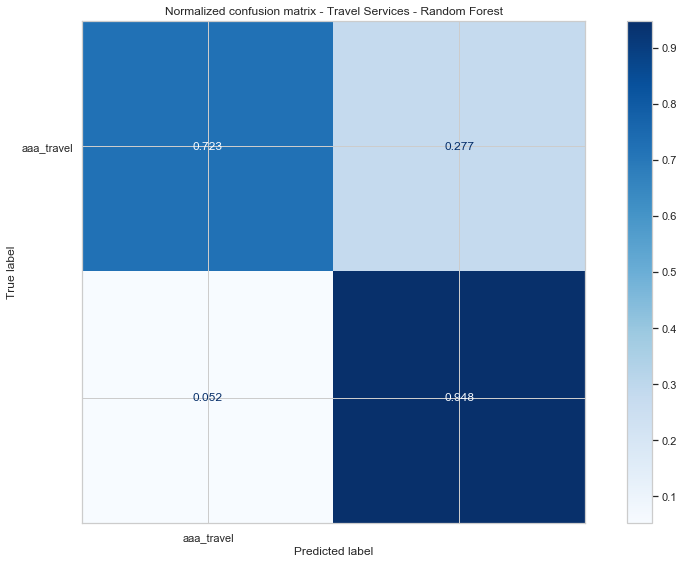

In [129]:
# Confusion Metrics
np.set_printoptions(precision=2)
i = 1 
# Plot non-normalized confusion matrix
titles_options = [("Confusion matrix - "+var_to_predict_title+ ", without normalization - Random Forest", None),
                  ("Normalized confusion matrix - "+var_to_predict_title+" - Random Forest", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(rf, testX, testy,
                                 display_labels=testy,
                                 values_format='.3f',
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)
    if i==1: plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_rf_cm')
    else: plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_rf_cm_1')
    i +=1
    plt.show()

# Feature importance
feature importance rates how important each feature is for the random forest tree makes. It is a number between 0 and 1 for each feature, where 0 means “not used at all” and 1 means “perfectly predicts the target.” The feature importances always sum to 1:

In [130]:
coef_df_rf = pd.DataFrame({'feature':testX.columns, 'coefs': rf.feature_importances_})
coef_df_rf["abs_coeff"] = coef_df_rf['coefs'].abs()
coef_df_rf.sort_values("abs_coeff",ascending=False,inplace=True)
coef_df_rf.nlargest(30,columns=["abs_coeff"])
counts_rf = pd.DataFrame(coef_df_rf.nlargest(30,columns=["abs_coeff"]), index=None)
counts_rf.rename(columns={"feature": "Features (MinMax Transformer)", 'coefs':'Coefficients', 'abs_coeff': "ABS of Coeffs."}, inplace=True)
fig = ff.create_table(counts_rf, height_constant=30, index=False)
fig.write_image('./model_pics/Travel/'+var_to_predict_save+'_rf_coef.png')
py.iplot(fig)

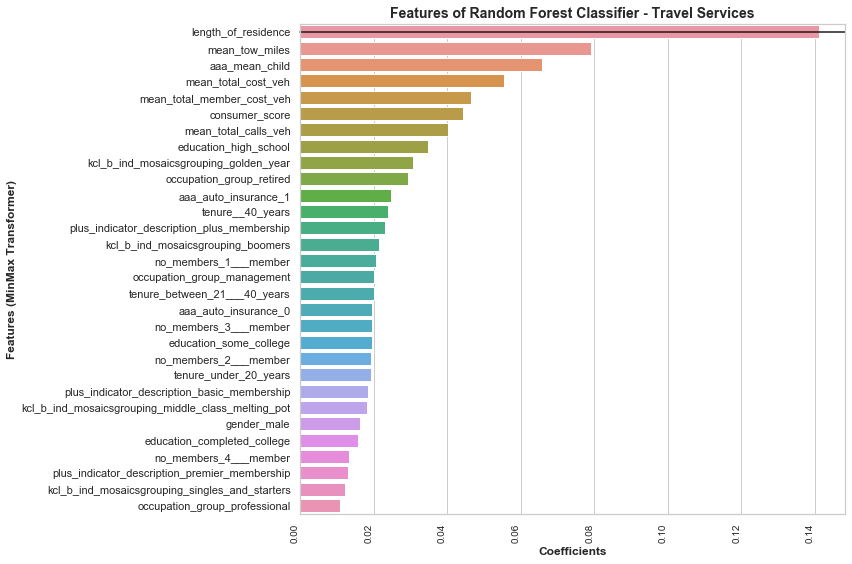

In [131]:
# Bar graph of Coefficients
sns.set(style="whitegrid")
plt.axhline(0, color="k", clip_on=False)
plt.ylabel("Coefs",fontsize=12, fontweight='bold')
plt.xlabel("Features", fontsize=12, fontweight='bold')
plt.title('Features of Random Forest Classifier - '+var_to_predict_title,loc='center', fontdict={'fontsize':14, 'fontweight':'bold'})
sns.barplot(y=counts_rf['Features (MinMax Transformer)'], x=counts_rf['Coefficients'], orient='h')
plt.xticks(
    rotation=90, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='small')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_rf_coef_1')
plt.show()

# ExtraTreesClassifier Classifier

In [132]:
np.random.seed(42)
#create a dictionary of all values we want to test
param_grid = { 'criterion':['gini','entropy'],'max_depth': np.arange(2, 200,15)}

# Random Forest Classifier model
et = ExtraTreesClassifier()

#use gridsearch to test all values
et_gscv = GridSearchCV(et, param_grid, cv=num_folds, scoring=scoring)

#fit model to data
et_gscv.fit(trainX, trainy)
print('Best parameters : ', et_gscv.best_params_)
print('Best score      : ', et_gscv.best_score_)

Best parameters :  {'criterion': 'gini', 'max_depth': 92}
Best score      :  0.9052153110047847


# Observation
Based on the grid search above, th best parameter for the Random Forest Classifier is:
* Narrowing the search around the best parameter of the 1st search
    * Best parameters :  {'criterion': 'gini', 'max_depth': 92}
    * Best score      :  0.9052153110047847

Extra Tree Classifier - Accuracy on training set: 0.992
Extra Tree Classifier - Accuracy on test set: 0.915
Extra Tree Classifier - Precision                  : 0.903
Extra Tree Classifier - Recall                     : 0.928
Extra Tree Classifier - F-measure                  : 0.915
Extra Tree Classifier - Log-Loss                   : 2.934
Extra Tree Classifier - Cross Entropy Loss         : 0.411
Extra Tree Classifier - No Skill - ROC AUC         : 0.500
Extra Tree Classifier - ROC AUC                    : 0.961
Extra Tree Classifier - Cross Validation Accuracy  : 0.819 (+/- 0.061)


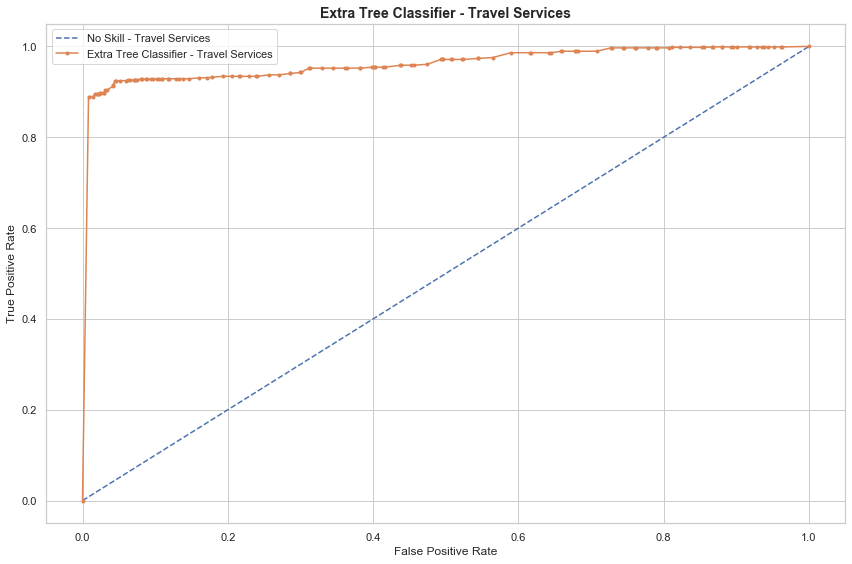

In [135]:
# Modeling based on the outcome of the grid serach of the random forest
et = ExtraTreesClassifier(criterion = 'gini', max_depth=92, n_estimators=120)
et.fit(trainX, trainy)

# Predict on test set
yhat = et.predict(testX)

# Generate a no skill prediction for ROC Curve
ns_probs = [0 for _ in range(len(testy))]

# Predict probabilities
et_probs = et.predict_proba(testX)

# Keep probabilities for the positive outcome only
et_probs = et_probs[:, 1]

# Calculate scores
ns_auc = roc_auc_score(testy, ns_probs)
et_auc = roc_auc_score(testy, et_probs)

# Calculate Cross valdation scores
scores_et = cross_val_score(et, testX, testy, cv=num_folds)

print("Extra Tree Classifier - Accuracy on training set: {:.3f}".format(et.score(trainX, trainy)))
print("Extra Tree Classifier - Accuracy on test set: {:.3f}".format(et.score(testX, testy)))

# Evaluate predictions
#print('Accuracy                   : %.3f' % accuracy_score(testy, yhat))
print('Extra Tree Classifier - Precision                  : %.3f' % precision_score(testy, yhat))
print('Extra Tree Classifier - Recall                     : %.3f' % recall_score(testy, yhat))
print('Extra Tree Classifier - F-measure                  : %.3f' % f1_score(testy, yhat))
print('Extra Tree Classifier - Log-Loss                   : %.3f' % log_loss(testy, yhat))
print('Extra Tree Classifier - Cross Entropy Loss         : %.3f' % cross_entropy(yhat, testy[var_to_predict[0]]))
print('Extra Tree Classifier - No Skill - ROC AUC         : %.3f' % (ns_auc))
print('Extra Tree Classifier - ROC AUC                    : %.3f' % (et_auc))
print("Extra Tree Classifier - Cross Validation Accuracy  : %0.3f (+/- %0.3f)" % (scores_et.mean(), scores_et.std() * 2))

# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(testy, ns_probs)
et_fpr, et_tpr, _ = roc_curve(testy, et_probs)
# plot the roc curve for the model
plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill - '+var_to_predict_title)
plt.plot(et_fpr, et_tpr, marker='.', label='Extra Tree Classifier - '+var_to_predict_title)
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.legend()
plt.title('Extra Tree Classifier - '+var_to_predict_title,loc='center', fontdict={'fontsize':14, 'fontweight':'bold'})
# show the plot
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_et_roc')
plt.show()

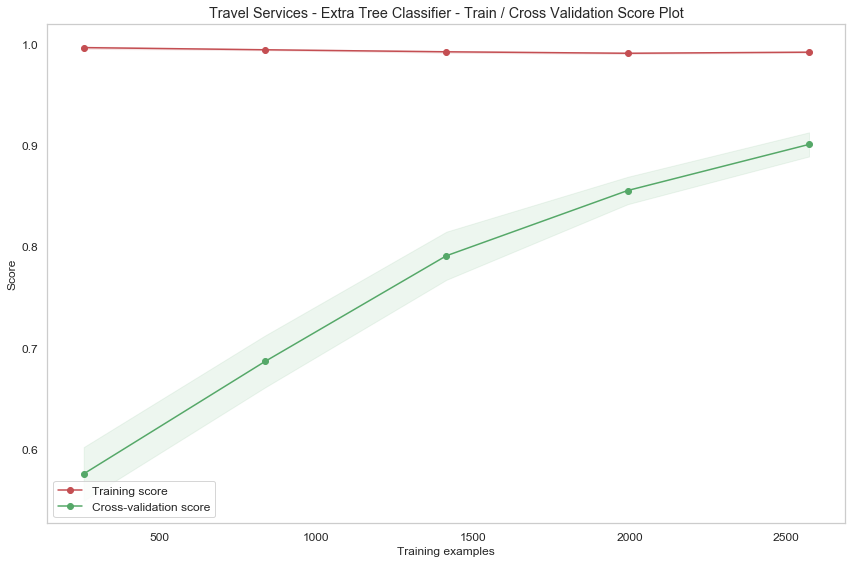

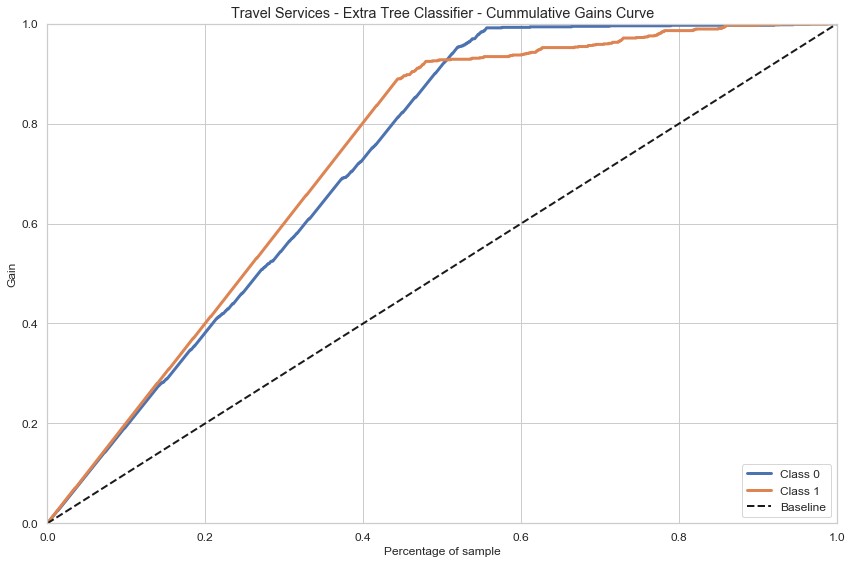

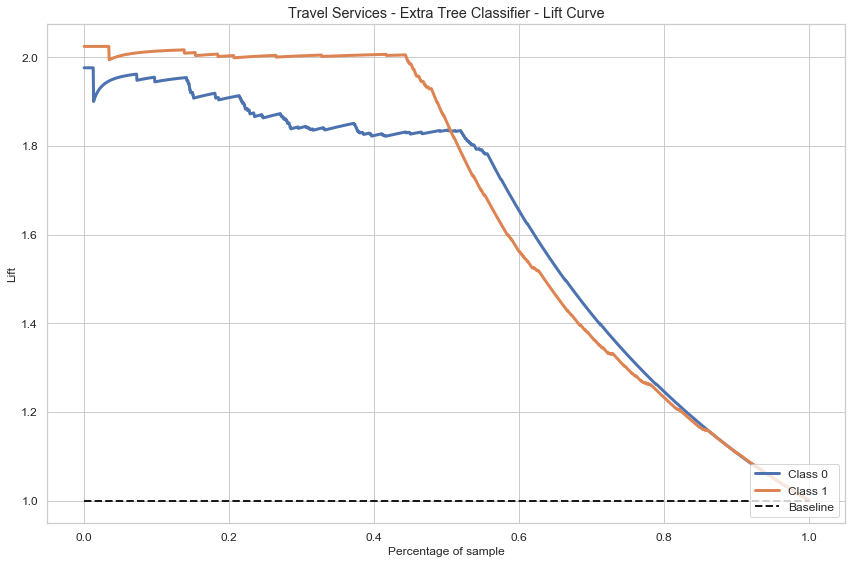

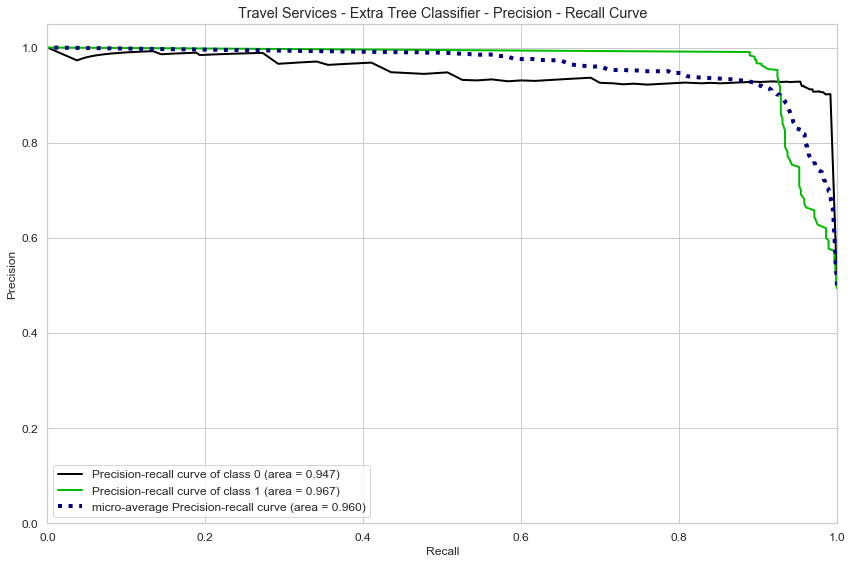

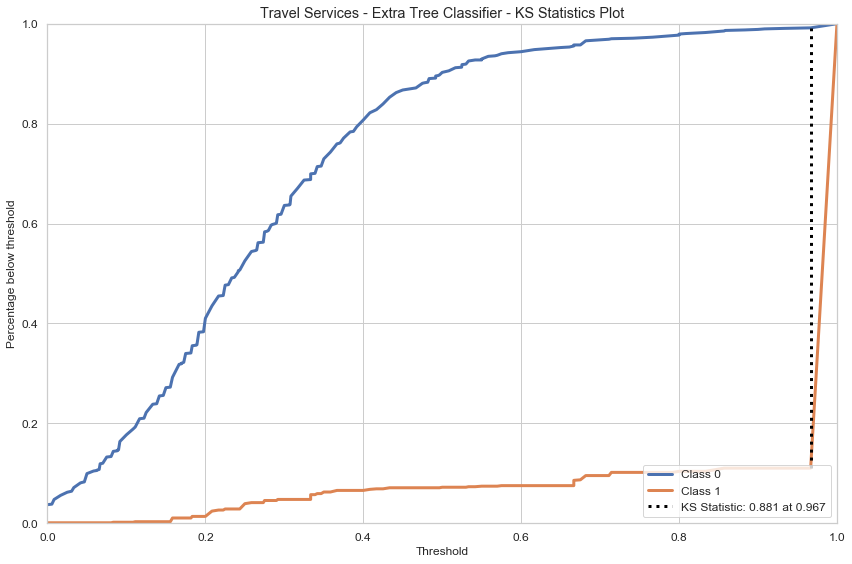

In [136]:
# Train / Cross Validation Score Plot
skplt.estimators.plot_learning_curve(et, trainX, trainy, cv=num_folds, title=var_to_predict_title + ' - Extra Tree Classifier - Train / Cross Validation Score Plot')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_et_txcval')
plt.show()

# Cummulative Gain Plot
skplt.metrics.plot_cumulative_gain(testy,et.predict_proba(testX), title=var_to_predict_title + ' - Extra Tree Classifier - Cummulative Gains Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_et_cgc')
plt.show()

# Lift Curve Plot
skplt.metrics.plot_lift_curve(testy,et.predict_proba(testX), title=var_to_predict_title + ' - Extra Tree Classifier - Lift Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_et_liftc')
plt.show()

# Precision - Recall Curve
skplt.metrics.plot_precision_recall_curve(testy,et.predict_proba(testX), title=var_to_predict_title + ' - Extra Tree Classifier - Precision - Recall Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_et_prerecc')
plt.show()

# KS statistics Plot
skplt.metrics.plot_ks_statistic(testy, et.predict_proba(testX), title=var_to_predict_title+' - Extra Tree Classifier - KS Statistics Plot')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_et_ksst')
plt.show()

Confusion matrix - Travel Services, without normalization - Extra Tree Classifier
[[871  94]
 [ 68 874]]


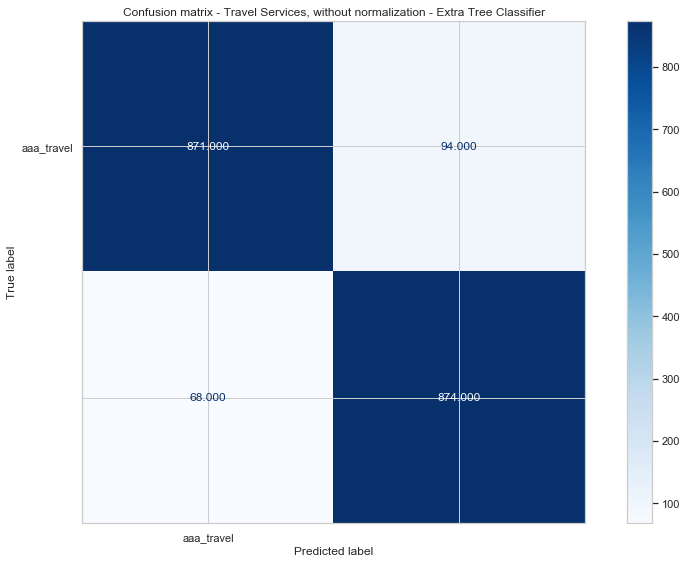

Extra Tree Classifier - Normalized confusion matrix - Travel Services
[[0.9  0.1 ]
 [0.07 0.93]]


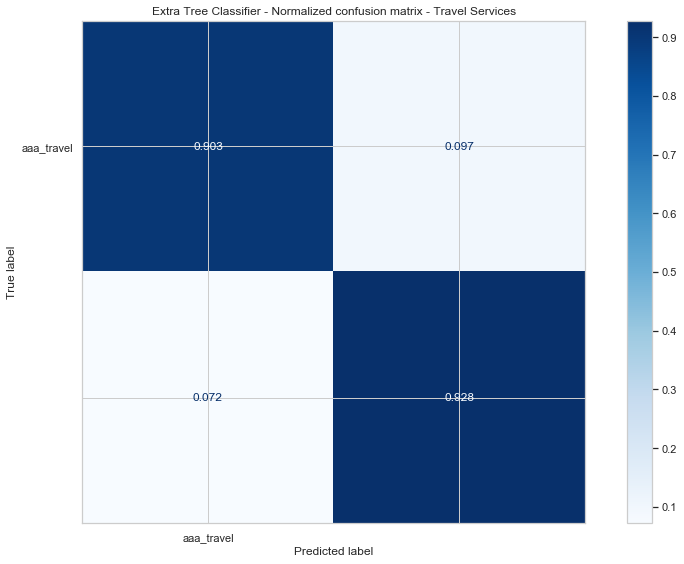

In [137]:
# Confusion Metrics
np.set_printoptions(precision=2)
i = 1
# Plot non-normalized confusion matrix
titles_options = [("Confusion matrix - "+var_to_predict_title+", without normalization - Extra Tree Classifier", None),
                  ("Extra Tree Classifier - Normalized confusion matrix - "+var_to_predict_title, 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(et, testX, testy,
                                 display_labels=testy,
                                 values_format='.3f',
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)
    if i==1: plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_et_cm')
    else: plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_et_cm_1')
    i +=1
    plt.show()

In [138]:
coef_df_et = pd.DataFrame({'feature':testX.columns, 'coefs': et.feature_importances_})
coef_df_et["abs_coeff"] = coef_df_et['coefs'].abs()
coef_df_et.sort_values("abs_coeff",ascending=False,inplace=True)
coef_df_et.nlargest(30,columns=["abs_coeff"])
counts_et = pd.DataFrame(coef_df_et.nlargest(30,columns=["abs_coeff"]), index=None)
counts_et.rename(columns={"feature": "Features (MinMax Transformer)", 'coefs':'Coefficients', 'abs_coeff': "ABS of Coeffs."}, inplace=True)
fig = ff.create_table(counts_et, height_constant=30, index=False)
fig.write_image('./model_pics/Travel/'+var_to_predict_save+'_et_coef.png')
py.iplot(fig)

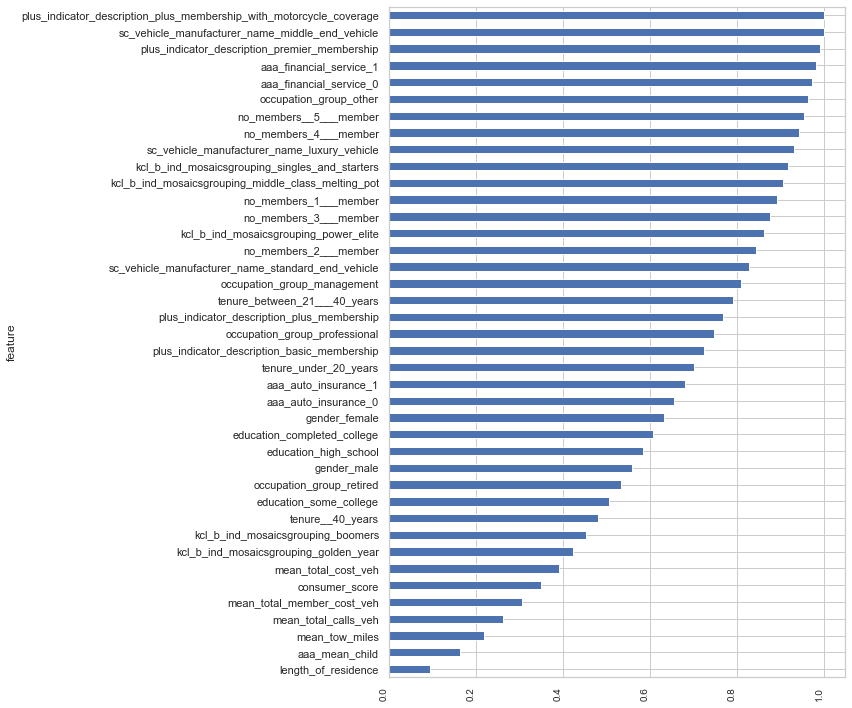

In [139]:
df_cumsum = coef_df_et.copy()
df_cumsum.set_index('feature', inplace=True)
df_cumsum.abs_coeff.cumsum().plot(kind='barh', figsize=(12,10))
plt.xticks(
            rotation=90, 
            horizontalalignment='right',
            fontweight='light',
            fontsize='small')
plt.show()

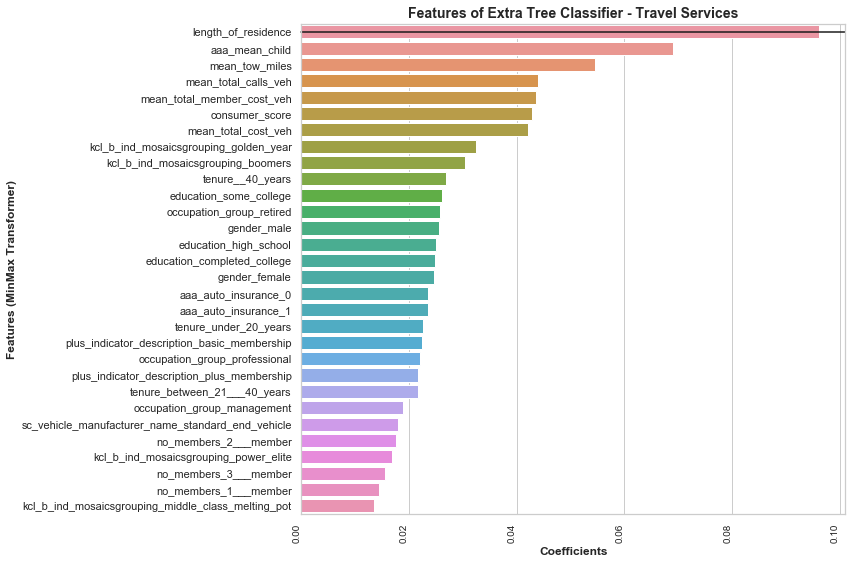

In [140]:
# Bar graph of Coefficients
sns.set(style="whitegrid")
plt.axhline(0, color="k", clip_on=False)
plt.ylabel("Coefs",fontsize=12, fontweight='bold')
plt.xlabel("Features", fontsize=12, fontweight='bold')
plt.title('Features of Extra Tree Classifier - '+var_to_predict_title,loc='center', fontdict={'fontsize':14, 'fontweight':'bold'})
sns.barplot(y=counts_et['Features (MinMax Transformer)'], x=counts_et['Coefficients'], orient='h')
plt.xticks(
    rotation=90, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='small')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_et_coef_1')
plt.show()

# XGBOOSTING Modeling

In [141]:
np.random.seed(42)
scoring = 'accuracy'

#create a dictionary of all values we want to test
param_grid = {'max_depth': [3,4,5,6,7], 'n_estimators': [100, 250, 500, 1000], 
              'learning_rate': [0.1, 0.01], 'gamma':[0, 0.1]
             }
# CV model
xgb = XGBClassifier(objective= 'binary:logistic',nthread=4)
kfold = KFold(n_splits=num_folds)
xgb_gscv = GridSearchCV(estimator=xgb,param_grid=param_grid, scoring = scoring, 
                        n_jobs = 10, cv = kfold,verbose=True
                       )
xgb_gscv.fit(trainX, trainy)
print('Best parameters - : ', xgb_gscv.best_params_)
print('Best score      : ', xgb_gscv.best_score_)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   40.1s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:  7.6min
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed: 20.8min
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed: 38.8min
[Parallel(n_jobs=10)]: Done 800 out of 800 | elapsed: 41.1min finished


Best parameters - :  {'gamma': 0, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 1000}
Best score      :  0.8611446448288553


# Observation
Best parameters - :  {'gamma': 0, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 1000}
Best score      :  0.8611446448288553

XGBoost Classifier - Accuracy on training set   : 0.986
XGBoost Classifier - Accuracy on test set       : 0.861
XGBoost Classifier - Precision                  : 0.827
XGBoost Classifier - Recall                     : 0.909
XGBoost Classifier - F-measure                  : 0.866
XGBoost Classifier - Log-Loss                   : 4.800
XGBoost Classifier - Cross Entropy Loss         : 0.519
XGBoost Classifier - No Skill - ROC AUC         : 0.500
XGBoost Classifier - ROC AUC                    : 0.937
XGBoost Classifier - Cross Validation Accuracy  : 0.769 (+/- 0.044)


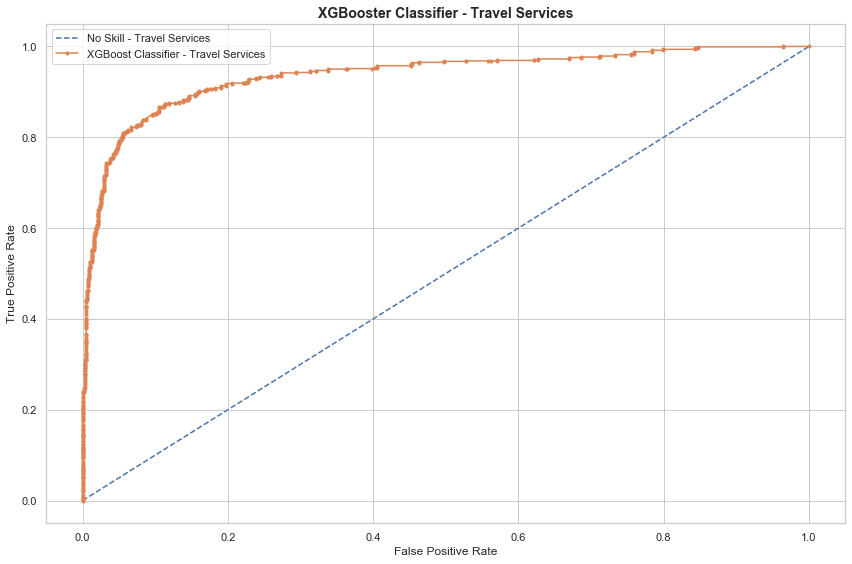

In [142]:
# Modeling based on the outcome of the grid serach of the random forest
xgb = xgb = XGBClassifier(objective= 'binary:logistic',nthread=4, gamma=0.1,
                          learning_rate=0.1, max_depth=7, n_estimators=1000                        
                         )
xgb.fit(trainX, trainy)

# Predict on test set
yhat = xgb.predict(testX)

# Generate a no skill prediction for ROC Curve
ns_probs = [0 for _ in range(len(testy))]

# Predict probabilities
xgb_probs = xgb.predict_proba(testX)

# Keep probabilities for the positive outcome only
xgb_probs = xgb_probs[:, 1]

# Calculate scores
ns_auc = roc_auc_score(testy, ns_probs)
xgb_auc = roc_auc_score(testy, xgb_probs)

# Calculate Cross valdation scores
scores_xgb = cross_val_score(xgb, testX, testy, cv=num_folds)

print("XGBoost Classifier - Accuracy on training set   : {:.3f}".format(xgb.score(trainX, trainy)))
print("XGBoost Classifier - Accuracy on test set       : {:.3f}".format(xgb.score(testX, testy)))

# Evaluate predictions
#print('Accuracy                   : %.3f' % accuracy_score(testy, yhat))
print('XGBoost Classifier - Precision                  : %.3f' % precision_score(testy, yhat))
print('XGBoost Classifier - Recall                     : %.3f' % recall_score(testy, yhat))
print('XGBoost Classifier - F-measure                  : %.3f' % f1_score(testy, yhat))
print('XGBoost Classifier - Log-Loss                   : %.3f' % log_loss(testy, yhat))
print('XGBoost Classifier - Cross Entropy Loss         : %.3f' % cross_entropy(yhat, testy[var_to_predict[0]]))
print('XGBoost Classifier - No Skill - ROC AUC         : %.3f' % (ns_auc))
print('XGBoost Classifier - ROC AUC                    : %.3f' % (xgb_auc))
print("XGBoost Classifier - Cross Validation Accuracy  : %0.3f (+/- %0.3f)" % (scores_xgb.mean(), scores_xgb.std() * 2))

# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(testy, ns_probs)
xgb_fpr, xgb_tpr, _ = roc_curve(testy, xgb_probs)
# plot the roc curve for the model
plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill - '+var_to_predict_title)
plt.plot(xgb_fpr, xgb_tpr, marker='.', label='XGBoost Classifier - '+var_to_predict_title)
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.legend()
plt.title('XGBooster Classifier - '+var_to_predict_title,loc='center', fontdict={'fontsize':14, 'fontweight':'bold'})
# show the plot
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_xgb_roc')
plt.show()

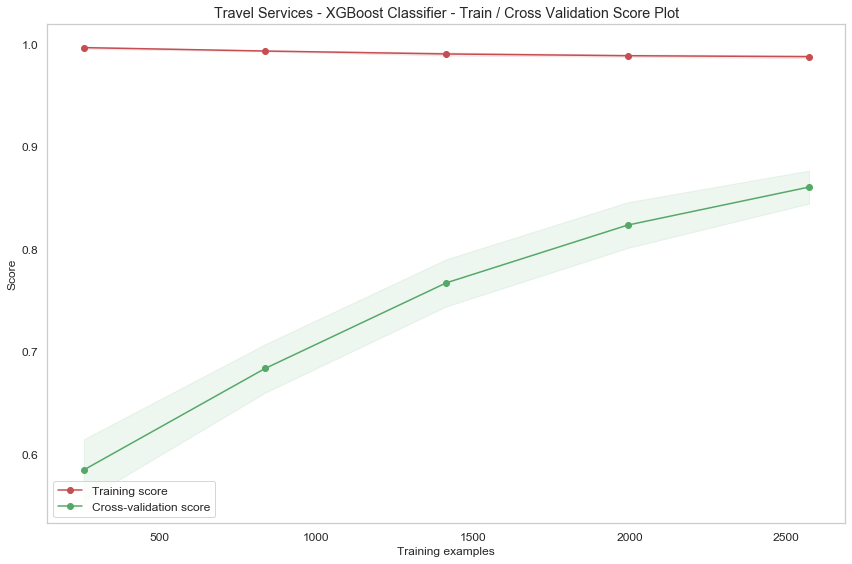

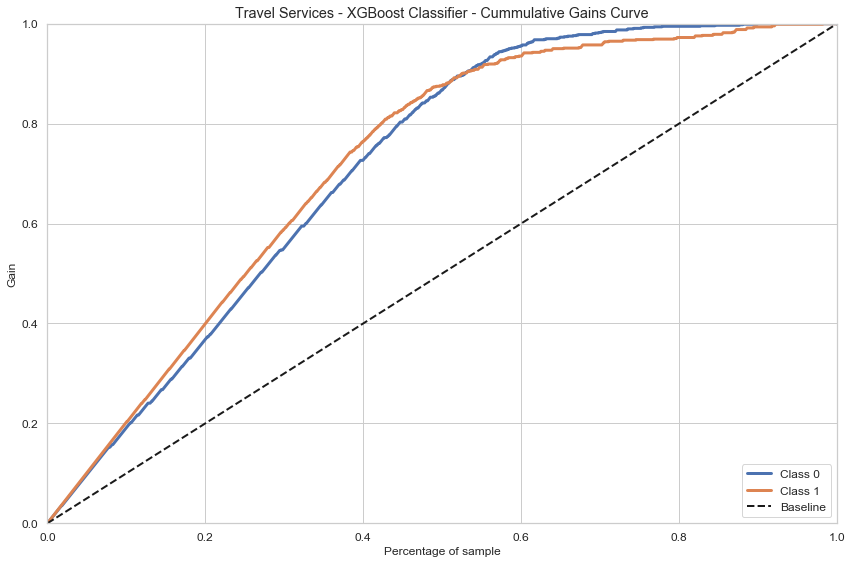

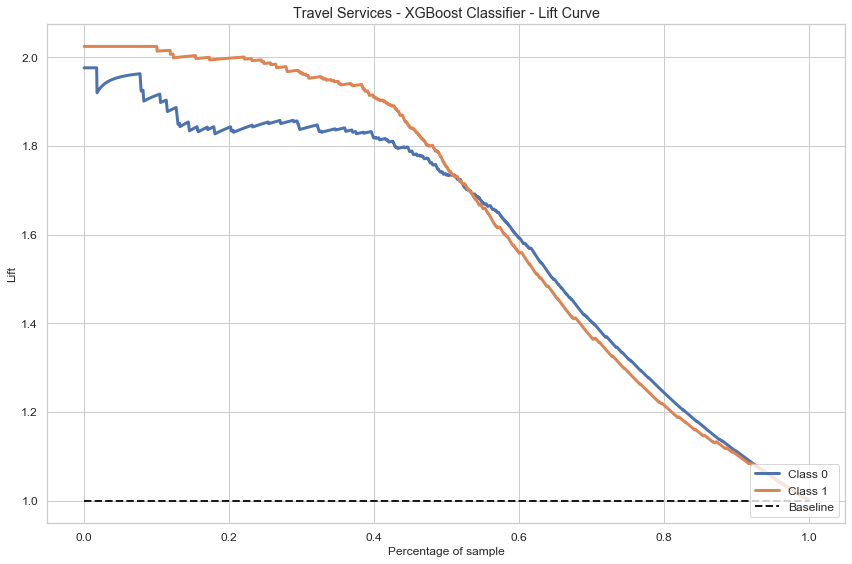

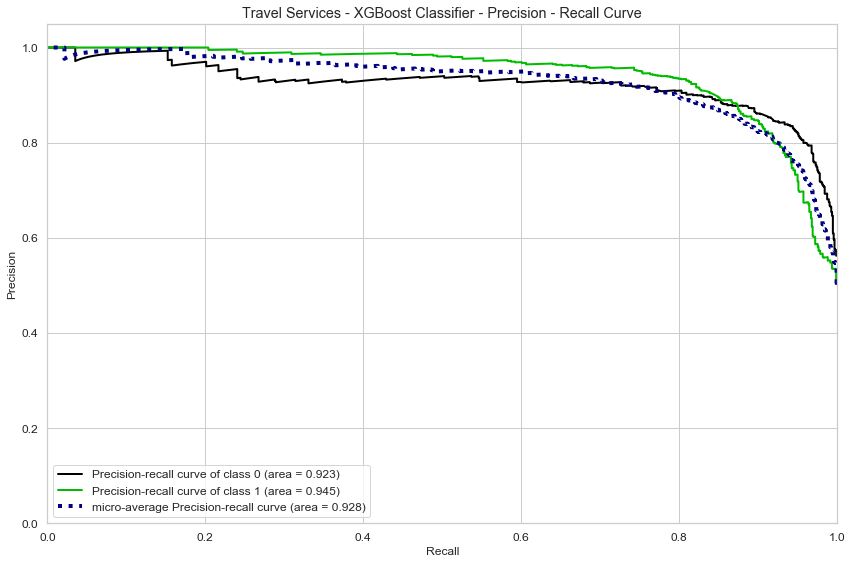

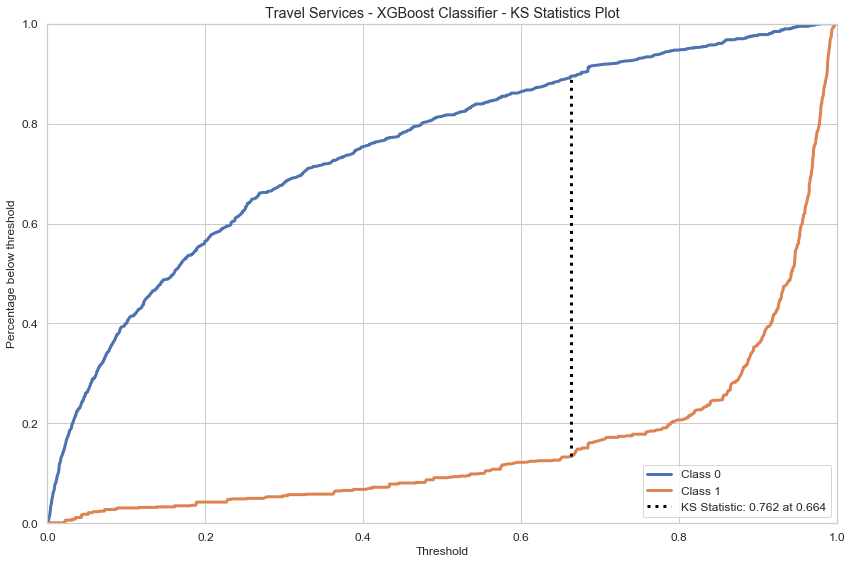

In [143]:
# Train / Cross Validation Score Plot
skplt.estimators.plot_learning_curve(xgb, trainX, trainy, cv=num_folds, title=var_to_predict_title + ' - XGBoost Classifier - Train / Cross Validation Score Plot')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_xgb_txcval')
plt.show()

# Cummulative Gain Plot
skplt.metrics.plot_cumulative_gain(testy,xgb.predict_proba(testX), title=var_to_predict_title + ' - XGBoost Classifier - Cummulative Gains Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_xgb_cgc')
plt.show()

# Lift Curve Plot
skplt.metrics.plot_lift_curve(testy,xgb.predict_proba(testX), title=var_to_predict_title + ' - XGBoost Classifier - Lift Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_xgb_liftc')
plt.show()

# Precision - Recall Curve
skplt.metrics.plot_precision_recall_curve(testy,xgb.predict_proba(testX), title=var_to_predict_title + ' - XGBoost Classifier - Precision - Recall Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_xgb_prerecc')
plt.show()

# KS statistics Plot
skplt.metrics.plot_ks_statistic(testy, xgb.predict_proba(testX), title=var_to_predict_title+' - XGBoost Classifier - KS Statistics Plot')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_xgb_ksst')
plt.show()

In [144]:
coef_df_xgb = pd.DataFrame({'feature':testX.columns, 'coefs': xgb.feature_importances_})
coef_df_xgb["abs_coeff"] = coef_df_xgb['coefs'].abs()
coef_df_xgb.sort_values("abs_coeff",ascending=False,inplace=True)
coef_df_xgb.nlargest(30,columns=["abs_coeff"])
counts_xgb = pd.DataFrame(coef_df_xgb.nlargest(30,columns=["abs_coeff"]), index=None)
counts_xgb.rename(columns={"feature": "Features (MinMax Transformer)", 'coefs':'Coefficients', 'abs_coeff': "ABS of Coeffs."}, inplace=True)
fig = ff.create_table(counts_xgb, height_constant=30, index=False)
fig.write_image('./model_pics/Travel/'+var_to_predict_save+'_xgb_coef.png')
py.iplot(fig)

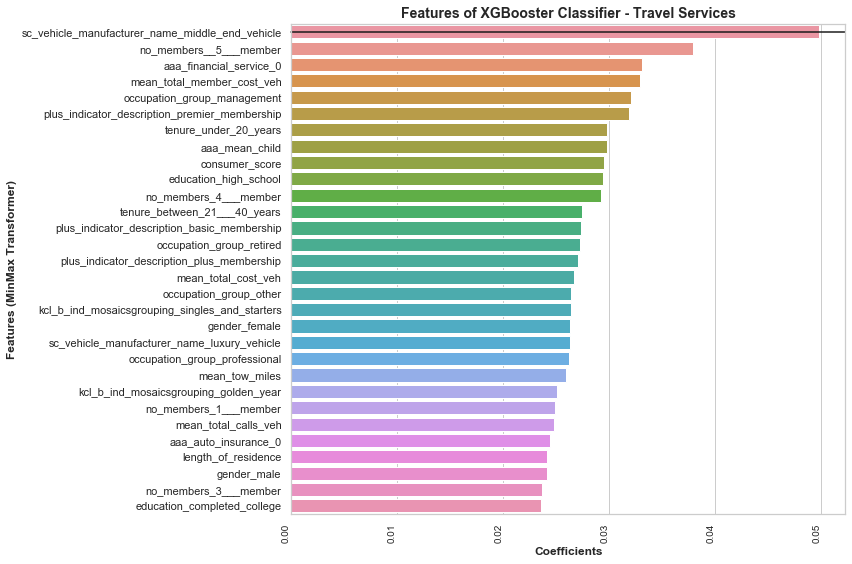

In [145]:
# Bar graph of Coefficients
sns.set(style="whitegrid")
plt.axhline(0, color="k", clip_on=False)
plt.ylabel("Coefs",fontsize=12, fontweight='bold')
plt.xlabel("Features", fontsize=12, fontweight='bold')
plt.title('Features of XGBooster Classifier - '+var_to_predict_title,loc='center', fontdict={'fontsize':14, 'fontweight':'bold'})
sns.barplot(y=counts_xgb['Features (MinMax Transformer)'], x=counts_xgb['Coefficients'], orient='h')
plt.xticks(
    rotation=90, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='small')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_xgb_coef_1')
plt.show()

# Observation


*	Logistic Regression Classifier
    *	Logistic Regression - Accuracy training          : 0.602
    *	Logistic Regression - Accuracy test              : 0.574
    *	Logistic Regression - Precision                  : 0.572
    *	Logistic Regression - Recall                     : 0.547
    *	Logistic Regression - F-measure                  : 0.559
    *	Logistic Regression - Log-Loss                   : 14.707
    *	Logistic Regression - Cross Entropy Loss         : 2.578
    *	Logistic Regression - No Skill - ROC AUC         : 0.500
    *	Logistic Regression - ROC AUC                    : 0.592
    *	Logistic Regression - Cross Validation Accuracy  : 0.570 (+/- 0.054)

*	KNN Classifier
    *	Accuracy of K-NN classifier on training set: 0.988
    *	Accuracy of K-NN classifier on test set: 0.821
    *	K-NN classifier - Precision                  : 0.764
    *	K-NN classifier - Recall                     : 0.923
    *	K-NN classifier - F-measure                  : 0.836
    *	K-NN classifier - Log-Loss                   : 6.176
    *	K-NN Classifier - Cross Entropy Loss         : 0.441
    *	K-NN classifier - No Skill - ROC AUC         : 0.500
    *	K-NN classifier - ROC AUC                    : 0.822
    *	K-NN classifier - Cross Validation Accuracy  : 0.761 (+/- 0.063)

*	Decision Tree Classifier
    *	CART - Accuracy on training set: 0.992
    *	CART - Accuracy on test set: 0.815
    *	CART - Precision                  : 0.748
    *	CART - Recall                     : 0.945
    *	CART - F-measure                  : 0.835
    *	CART - Log-Loss                   : 6.375
    *	CART - Cross Entropy Loss         : 0.314
    *	CART - No Skill - ROC AUC         : 0.500
    *	CART - ROC AUC                    : 0.822
    *	CART - Cross Validation Accuracy  : 0.746 (+/- 0.045)

*	Random Forest
    *	Random Forest - Accuracy on training set   : 0.992
    *	Random Forest - Accuracy on test set       : 0.834
    *	Random Forest - Precision                  : 0.770
    *	Random Forest - Recall                     : 0.948
    *	Random Forest - F-measure                  : 0.850
    *	Random Forest - Log-Loss                   : 5.723
    *	Random Forest - Cross Entropy Loss         : 0.296
    *	Random Forest - No Skill - ROC AUC         : 0.500
    *	Random Forest - ROC AUC                    : 0.843
    *	Random Forest - Cross Validation Accuracy  : 0.759 (+/- 0.055)	

*	Extra Tree Classifier
    *	Extra Tree Classifier - Accuracy on training set: 0.992
    *	Extra Tree Classifier - Accuracy on test set: 0.915
    *	Extra Tree Classifier - Precision                  : 0.903
    *	Extra Tree Classifier - Recall                     : 0.928
    *	Extra Tree Classifier - F-measure                  : 0.915
    *	Extra Tree Classifier - Log-Loss                   : 2.934
    *	Extra Tree Classifier - Cross Entropy Loss         : 0.411
    *	Extra Tree Classifier - No Skill - ROC AUC         : 0.500
    *	Extra Tree Classifier - ROC AUC                    : 0.961
    *	Extra Tree Classifier - Cross Validation Accuracy  : 0.819 (+/- 0.061)

*	XGBoost Classifier 
    *	XGBoost Classifier - Accuracy on training set   : 0.986
    *	XGBoost Classifier - Accuracy on test set       : 0.861
    *	XGBoost Classifier - Precision                  : 0.827
    *	XGBoost Classifier - Recall                     : 0.909
    *	XGBoost Classifier - F-measure                  : 0.866
    *	XGBoost Classifier - Log-Loss                   : 4.800
    *	XGBoost Classifier - Cross Entropy Loss         : 0.519
    *	XGBoost Classifier - No Skill - ROC AUC         : 0.500
    *	XGBoost Classifier - ROC AUC                    : 0.937
    *	XGBoost Classifier - Cross Validation Accuracy  : 0.769 (+/- 0.044)

# Select From model - Reduce dimensionality
Reduce the number of features

In [146]:
print("Number of feature before reduction : ",trainX.shape[1])
# Going to use XGBoost model built previously as it has 2nd best accuracy
model = SelectFromModel(xgb, prefit=True)
trainX_svc = model.transform(trainX)
print("Number of feature after reduction : ",trainX_svc.shape[1]) #reduction from 72 to 14 features
feature_idx = model.get_support()
feature_reduced = trainX.columns[feature_idx]
print('Features Selected using XGBoost Classifier')
for i in range(len(feature_reduced)):
    print(i+1, " - ",feature_reduced[i])

Number of feature before reduction :  40
Number of feature after reduction :  23
Features Selected using XGBoost Classifier
1  -  consumer_score
2  -  mean_total_cost_veh
3  -  mean_total_member_cost_veh
4  -  mean_tow_miles
5  -  aaa_mean_child
6  -  aaa_financial_service_0
7  -  plus_indicator_description_basic_membership
8  -  plus_indicator_description_plus_membership
9  -  plus_indicator_description_premier_membership
10  -  occupation_group_management
11  -  occupation_group_other
12  -  occupation_group_professional
13  -  occupation_group_retired
14  -  sc_vehicle_manufacturer_name_luxury_vehicle
15  -  sc_vehicle_manufacturer_name_middle_end_vehicle
16  -  tenure_between_21___40_years
17  -  tenure_under_20_years
18  -  no_members__5___member
19  -  no_members_4___member
20  -  gender_female
21  -  kcl_b_ind_mosaicsgrouping_golden_year
22  -  kcl_b_ind_mosaicsgrouping_singles_and_starters
23  -  education_high_school


In [149]:
# Modeling using ExtraTreeClassifier with new features
np.random.seed(42)
trainX_reduced = pd.DataFrame(trainX, columns=feature_reduced)
testX_reduced = pd.DataFrame(testX, columns=feature_reduced)

#create a dictionary of all values we want to test
param_grid = { 'criterion':['gini','entropy'],'max_depth': np.arange(90, 125,1)}

# Random Forest Classifier model
et_reduced = ExtraTreesClassifier()

#use gridsearch to test all values
et_gscv_reduced = GridSearchCV(et_reduced, param_grid, cv=num_folds, scoring=scoring)

#fit model to data
et_gscv_reduced.fit(trainX_reduced, trainy)
print('Best parameters : ', et_gscv_reduced.best_params_)
print('Best score      : ', et_gscv_reduced.best_score_)

# Best parameters :  {'criterion': 'entropy', 'max_depth': 102}
# Best score      :  0.8468065268065267

Best parameters :  {'criterion': 'entropy', 'max_depth': 116}
Best score      :  0.8464605569868727


ExtraTree Classifier with Reduced Features
Extra Tree Classifier - Accuracy on training set   : 0.941
Extra Tree Classifier - Accuracy on test set       : 0.844
Extra Tree Classifier - Precision                  : 0.827
Extra Tree Classifier - Recall                     : 0.865
Extra Tree Classifier - F-measure                  : 0.846
Extra Tree Classifier - Log-Loss                   : 5.379
Extra Tree Classifier - Cross Entropy Loss         : 0.767
Extra Tree Classifier - No Skill - ROC AUC         : 0.500
Extra Tree Classifier - ROC AUC                    : 0.929
Extra Tree Classifier - Cross Validation Accuracy  : 0.786 (+/- 0.059)


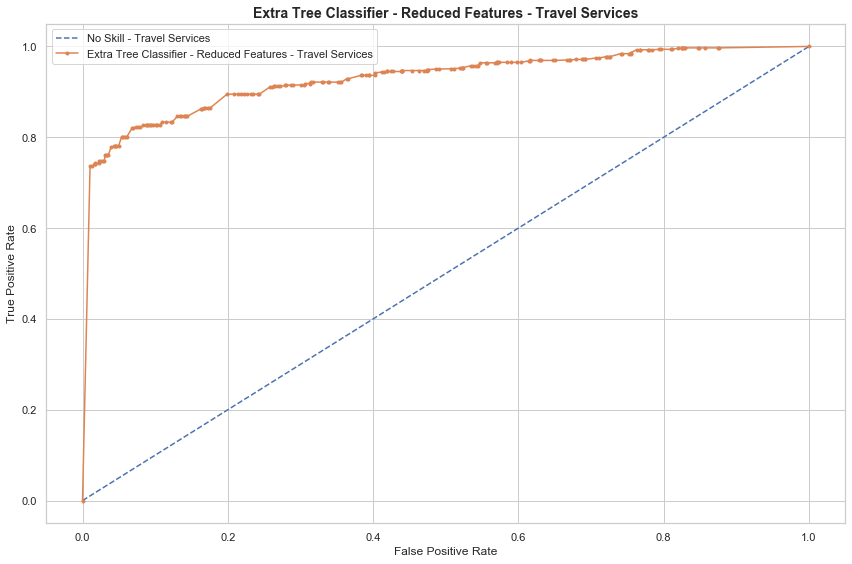

In [150]:
# Modeling based on the outcome of the grid serach of the Extratree Classifier
# Best parameters :  {'criterion': 'entropy', 'max_depth': 116}
# Best score      :  0.8464605569868727

et_reduced = ExtraTreesClassifier(criterion = 'entropy', max_depth=116)
et_reduced.fit(trainX_reduced, trainy)

# Predict on test set
yhat_reduced = et_reduced.predict(testX_reduced)

# Generate a no skill prediction for ROC Curve
ns_probs_reduced = [0 for _ in range(len(testy))]

# Predict probabilities
et_probs_reduced = et_reduced.predict_proba(testX_reduced)

# Keep probabilities for the positive outcome only
et_probs_reduced = et_probs_reduced[:, 1]

# Calculate scores
ns_auc_reduced = roc_auc_score(testy, ns_probs_reduced)
et_auc_reduced = roc_auc_score(testy, et_probs_reduced)

# Calculate Cross valdation scores
scores_et_reduced = cross_val_score(et_reduced, testX_reduced, testy, cv=num_folds)

print('ExtraTree Classifier with Reduced Features')
print("Extra Tree Classifier - Accuracy on training set   : {:.3f}".format(et_reduced.score(trainX_reduced, trainy)))
print("Extra Tree Classifier - Accuracy on test set       : {:.3f}".format(et_reduced.score(testX_reduced, testy)))

# Evaluate predictions
#print('Accuracy                   : %.3f' % accuracy_score(testy, yhat))
print('Extra Tree Classifier - Precision                  : %.3f' % precision_score(testy, yhat_reduced))
print('Extra Tree Classifier - Recall                     : %.3f' % recall_score(testy, yhat_reduced))
print('Extra Tree Classifier - F-measure                  : %.3f' % f1_score(testy, yhat_reduced))
print('Extra Tree Classifier - Log-Loss                   : %.3f' % log_loss(testy, yhat_reduced))
print('Extra Tree Classifier - Cross Entropy Loss         : %.3f' % cross_entropy(yhat_reduced, testy[var_to_predict[0]]))
print('Extra Tree Classifier - No Skill - ROC AUC         : %.3f' % (ns_auc_reduced))
print('Extra Tree Classifier - ROC AUC                    : %.3f' % (et_auc_reduced))
print("Extra Tree Classifier - Cross Validation Accuracy  : %0.3f (+/- %0.3f)" % (scores_et_reduced.mean(), 
                                                                                  scores_et_reduced.std() * 2))

# calculate roc curves
ns_fpr_reduced, ns_tpr_reduced, _ = roc_curve(testy, ns_probs_reduced)
et_fpr_reduced, et_tpr_reduced, _ = roc_curve(testy, et_probs_reduced)
# plot the roc curve for the model
plt.plot(ns_fpr_reduced, ns_tpr_reduced, linestyle='--', label='No Skill - '+var_to_predict_title)
plt.plot(et_fpr_reduced, et_tpr_reduced, marker='.', label='Extra Tree Classifier - Reduced Features - '+var_to_predict_title)
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.legend()
plt.title('Extra Tree Classifier - Reduced Features - '+var_to_predict_title,loc='center', 
          fontdict={'fontsize':14, 'fontweight':'bold'})
# show the plot
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_et_roc_reduced')
plt.show()

# Gain and Lift charts of the final model

# Cummulative Gain Charts
The cumulative gains chart is used to determine the effectiveness of a binary classifier. A detailed explanation can be found at http://mlwiki.org/index.php/Cumulative_Gain_Chart. The implementation here works only for binary classification.

# Lift Charts
The lift curve is used to determine the effectiveness of a binary classifier. A detailed explanation can be found at http://www2.cs.uregina.ca/~dbd/cs831/notes/lift_chart/lift_chart.html.

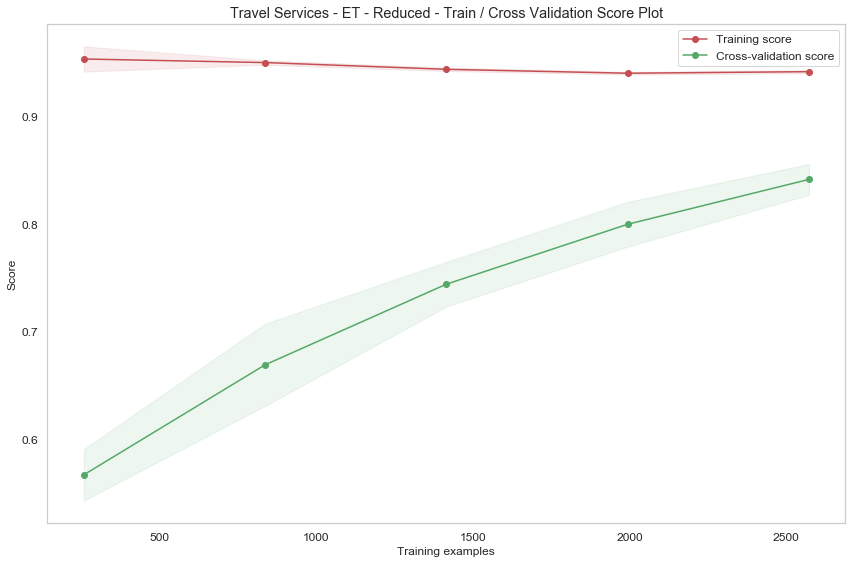

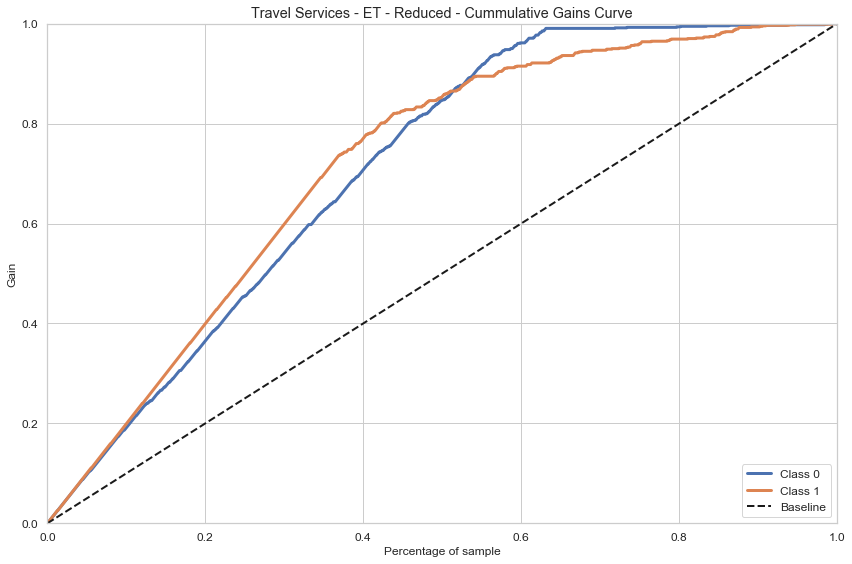

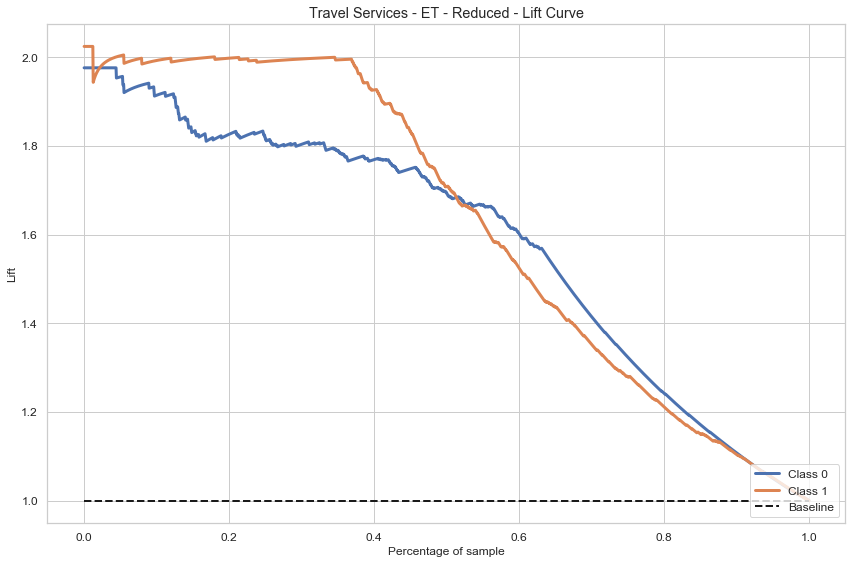

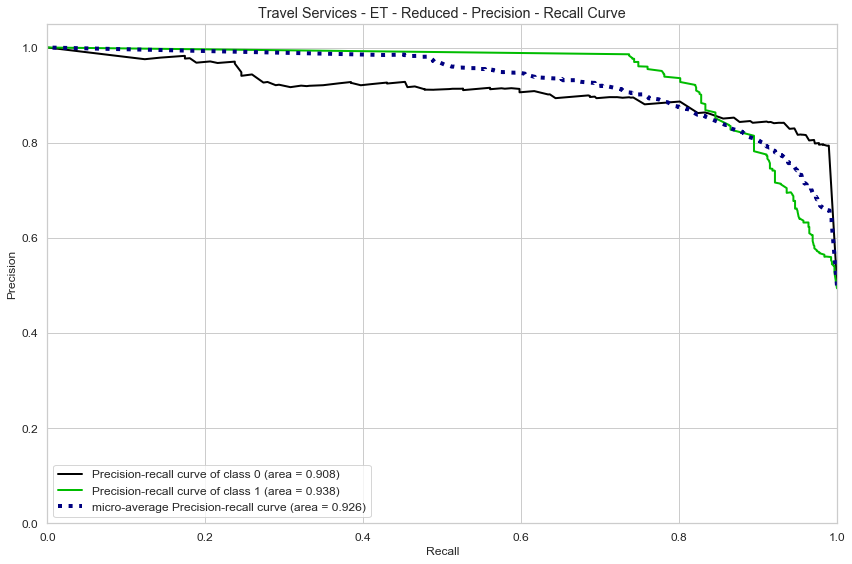

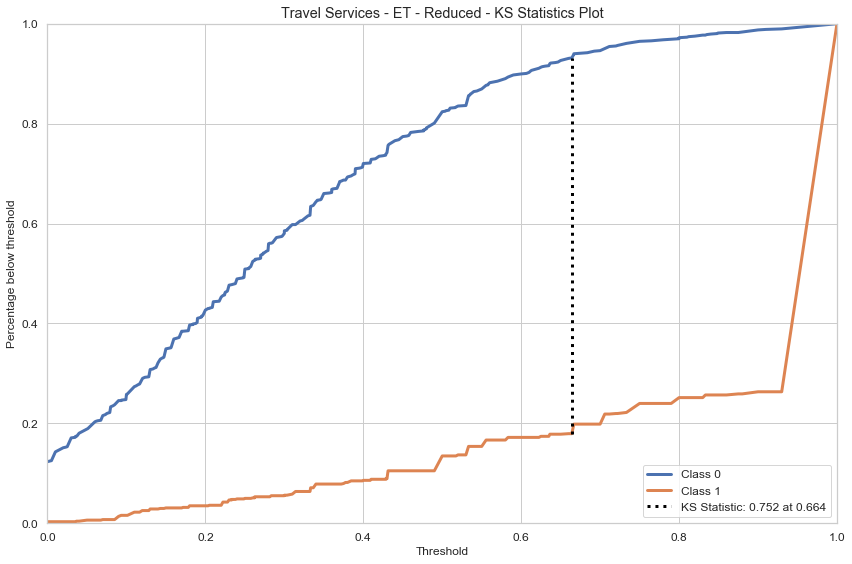

In [151]:
# Train / Cross Validation Score Plot
skplt.estimators.plot_learning_curve(et_reduced, trainX_reduced, trainy, cv=num_folds, title=var_to_predict_title + ' - ET - Reduced - Train / Cross Validation Score Plot')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_et_reduced_txcval')
plt.show()

# Cummulative Gain Plot
skplt.metrics.plot_cumulative_gain(testy,et_reduced.predict_proba(testX_reduced), title=var_to_predict_title + ' - ET - Reduced - Cummulative Gains Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_et_reduced_cgc')
plt.show()

# Lift Curve Plot
skplt.metrics.plot_lift_curve(testy,et_reduced.predict_proba(testX_reduced), title=var_to_predict_title + ' - ET - Reduced - Lift Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_et_reduced_liftc')
plt.show()

# Precision - Recall Curve
skplt.metrics.plot_precision_recall_curve(testy,et_reduced.predict_proba(testX_reduced), title=var_to_predict_title + ' - ET - Reduced - Precision - Recall Curve')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_et_reduced_prerecc')
plt.show()

# KS statistics Plot
skplt.metrics.plot_ks_statistic(testy, et_reduced.predict_proba(testX_reduced), title=var_to_predict_title+' - ET - Reduced - KS Statistics Plot')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_et_reduced_ksst')
plt.show()

• Join your training and validation sets. Score all the members that do not have the purchase of a product with the probability of purchase. If they have purchased the product, score them a 1.

In [157]:
# Get the entire dataset and select the proper features
join_df_X = pd.DataFrame(df_prediction, columns=feature_reduced)
et_prob_all = et_reduced.predict_proba(join_df_X)

In [158]:
# Constructing new data Frame
# Actual value of a member to cancel
join_df_X[var_to_predict] = df_household[var_to_predict]
# Get membership ID
join_df_X['membership_id'] = df_household['membership_id']
# Construct Probality data
df_et_prob_all = pd.DataFrame({'no_travel': et_prob_all[:, 0], 
                               'yes_travel': et_prob_all[:, 1]}, 
                              index=df_household.index
                             )
join_df_X['yes_travel'] =  df_et_prob_all['yes_travel']
join_df_X['yes_travel']=np.where(join_df_X[var_to_predict[0]]== 1, 1, join_df_X['yes_travel'])

In [159]:
join_df_X.head(10)

,consumer_score,mean_total_cost_veh,mean_total_member_cost_veh,mean_tow_miles,aaa_mean_child,aaa_financial_service_0,plus_indicator_description_basic_membership,plus_indicator_description_plus_membership,plus_indicator_description_premier_membership,occupation_group_management,occupation_group_other,occupation_group_professional,occupation_group_retired,sc_vehicle_manufacturer_name_luxury_vehicle,sc_vehicle_manufacturer_name_middle_end_vehicle,tenure_between_21___40_years,tenure_under_20_years,no_members__5___member,no_members_4___member,gender_female,kcl_b_ind_mosaicsgrouping_golden_year,kcl_b_ind_mosaicsgrouping_singles_and_starters,education_high_school,aaa_travel,membership_id,yes_travel
0,0.0137,47.0448,132.3705,0.0889,2.0000,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,153,0.1300
2,0.0123,46.9483,117.0838,0.0000,1.0000,1,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,163,0.1100
3,0.0143,47.6622,208.3822,0.0000,1.0000,1,1,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,182,0.1300
4,0.0156,48.7608,175.4411,1.1667,2.0000,1,1,0,0,0,0,0,1,0,0,0,1,0,0,1,1,0,0,1,188,1.0000
5,0.0132,46.5612,152.5169,1.7500,4.5000,1,1,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,191,0.2000
7,0.0149,0.0072,8.4416,0.0000,2.0000,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,205,0.2100
8,0.0164,44.5439,150.9191,0.0000,0.0000,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,208,0.0900
12,0.0149,0.0072,8.4416,0.3000,1.0000,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,282,0.1650
13,0.0149,47.5716,145.2741,0.0000,1.0000,1,1,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,335,0.2400
15,0.0172,45.6666,162.8920,0.0000,2.0000,1,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,342,0.3500


In [160]:
# Save all Data and final models
filename = './save_models/'+var_to_predict_save+'_finalized_model_et.sav'
pickle.dump(et_reduced, open(filename, 'wb'))

# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(testX_reduced, testy)
print(result)

filename = var_to_predict_save+'_reduced_feature_outcome.csv'
save_data(join_df_X,filename)

0.844257996853697


# Not used from this point below. 

# Keras Modeling

In [ ]:
# Keras Classifier
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.optimizers import SGD


np.random.seed(42)
# Create input and output dataframes

num_folds = 10
scoring = 'accuracy'

# create model
keras_nn = Sequential()
keras_nn.add(Dense(trainX.shape[1], input_dim=trainX.shape[1], activation='relu'))
keras_nn.add(Dropout(0.2))
keras_nn.add(Dense(int(trainX.shape[1]/2), activation='relu'))
keras_nn.add(Dense(1, activation='sigmoid'))
# Compile model
sgd = SGD(lr=0.01, momentum=0.8)
keras_nn.compile(loss='binary_crossentropy', optimizer=sgd, metrics=[scoring])
# Fit the model
history = keras_nn.fit(trainX, trainy, validation_data=(testX,testy), epochs=150, batch_size=10, verbose=1)
# evaluate the model
scores = keras_nn.evaluate(trainX, trainy, verbose=0)
print("Keras - Accuracy Train Set : %.3f" % scores[1])
scores = keras_nn.evaluate(testX, testy, verbose=0)
print("Keras - Accuracy Test Set  : %.3f" % scores[1])

In [ ]:
# Visualize training history
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Keras Model accuracy - '+var_to_predict_title )
plt.ylabel('Accuracy')
plt.xlabel('epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_keras_model_1')
plt.show()

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Keras Model Loss - '+ var_to_predict_title)
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.savefig('./model_pics/Travel/'+var_to_predict_save+'_keras_model_2')
plt.show()

# SVM Model

In [ ]:
# SVM grid search evaluation

np.random.seed(42)
num_folds = 10
scoring = 'accuracy'

c_values = [0.1, 0.3, 0.5, 0.7, 0.9, 1.0, 1.3, 1.5, 1.7, 2.0, 2.3, 2.5, 2.7, 3.0]
kernel_values = ['linear', 'poly', 'rbf', 'sigmoid']
param_grid = dict(C=c_values, kernel=kernel_values)
svc = SVC(gamma='auto')
kfold = KFold(n_splits=num_folds)
grid = GridSearchCV(estimator=svc, param_grid=param_grid, scoring=scoring, cv=kfold, iid=True)
grid_result = grid.fit(trainX, trainy)
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

# Scaler Testing

In [ ]:
# Scale fields using Standard Scaler

features_to_scale = ['aaa_mean_age', 'length_of_residence', 'aaa_mean_child', 
                     'total_calls', 'total_member_cost', 'total_cost'
                    ]
df = pd.DataFrame(df_test_over, columns=features_to_scale)

# Standard Scaler
scaler = StandardScaler()
scaled_df_std = scaler.fit_transform(df)
scaled_df_std = pd.DataFrame(scaled_df_std, columns=features_to_scale)


for col in features_to_scale:
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
    
    ax1.set_title('Before Scaling Standard Scaler')
    ax2.set_title('After Standard Scaler')

    sns.kdeplot(df[col], ax=ax1)
    sns.kdeplot(scaled_df_std[col], ax=ax2)
    plt.show()

In [ ]:
scaled_df_std.describe()

In [ ]:
# Scale fields using Min-Max scaler

features_to_scale = ['aaa_mean_age', 'length_of_residence', 'aaa_mean_child', 
                     'total_calls', 'total_member_cost', 'total_cost'
                    ]
df = pd.DataFrame(df_test_over, columns=features_to_scale)

# Min-Max Scaler
scaler = MinMaxScaler()
scaled_df_mm = scaler.fit_transform(df)
scaled_df_mm = pd.DataFrame(scaled_df_mm, columns=features_to_scale)

for col in features_to_scale:
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
    ax1.set_title('Before Scaling Min-Max')
    sns.kdeplot(df[col], ax=ax1)
    ax2.set_title('After Min-Max Scaling')
    sns.kdeplot(scaled_df_mm[col], ax=ax2)
    plt.show()

In [ ]:
scaled_df_mm.describe()

In [ ]:
# Scale fields using Robust Scaler

features_to_scale = ['aaa_mean_age', 'length_of_residence', 'aaa_mean_child', 
                     'total_calls', 'total_member_cost', 'total_cost'
                    ]
df = pd.DataFrame(df_test_over, columns=features_to_scale)

# Robust Scaler- excellent with outliers
scaler = RobustScaler()
scaled_df_rs = scaler.fit_transform(df)
scaled_df_rs = pd.DataFrame(scaled_df_rs, columns=features_to_scale)
for col in features_to_scale:
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
    ax1.set_title('Before Scaling Robust Scaling')
    sns.kdeplot(df[col], ax=ax1)
    ax2.set_title('After Robust Scaling')
    sns.kdeplot(scaled_df_rs[col], ax=ax2)
    plt.show()

In [ ]:
scaled_df_rs.describe()

In [ ]:
# Scale fields using Normalizer

features_to_scale = ['aaa_mean_age', 'length_of_residence', 'aaa_mean_child', 
                     'total_calls', 'total_member_cost', 'total_cost'
                    ]
df = pd.DataFrame(df_test_over, columns=features_to_scale)

# Normalizer
scaler = Normalizer()
scaled_df_nm = scaler.fit_transform(df)
scaled_df_nm = pd.DataFrame(scaled_df_nm, columns=features_to_scale)
for col in features_to_scale:
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
    ax1.set_title('Before Scaling Normalizer')
    sns.kdeplot(df[col], ax=ax1)
    ax2.set_title('After Normalizer')
    sns.kdeplot(scaled_df_nm[col], ax=ax2)
    plt.show()

In [ ]:
scaled_df_nm.describe()

In [ ]:
# Scale fields using Quantile Transformer

features_to_scale = ['aaa_mean_age', 'length_of_residence', 'aaa_mean_child', 
                     'total_calls', 'total_member_cost', 'total_cost'
                    ]
df = pd.DataFrame(df_test_over, columns=features_to_scale)

# QuantileTransformer
scaler = QuantileTransformer(n_quantiles=200, output_distribution='normal')
scaled_df_qt = scaler.fit_transform(df)
scaled_df_qt = pd.DataFrame(scaled_df_qt, columns=features_to_scale)
for col in features_to_scale:
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
    ax1.set_title('Before Scaling QuantileTransformer')
    sns.kdeplot(df[col], ax=ax1)
    ax2.set_title('After QuantileTransformer')
    sns.kdeplot(scaled_df_nm[col], ax=ax2)
    plt.show()

In [ ]:
scaled_df_qt.describe()

In [ ]:
# Scale fields using Power Transformer

features_to_scale = ['aaa_mean_age', 'length_of_residence', 'aaa_mean_child', 
                     'total_calls', 'total_member_cost', 'total_cost'
                    ]
df = pd.DataFrame(df_test_over, columns=features_to_scale)

# PowerTransformer
scaler = PowerTransformer(method='yeo-johnson', standardize=True, copy=True)
scaled_df_pt = scaler.fit_transform(df)
scaled_df_pt = pd.DataFrame(scaled_df_pt, columns=features_to_scale)
for col in features_to_scale:
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
    ax1.set_title('Before Scaling PowerTransformer')
    sns.kdeplot(df[col], ax=ax1)
    ax2.set_title('After PowerTransformer')
    sns.kdeplot(scaled_df_nm[col], ax=ax2)
    plt.show()

In [ ]:
scaled_df_pt.describe()

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(df_test_over[var_to_predict[0]].values)
plt.xlabel('Row number')
plt.ylabel('y value')
plt.title('Change in y value over the data set')
plt.show();